# M5 Modeling

## Data Loading

In [1]:
import pandas as pd
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np
import darts.timeseries as ts 
import matplotlib.pyplot as plt

import darts.models as models
from darts import TimeSeries
from darts.utils.utils import ModelMode, SeasonalityMode
from sklearn.preprocessing import StandardScaler
import warnings
from sktime.forecasting.model_selection import SlidingWindowSplitter
from useful_functions import *
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import TimeSeriesSplit
import itertools
import logging
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.ensemble import IsolationForest
from darts import TimeSeries
from sklearn.model_selection import GridSearchCV
from darts.models import LightGBMModel

In [2]:
GENERATE_DATA = False
INPUT_DIR = 'data'
# INPUT_DIR = 'C:/Users/34674/Documents/4º datos/Proyecto/data'
# INPUT_DIR = 'C:/Users/Curro/OneDrive - Universidad Carlos III de Madrid/Cuarto/Data Science Project/data'

In [3]:
if GENERATE_DATA:
    print("Grouping the data to StoreID and saving to parquet file...")

    df_sales_train = pd.read_parquet(f'{INPUT_DIR}/df_sales_train.parquet')
    stores_train = df_sales_train.groupby(['date', 'store_id'])['sales'].sum().unstack(level=1)
    
    df_sales_test = pd.read_parquet(f'{INPUT_DIR}/df_sales_test.parquet') 
    stores_test = df_sales_test.groupby(['date', 'store_id'])['sales'].sum().unstack(level=1)

    # Save the dataframe to a parquet file
    stores_train.to_parquet(f'{INPUT_DIR}/stores_train.parquet', index=True)
    stores_test.to_parquet(f'{INPUT_DIR}/stores_test.parquet', index=True)
    print("Data saved to parquet file.")
else:
    stores_train = pd.read_parquet(f'{INPUT_DIR}/stores_train.parquet')
    stores_test = pd.read_parquet(f'{INPUT_DIR}/stores_test.parquet')

In [4]:
stores_train

store_id,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3
date,,,,,,,,,,
2011-01-29,4337,3494,4739,1625,2556,3852,3030,2704,2256,4038
2011-01-30,4155,3046,4827,1777,2687,3937,3006,2194,1922,4198
2011-01-31,2816,2121,3785,1386,1822,2731,2225,1562,2018,3317
2011-02-01,3051,2324,4232,1440,2258,2954,2169,1251,2522,3211
2011-02-02,2630,1942,3817,1536,1694,2492,1726,2,1175,2132
...,...,...,...,...,...,...,...,...,...,...
2014-12-27,4226,2644,5685,1995,2866,3206,2965,3631,2844,2532
2014-12-28,4407,2650,6050,2015,2661,2986,2828,2993,2755,2549
2014-12-29,3825,2264,5170,2147,2743,3292,3008,2818,2560,2163


In [5]:
stores_test

store_id,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3
date,,,,,,,,,,
2011-01-29,4337,3494,4739,1625,2556,3852,3030,2704,2256,4038
2011-01-30,4155,3046,4827,1777,2687,3937,3006,2194,1922,4198
2011-01-31,2816,2121,3785,1386,1822,2731,2225,1562,2018,3317
2011-02-01,3051,2324,4232,1440,2258,2954,2169,1251,2522,3211
2011-02-02,2630,1942,3817,1536,1694,2492,1726,2,1175,2132
...,...,...,...,...,...,...,...,...,...,...
2015-12-27,4010,4350,5585,2080,2859,3735,2933,3649,2972,3205
2015-12-28,3867,3717,5316,2143,2737,3447,2981,1521,2342,1893
2015-12-29,3884,3646,5086,2053,2618,3164,3102,2683,3016,2641


# Including Events

In [6]:
calendar = pd.read_csv(f'{INPUT_DIR}/calendar.csv')

events = calendar[calendar["event_name_1"].notna()]

events["holiday"] = events["event_name_1"]

holidays = events[["date", "holiday"]].rename(columns={"date": "ds"})

holidays = holidays.reset_index(drop=True)

C:\Users\Alejo-Lenovo\AppData\Local\Temp\ipykernel_20936\1058615362.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  events["holiday"] = events["event_name_1"]


In [7]:
holidays.head(10)
holidays.head(-10)


,ds,holiday
0,2011-02-06,SuperBowl
1,2011-02-14,ValentinesDay
2,2011-02-21,PresidentsDay
3,2011-03-09,LentStart
4,2011-03-16,LentWeek2
...,...,...
147,2016-02-10,LentStart
148,2016-02-14,ValentinesDay
149,2016-02-15,PresidentsDay
150,2016-02-17,LentWeek2


In [8]:
# holidays['holiday'] = holidays['holiday'].apply(lambda x: 1 if x != 'No Holiday' else 0)
holidays.head(10)
holidays.head(-10)

,ds,holiday
0,2011-02-06,SuperBowl
1,2011-02-14,ValentinesDay
2,2011-02-21,PresidentsDay
3,2011-03-09,LentStart
4,2011-03-16,LentWeek2
...,...,...
147,2016-02-10,LentStart
148,2016-02-14,ValentinesDay
149,2016-02-15,PresidentsDay
150,2016-02-17,LentWeek2


### Test data

In [9]:
# Reset the index of stores_train to keep the 'date' column after merging
stores_test_reset = stores_test.reset_index()

# Ensure both columns to merge on are datetime
holidays['ds'] = pd.to_datetime(holidays['ds'])

# Merge the two datasets
merged_data = stores_test_reset.merge(
    holidays, how="left", left_on="date", right_on="ds"
)

# Replace NaN in the holiday column with "No Holiday"
merged_data["holiday"] = merged_data["holiday"].fillna("No Holiday")

# Drop the `ds` column if not needed after merge
merged_data = merged_data.drop(columns=["ds"])

# Set the 'date' column back as the index if desired
merged_data = merged_data.set_index("date")

# Display the merged data
merged_data.head(10)
merged_data.head(-10)


,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3,holiday
date,,,,,,,,,,,
2011-01-29,4337,3494,4739,1625,2556,3852,3030,2704,2256,4038,No Holiday
2011-01-30,4155,3046,4827,1777,2687,3937,3006,2194,1922,4198,No Holiday
2011-01-31,2816,2121,3785,1386,1822,2731,2225,1562,2018,3317,No Holiday
2011-02-01,3051,2324,4232,1440,2258,2954,2169,1251,2522,3211,No Holiday
2011-02-02,2630,1942,3817,1536,1694,2492,1726,2,1175,2132,No Holiday
...,...,...,...,...,...,...,...,...,...,...,...
2015-12-17,3791,3363,5516,2083,3000,3629,3768,3157,3925,3222,No Holiday
2015-12-18,3843,3573,5074,2104,2639,3506,3230,3765,3718,3304,No Holiday
2015-12-19,5317,5764,6408,2451,3303,4167,3516,4654,4217,3691,No Holiday


In [10]:
# stores_test['event'] = merged_data['holiday'].apply(lambda x: 1 if x != 'No Holiday' else 0)
stores_test['event'] = merged_data['holiday']

stores_test.head(10)
stores_test.head(-10)

store_id,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3,event
date,,,,,,,,,,,
2011-01-29,4337,3494,4739,1625,2556,3852,3030,2704,2256,4038,No Holiday
2011-01-30,4155,3046,4827,1777,2687,3937,3006,2194,1922,4198,No Holiday
2011-01-31,2816,2121,3785,1386,1822,2731,2225,1562,2018,3317,No Holiday
2011-02-01,3051,2324,4232,1440,2258,2954,2169,1251,2522,3211,No Holiday
2011-02-02,2630,1942,3817,1536,1694,2492,1726,2,1175,2132,No Holiday
...,...,...,...,...,...,...,...,...,...,...,...
2015-12-17,3791,3363,5516,2083,3000,3629,3768,3157,3925,3222,No Holiday
2015-12-18,3843,3573,5074,2104,2639,3506,3230,3765,3718,3304,No Holiday
2015-12-19,5317,5764,6408,2451,3303,4167,3516,4654,4217,3691,No Holiday


### Train Data

In [11]:
# Reset the index of stores_train to keep the 'date' column after merging
stores_train_reset = stores_train.reset_index()

# Ensure both columns to merge on are datetime
holidays['ds'] = pd.to_datetime(holidays['ds'])

# Merge the two datasets
merged_data = stores_train_reset.merge(
    holidays, how="left", left_on="date", right_on="ds"
)

# Replace NaN in the holiday column with "No Holiday"
merged_data["holiday"] = merged_data["holiday"].fillna("No Holiday")

# Drop the `ds` column if not needed after merge
merged_data = merged_data.drop(columns=["ds"])

# Set the 'date' column back as the index if desired
merged_data = merged_data.set_index("date")

# Display the merged data
merged_data.head(10)
merged_data.head(-10)


,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3,holiday
date,,,,,,,,,,,
2011-01-29,4337,3494,4739,1625,2556,3852,3030,2704,2256,4038,No Holiday
2011-01-30,4155,3046,4827,1777,2687,3937,3006,2194,1922,4198,No Holiday
2011-01-31,2816,2121,3785,1386,1822,2731,2225,1562,2018,3317,No Holiday
2011-02-01,3051,2324,4232,1440,2258,2954,2169,1251,2522,3211,No Holiday
2011-02-02,2630,1942,3817,1536,1694,2492,1726,2,1175,2132,No Holiday
...,...,...,...,...,...,...,...,...,...,...,...
2014-12-17,3611,2032,4743,2330,2884,3374,3126,2793,3237,2022,No Holiday
2014-12-18,3836,2406,5232,2027,3179,3409,3441,3088,3330,2419,No Holiday
2014-12-19,3832,2338,4359,1903,2424,2830,2972,3362,3322,2492,No Holiday


In [12]:
# Convert the 'holiday' column to a binary value (1 for event, 0 for no event)

# stores_train['event'] = merged_data['holiday'].apply(lambda x: 1 if x != 'No Holiday' else 0)
stores_train['event'] = merged_data['holiday']
# Now 'event' is a binary column (1 for event days, 0 for regular days)
# Display the merged data
stores_train.head(20)
stores_train.head(-10)

store_id,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3,event
date,,,,,,,,,,,
2011-01-29,4337,3494,4739,1625,2556,3852,3030,2704,2256,4038,No Holiday
2011-01-30,4155,3046,4827,1777,2687,3937,3006,2194,1922,4198,No Holiday
2011-01-31,2816,2121,3785,1386,1822,2731,2225,1562,2018,3317,No Holiday
2011-02-01,3051,2324,4232,1440,2258,2954,2169,1251,2522,3211,No Holiday
2011-02-02,2630,1942,3817,1536,1694,2492,1726,2,1175,2132,No Holiday
...,...,...,...,...,...,...,...,...,...,...,...
2014-12-17,3611,2032,4743,2330,2884,3374,3126,2793,3237,2022,No Holiday
2014-12-18,3836,2406,5232,2027,3179,3409,3441,3088,3330,2419,No Holiday
2014-12-19,3832,2338,4359,1903,2424,2830,2972,3362,3322,2492,No Holiday


In [13]:
# One-hot encode the 'event' column to create binary columns for each event
events_dummies_train = pd.get_dummies(stores_train['event'], prefix='event').astype(int)
events_dummies_test = pd.get_dummies(stores_test['event'], prefix='event').astype(int)

# Combine the binary columns with the original data
stores_train = pd.concat([stores_train, events_dummies_train], axis=1)
stores_test = pd.concat([stores_test, events_dummies_test], axis=1)

# Fill missing event columns in test/train data with 0 (if an event doesn't exist in one of them)
missing_cols = set(stores_train.columns) - set(stores_test.columns)
for col in missing_cols:
    stores_test[col] = 0

missing_cols = set(stores_test.columns) - set(stores_train.columns)
for col in missing_cols:
    stores_train[col] = 0

# Ensure both dataframes have the same column order
stores_train = stores_train[sorted(stores_train.columns)]
stores_test = stores_test[sorted(stores_test.columns)]

# Display updated datasets
print("Updated Training Data:")
print(stores_train.head())
print("\nUpdated Testing Data:")
print(stores_test.head())


Updated Training Data:
            CA_1  CA_2  CA_3  CA_4  TX_1  TX_2  TX_3  WI_1  WI_2  WI_3  ...  \
date                                                                    ...   
2011-01-29  4337  3494  4739  1625  2556  3852  3030  2704  2256  4038  ...   
2011-01-30  4155  3046  4827  1777  2687  3937  3006  2194  1922  4198  ...   
2011-01-31  2816  2121  3785  1386  1822  2731  2225  1562  2018  3317  ...   
2011-02-01  3051  2324  4232  1440  2258  2954  2169  1251  2522  3211  ...   
2011-02-02  2630  1942  3817  1536  1694  2492  1726     2  1175  2132  ...   

           event_OrthodoxEaster  event_Pesach End  event_PresidentsDay  \
date                                                                     
2011-01-29                    0                 0                    0   
2011-01-30                    0                 0                    0   
2011-01-31                    0                 0                    0   
2011-02-01                    0                 0    

# Outliers Handling

In [14]:
# interpolation: method='linear' ; method='spline', order=2 ; method='polynomial', order=3 ; method='nearest' ; method='pad' ; method='cubic' ; method='akima'

# Define known holiday dates where the store is closed (e.g., Christmas)
known_holidays = ['2011-12-25', '2012-12-25', '2013-12-25', '2014-12-25', '2015-12-25']
known_holidays = pd.to_datetime(known_holidays)
store = 'CA_1'

# Detect outliers using Isolation Forest while skipping known holidays
def detect_outliers_isolation_forest(data):
    isolation_forest = IsolationForest(contamination=0.07, random_state=42)
    outliers = isolation_forest.fit_predict(data.values.reshape(-1, 1))
    outlier_indices = data[outliers == -1].index
    return [idx for idx in outlier_indices if idx not in known_holidays]

# Replace outliers with interpolation(data, outlier_indices):
def replace_outliers_with_interpolation(data, outlier_indices):
    data_corrected = data.copy()
    data_corrected.loc[outlier_indices] = np.nan
    return data_corrected.interpolate(method='akima')

Number of outliers detected in training data: 97


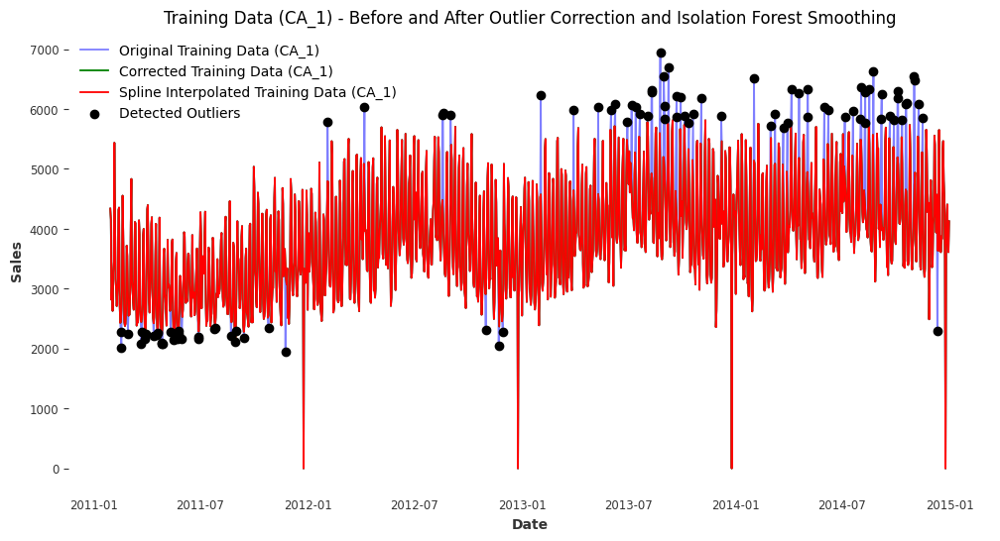

In [15]:
# Apply outlier detection and correction to the training data
outlier_indices_train = detect_outliers_isolation_forest(stores_train[store])
print(f"Number of outliers detected in training data: {len(outlier_indices_train)}")

stores_train_corrected = stores_train.copy()
stores_train_corrected[store] = replace_outliers_with_interpolation(stores_train[store], outlier_indices_train)


# Apply different interpolation methods to smooth the training data
stores_train_smoothed = stores_train_corrected.copy()
stores_train_smoothed[store] = stores_train_corrected[store].interpolate(method='akima')

# Plot the training data before and after outlier correction and Isolation Forest smoothing
plt.figure(figsize=(12, 6))
plt.plot(stores_train.index, stores_train[store], label="Original Training Data (CA_1)", color="blue", alpha=0.5)
plt.plot(stores_train_corrected.index, stores_train_corrected[store], label="Corrected Training Data (CA_1)", color="green")
plt.plot(stores_train_smoothed.index, stores_train_smoothed[store], label="Spline Interpolated Training Data (CA_1)", color="red")
plt.scatter(stores_train.loc[outlier_indices_train].index, stores_train.loc[outlier_indices_train, store], color='black', label='Detected Outliers', zorder=5)
plt.title("Training Data (CA_1) - Before and After Outlier Correction and Isolation Forest Smoothing")
plt.xlabel("Date")
plt.ylabel("Sales")
plt.legend()
plt.grid()
plt.show()

### Remove outliers on the Train data

In [16]:
# stores_train[store] = stores_train_smoothed[store] 

# Prophet

## Initial model

In [17]:
# stores_train.index = pd.to_datetime(stores_train.index) # Ensure the index is a DatetimeIndex
CA_1 = ts.TimeSeries.from_series(stores_train.iloc[:,0])

prophet_m = models.Prophet(seasonality_mode= 'multiplicative')
prophet_m.fit(CA_1) 
future_predict = prophet_m.model.make_future_dataframe(365)
df_prediction = prophet_m.model.predict(future_predict)

23:00:59 - cmdstanpy - INFO - Chain [1] start processing
23:00:59 - cmdstanpy - INFO - Chain [1] done processing


In [18]:
n_days_future = len(stores_test) - len(stores_train); print("Days to predict:",n_days_future) # Obtener el número de días adicionales en `test`
future_predict = prophet_m.model.make_future_dataframe(periods=n_days_future)
df_prediction = prophet_m.model.predict(future_predict)

predicted_values = df_prediction[-n_days_future:]["yhat"]  # Últimos n días futuros predichos
true_values = stores_test.iloc[-n_days_future:, 0]  # Valores reales de los días adicionales en el test


Days to predict: 365


### Plot the Predicted and Real Values

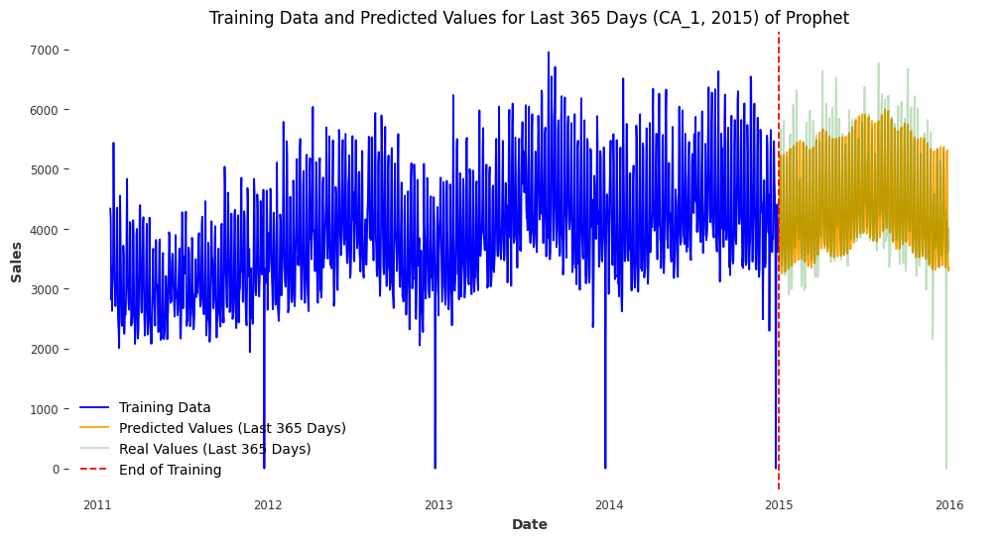

In [19]:
extra_dates = stores_test.index[-n_days_future:] 
end_of_training = stores_train.index[-1]
plot_predictions_1_year(stores_train, 'CA_1', extra_dates, true_values, predicted_values, end_of_training, 365, "Prophet")

Text(0.5, 0.98, 'Prophet Model Forecast  (CA_1, 2015)')

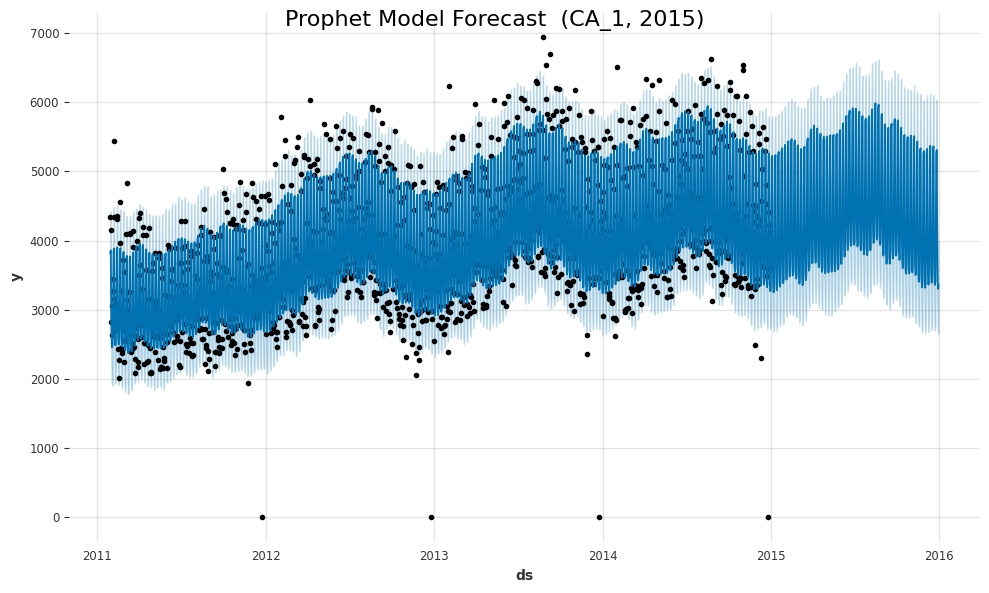

In [20]:
fig = prophet_m.model.plot(df_prediction)
fig.suptitle('Prophet Model Forecast  (CA_1, 2015)', fontsize=16)

### Zoom in on the Predicted Year: 2015

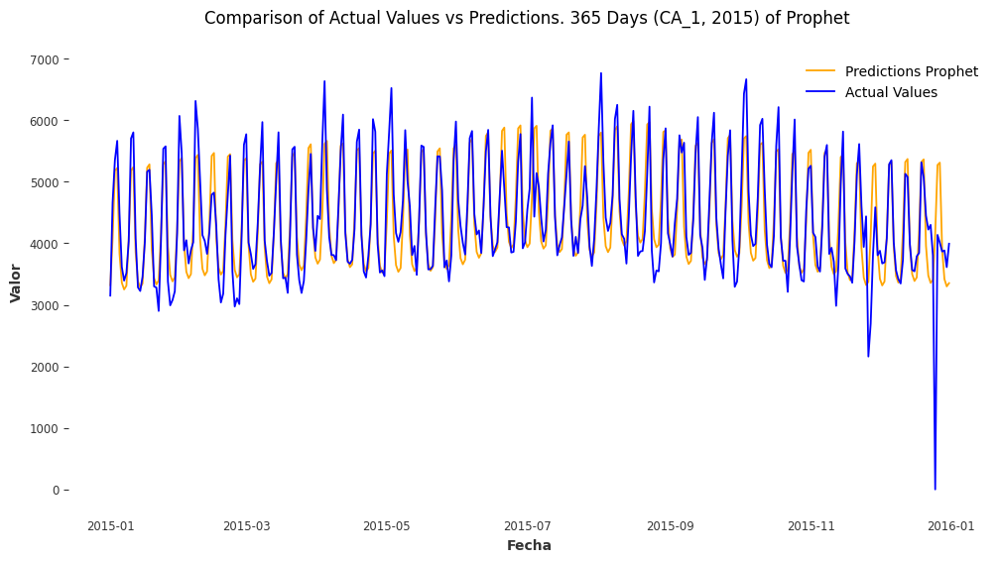

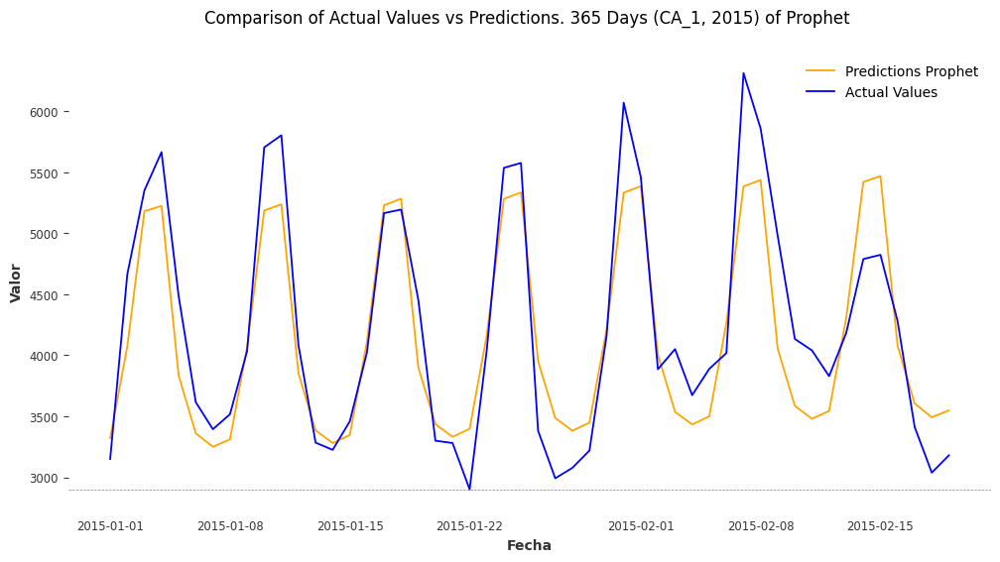

In [21]:
extra_dates = stores_test.index[-n_days_future:] 
end_of_training = stores_train.index[-1]
store = 'CA_1'
model_name = 'Prophet'
seasonal_periods = 365
days_to_plot = 50
plot_predictions_zoom(store, extra_dates, true_values, predicted_values, model_name, days_to_plot, seasonal_periods, one_plot=False, trend = '', seasonality = '')


### Showing the Error Comitted


In [22]:
mae_proph = mean_absolute_error(true_values, predicted_values)
rmse_proph = np.sqrt(mean_squared_error(true_values, predicted_values))
with warnings.catch_warnings():
    warnings.filterwarnings('ignore', category=RuntimeWarning)
    non_zero_mask = true_values.values != 0
    mape_proph = np.mean(np.abs((true_values.values[non_zero_mask] - predicted_values[non_zero_mask]) / true_values.values[non_zero_mask])) * 100
    
print(f"MAE: {mae_proph}")
print(f"RMSE: {rmse_proph}")
print(f"MAPE: {mape_proph} %")


MAE: 323.88428674906567
RMSE: 477.9125072853523
MAPE: 7.204149204013115 %


## Prophet With CV for hyperparameters

In [ ]:
import itertools
from darts import TimeSeries
from darts.models import Prophet
from darts.metrics import mae

# Crear la serie temporal desde los datos
CA_1 = TimeSeries.from_series(stores_train.iloc[:, 0])

# Grid de hiperparámetros
param_grid = {  
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.001, 0.01, 0.1, 1]
}

# Generar todas las combinaciones de parámetros
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]

best_model = None
best_mae = float('inf')
best_params = None

for params in all_params:
    model = Prophet(
        changepoint_prior_scale=params['changepoint_prior_scale'],
        seasonality_prior_scale=params['seasonality_prior_scale']
    )
    
    forecast = model.historical_forecasts(
        CA_1,
        start=0.7,              
        forecast_horizon=12,     
        retrain=True,            
        verbose=False
    )
    
    error = mae(CA_1.slice_intersect(forecast), forecast)
    
    if error < best_mae:
        best_mae = error
        best_model = model
        best_params = params

print("Mejores hiperparámetros encontrados:")
print(best_params)
print(f"Mejor MAE: {best_mae}")


Mejores hiperparámetros encontrados:
{'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 10.2}
Mejor MAE: 371.3477318485058

In [23]:
CA_1 = ts.TimeSeries.from_series(stores_train.iloc[:,0])


prophet_m = models.Prophet(seasonality_mode= 'multiplicative', holidays= holidays)
prophet_m.fit(CA_1) 
future_predict = prophet_m.model.make_future_dataframe(365)
df_prediction = prophet_m.model.predict(future_predict)

n_days_future = len(stores_test) - len(stores_train); print("Days to predict:",n_days_future) 
future_predict = prophet_m.model.make_future_dataframe(periods=n_days_future)
df_prediction = prophet_m.model.predict(future_predict)

predicted_values = df_prediction[-n_days_future:]["yhat"]  
true_values = stores_test.iloc[-n_days_future:, 0]  


23:01:01 - cmdstanpy - INFO - Chain [1] start processing
23:01:01 - cmdstanpy - INFO - Chain [1] done processing


Days to predict: 365


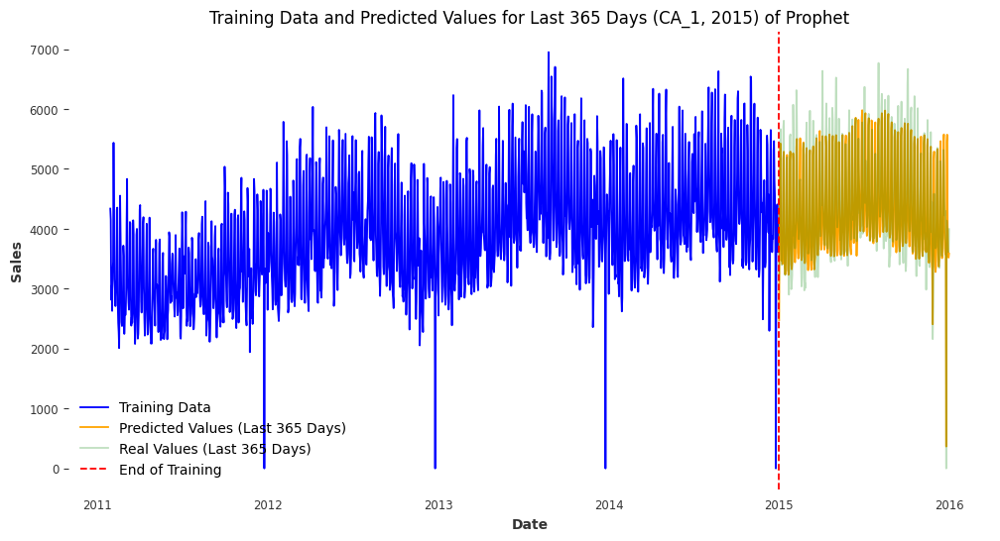

In [24]:
plot_predictions_1_year(stores_train, "CA_1", extra_dates, true_values, predicted_values, end_of_training, seasonal_periods, model_name)


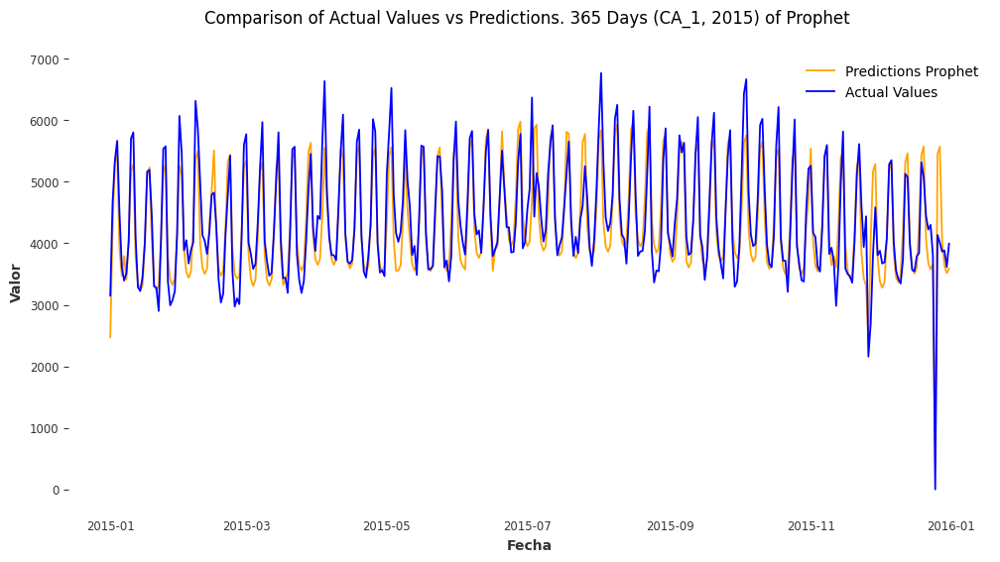

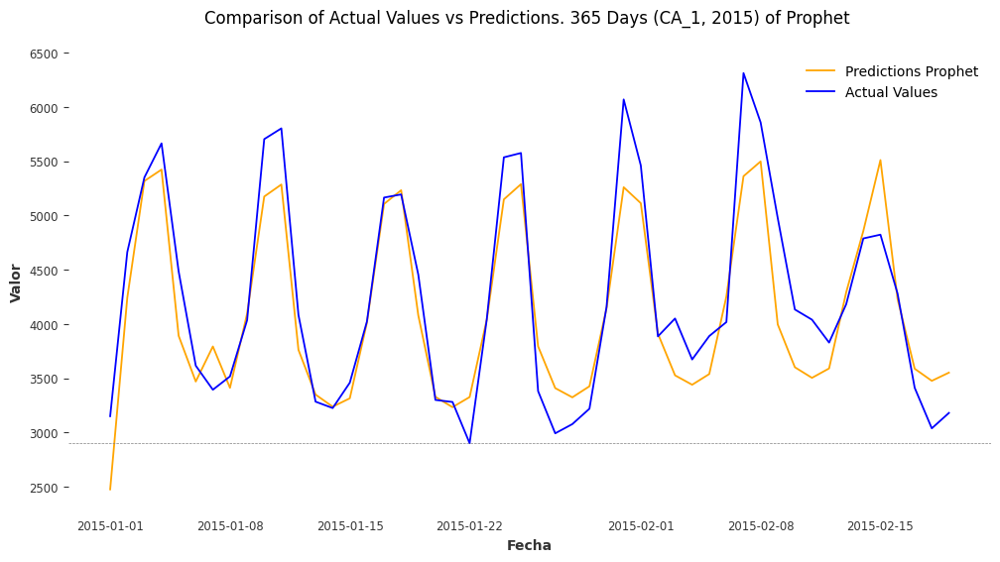

In [25]:
plot_predictions_zoom(store, extra_dates, true_values, predicted_values, model_name, days_to_plot, seasonal_periods, one_plot=False, trend = '', seasonality = '')

In [26]:
mae_proph = mean_absolute_error(true_values, predicted_values)
rmse_proph = np.sqrt(mean_squared_error(true_values, predicted_values))
with warnings.catch_warnings():
    warnings.filterwarnings('ignore', category=RuntimeWarning)
    non_zero_mask = true_values.values != 0
    mape_proph = np.mean(np.abs((true_values.values[non_zero_mask] - predicted_values[non_zero_mask]) / true_values.values[non_zero_mask])) * 100
    
print(f"MAE: {mae_proph}")
print(f"RMSE: {rmse_proph}")
print(f"MAPE: {mape_proph} %")


# Initialize an empty dictionary to store predictions from all models
predicted_values_dict = {}


# Store the predictions in the dictionary
predicted_values_dict['Prophet'] = predicted_values

MAE: 300.90739685517315
RMSE: 407.9821581391165
MAPE: 6.8482688100973315 %


# Exponential Smoothing

Exponential Smoothing (ES) models forecast by applying exponentially decreasing weights to past observations, emphasizing recent data points. It has variants (simple, double, and triple) for handling level, trend, and seasonal patterns. The model is fast and effective for smoothing out noise and capturing trends.

ES methods are especially effective for time series with clear trends and seasonality. The ETS model (Error, Trend, Seasonal) is commonly used in forecasting sales, where you can set different components based on the data characteristics:

- Simple Exponential Smoothing (SES): Best for data with no clear trend or seasonality.
- Holt’s Linear Trend Model: Useful if there is a trend in the data but no seasonality.
- Holt-Winters (Additive or Multiplicative): Works well for data with both trend and seasonality.

Days to predict: 365


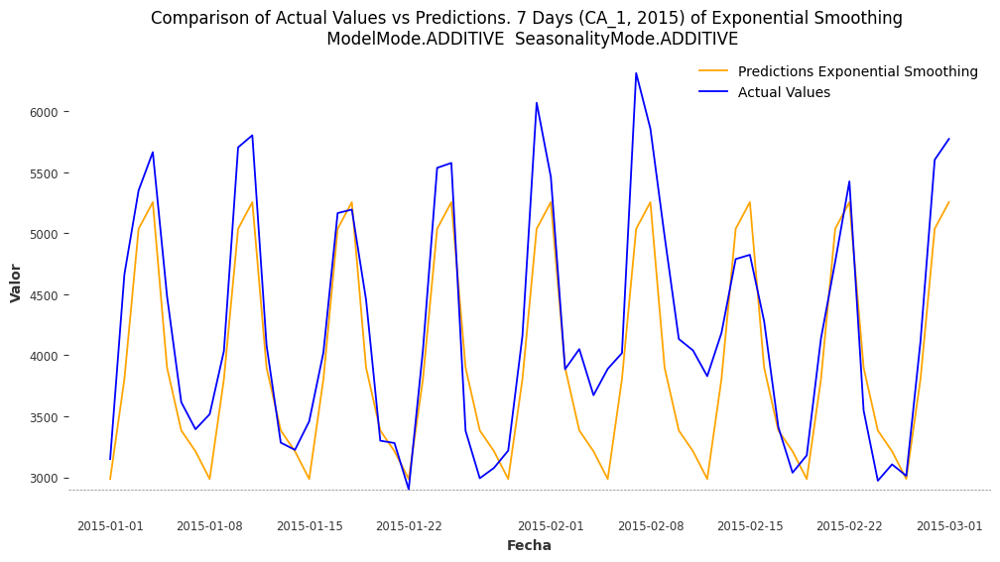

Days to predict: 365


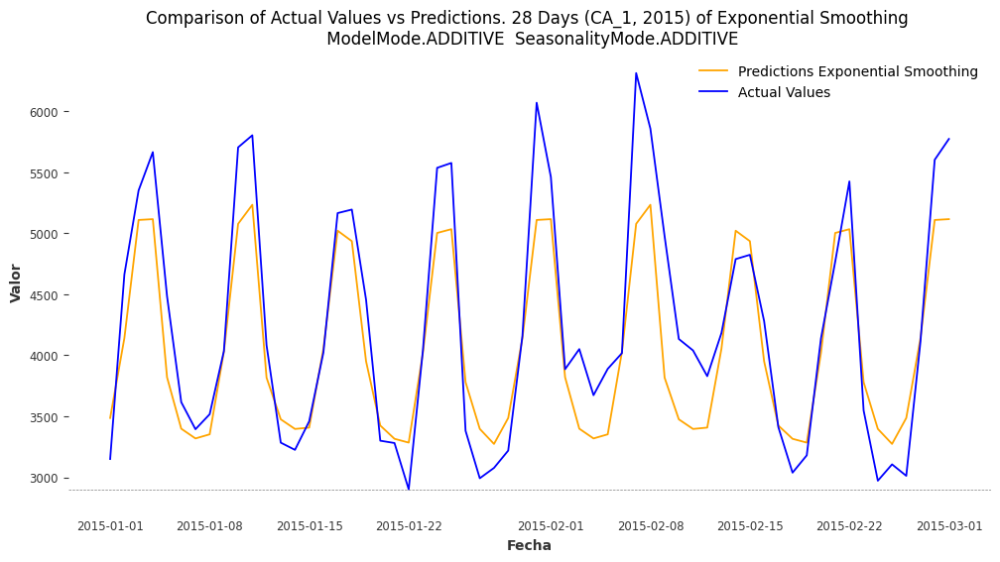

Days to predict: 365


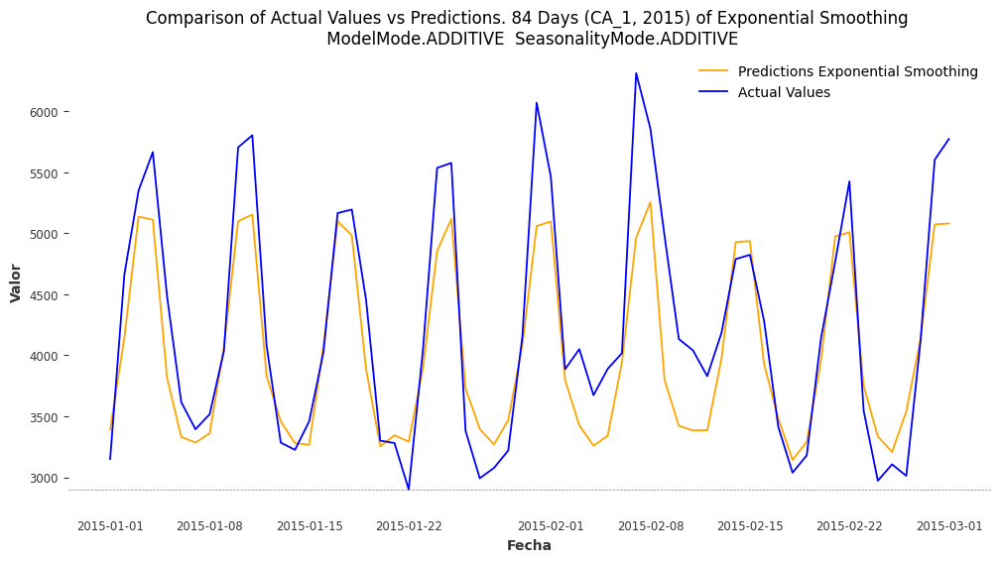

Days to predict: 365


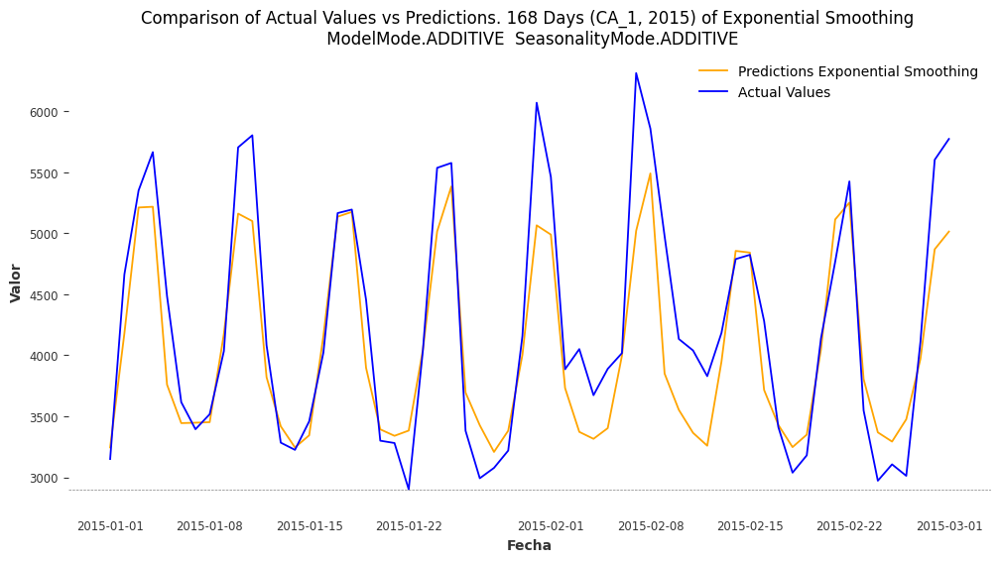

Days to predict: 365


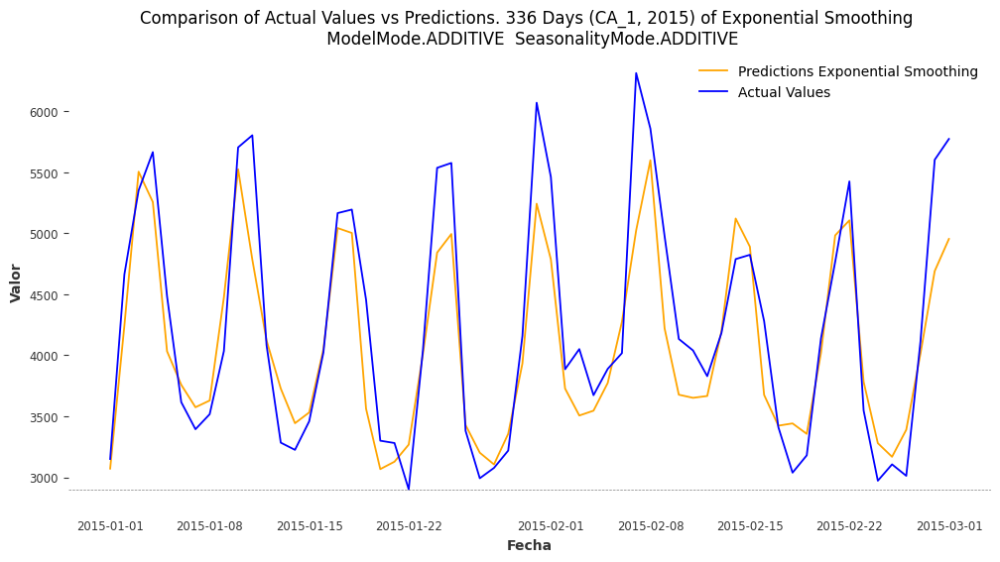

Days to predict: 365


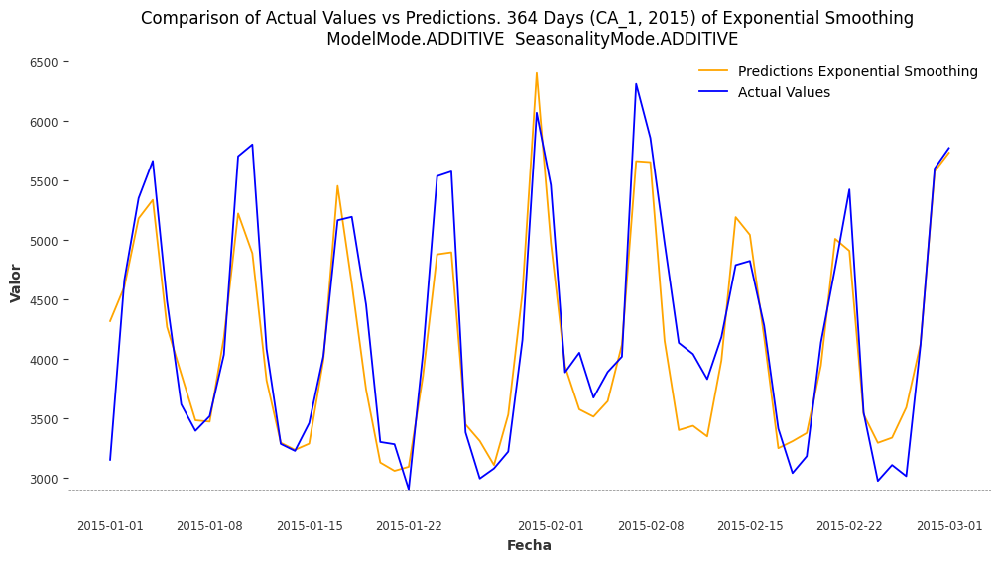

Days to predict: 365


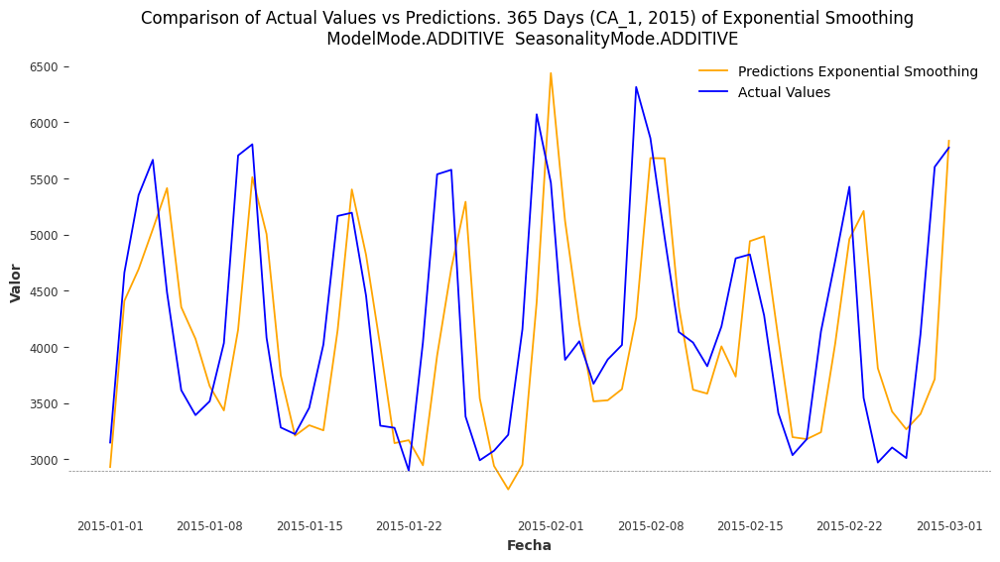

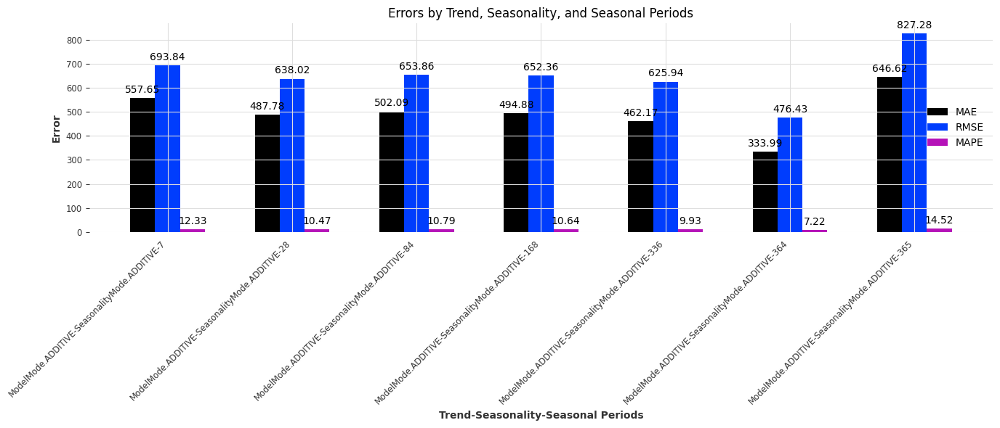

In [27]:
seasonal_periods_values = [7, 28, 84, 168, 336, 364, 365]
errors = []
trends = [ModelMode.ADDITIVE]
seasonalities = [SeasonalityMode.ADDITIVE]
store='CA_1'
# Iterate through all combinations of trends, seasonalities, and seasonal_periods_values
for trend in trends:
    for seasonality in seasonalities:
        for sp in seasonal_periods_values:
            # Perform cross-validation and predictions
            extra_dates, true_values, predicted_values, end_of_training = cross_validation_model(
                models.ExponentialSmoothing, stores_train, stores_test,
                trend, seasonality, sp, scaling=True, store=store
            )

            # Plot predictions
            plot_predictions_zoom(
                store, extra_dates, true_values, predicted_values,
                "Exponential Smoothing", 60, sp, one_plot=True, trend=trend, seasonality=seasonality
            )  # one_plot=False for multiple plots

            # Compute and store errors
            mae, rmse, mape = compute_errors(true_values, predicted_values)
            errors.append((trend, seasonality, sp, mae, rmse, mape))

# Plot errors
plot_errors(errors, trend_seasonality=True)

In [28]:
element = 5
mae_expsmooth, rmse_expsmooth, mape_expsmooth = errors[element][3], errors[element][4], errors[element][5]

print(f"MAE: {mae_expsmooth}")
print(f"RMSE: {rmse_expsmooth}")
print(f"MAPE: {mape_expsmooth} %")

# Store the predictions in the dictionary
predicted_values_dict['Exponential Smoothing'] = predicted_values

MAE: 333.99458554826396
RMSE: 476.42663498932313
MAPE: 7.216084430513189 %


Days to predict: 365


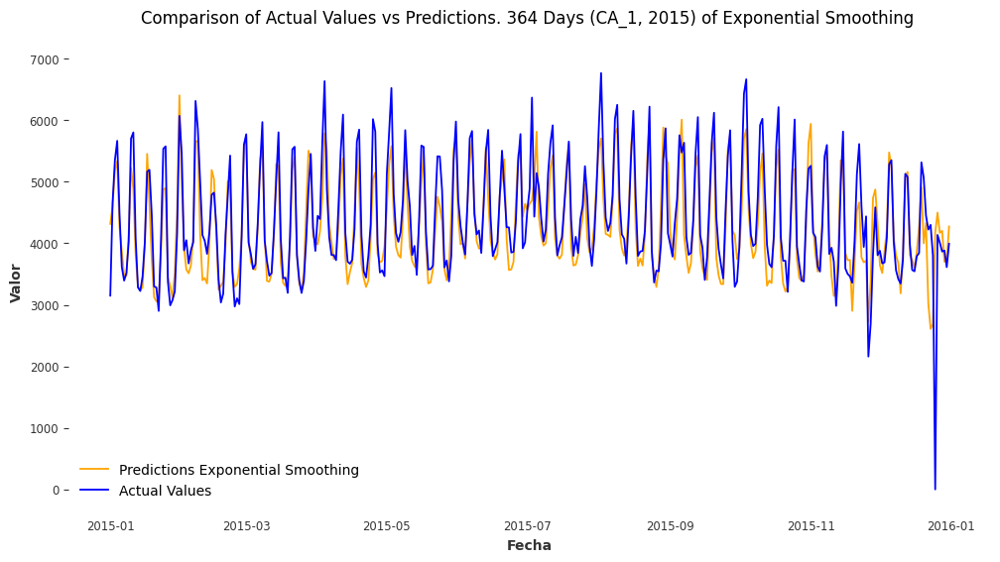

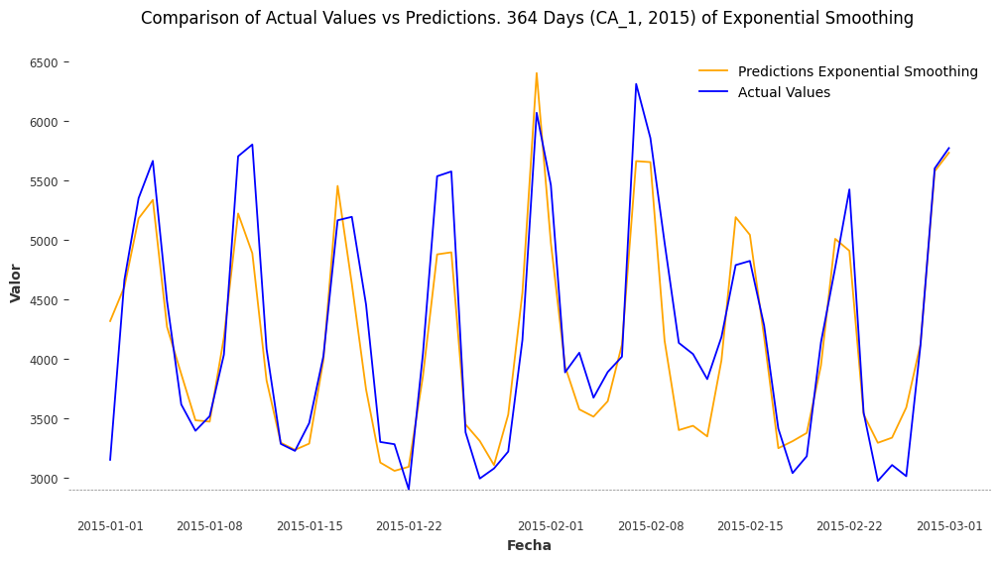

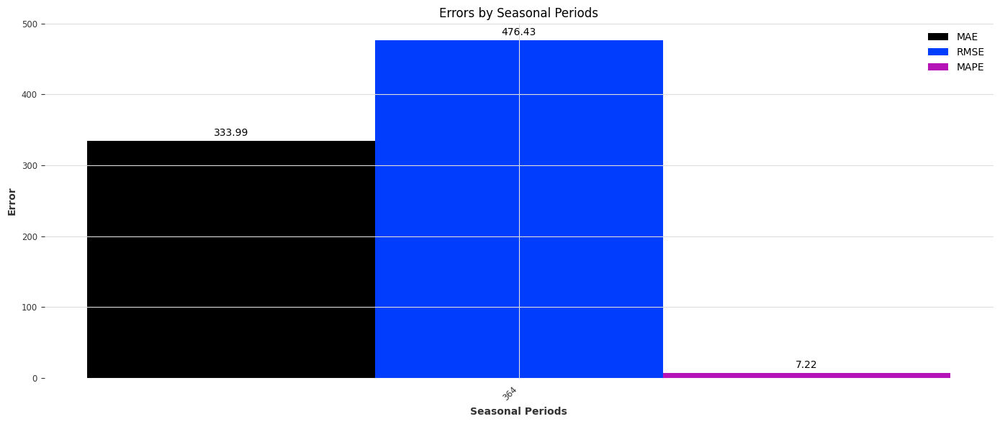

In [29]:
errors = []
sp = 364

extra_dates, true_values, predicted_values, end_of_training = cross_validation_model(models.ExponentialSmoothing,
                                                            stores_train, stores_test, 
                                                            ModelMode.ADDITIVE, SeasonalityMode.ADDITIVE, 
                                                            sp, scaling=True, store=store)

# plot_predictions_1_year(stores_train, 'CA_1', extra_dates, true_values, predicted_values, end_of_training, sp, "Exponential Smoothing")
plot_predictions_zoom(store, extra_dates, true_values, predicted_values, 
                      "Exponential Smoothing", 60, sp, one_plot=False) # one_plot=False para varios gráficos

mae_expsmooth, rmse_expsmooth, mape_expsmooth = compute_errors(true_values, predicted_values)
errors.append((sp,mae_expsmooth, rmse_expsmooth, mape_expsmooth))

plot_errors(errors)


Clearly the best Seasonal Period is 364 days, 1 year, so we are going to tune the model based on that. 

No Scaling:
- MAE: 348.8787357626157
- RMSE: 496.2498606843442
- MAPE: 7.608020866022757 %


Scaling: 
- MAE: 333.99458554826396
- RMSE: 476.42663498932313
- MAPE: 7.216084430513189 %

# SARIMA

The SARIMA (Seasonal AutoRegressive Integrated Moving Average) model is an extension of the ARIMA model that is specifically designed to handle both seasonal and non-seasonal patterns in time series data.

AutoARIMA automatically selects the best ARIMA model by searching across combinations of parameters (p, d, q) and, for seasonal data, (P, D, Q, m) based on performance metrics like AIC. It iteratively fits models and picks the one with the lowest error. This allows it to handle both trend and seasonality in a series without manual tuning.

#### 1. Parameter Tuning and Complexity in AutoARIMA

- This involves evaluating multiple model combinations and selecting the best fit based on criteria like AIC (Akaike Information Criterion).

- The process can be computationally intensive, especially for large datasets, as it’s testing many combinations.

#### 2. Seasonality and Long Time Series
- Since data includes seasonal components, AutoARIMA needs to consider an additional set of parameters (P, D, Q, and m), which increases the search space.
- With m=365 for yearly seasonality on daily data, the time series is also quite long, which further adds to the processing time as AutoARIMA optimizes seasonal cycles over a full year of data. 

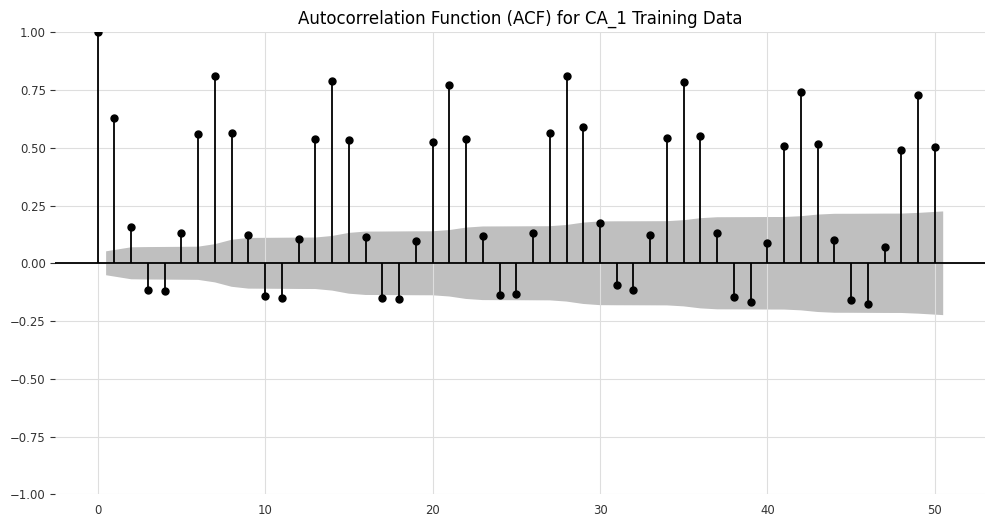

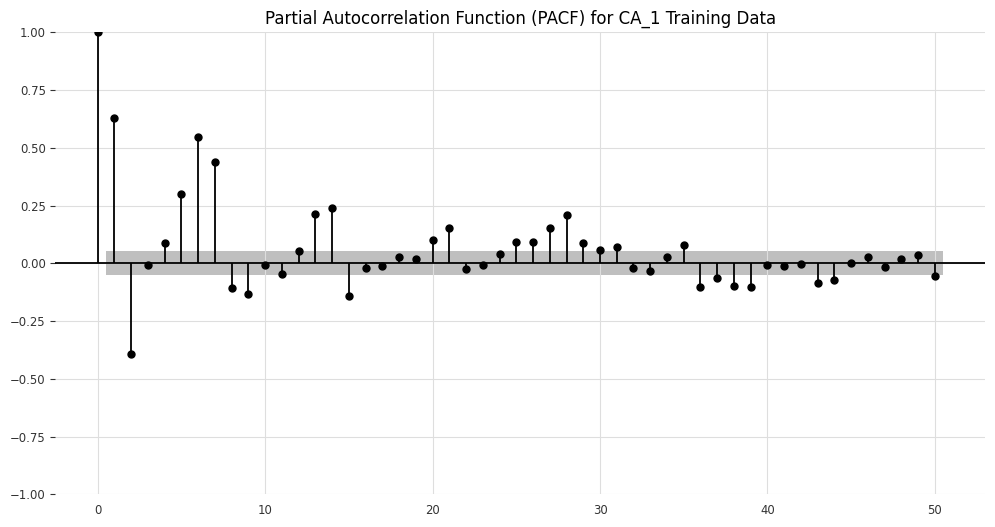

In [30]:
# Assuming the dataset contains multiple store columns, select a specific store (e.g., 'CA_1')
scaler = StandardScaler()
stores_train_scaled = scaler.fit_transform(stores_train[['CA_1']])
stores_test_scaled = scaler.transform(stores_test[['CA_1']])

CA_1_train = pd.Series(stores_train_scaled.flatten(), index=stores_train.index)  # Training dataset

# Plot ACF and PACF for the training data
plt.figure(figsize=(12, 6))
plot_acf(CA_1_train, lags=50, ax=plt.gca())
plt.title('Autocorrelation Function (ACF) for CA_1 Training Data')
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 6))
plot_pacf(CA_1_train, lags=50, ax=plt.gca())
plt.title('Partial Autocorrelation Function (PACF) for CA_1 Training Data')
plt.grid(True)
plt.show()

In [31]:
# Assuming the dataset contains multiple store columns, select a specific store (e.g., 'CA_1')
scaler = StandardScaler()
stores_train_scaled = scaler.fit_transform(stores_train[['CA_1']])
stores_test_scaled = scaler.transform(stores_test[['CA_1']])

CA_1_train = TimeSeries.from_series(pd.Series(stores_train_scaled.flatten(), index=stores_train.index))  # Training dataset

# Initialize and train the ARIMA model
arima_m = models.ARIMA(p=5, d=1, q=5, seasonal_order=(0, 0, 0, 7), trend=None, random_state=None, add_encoders=None)  # You can adjust these orders to experiment
arima_m.fit(CA_1_train)

# Calculate the number of additional days in the test set
n_days_future = len(stores_test) - len(stores_train)

# Make predictions for the future period
predicted_values = arima_m.predict(n_days_future)

# Inverse transform predictions and actual values for error calculation
predicted_values = scaler.inverse_transform(predicted_values.values().reshape(-1, 1)).flatten()

true_values = stores_test.iloc[-n_days_future:,0]
extra_dates = stores_test.index[-n_days_future:]
end_of_training = stores_train.index[-1]; print(end_of_training)

2014-12-31 00:00:00


C:\Users\Alejo-Lenovo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


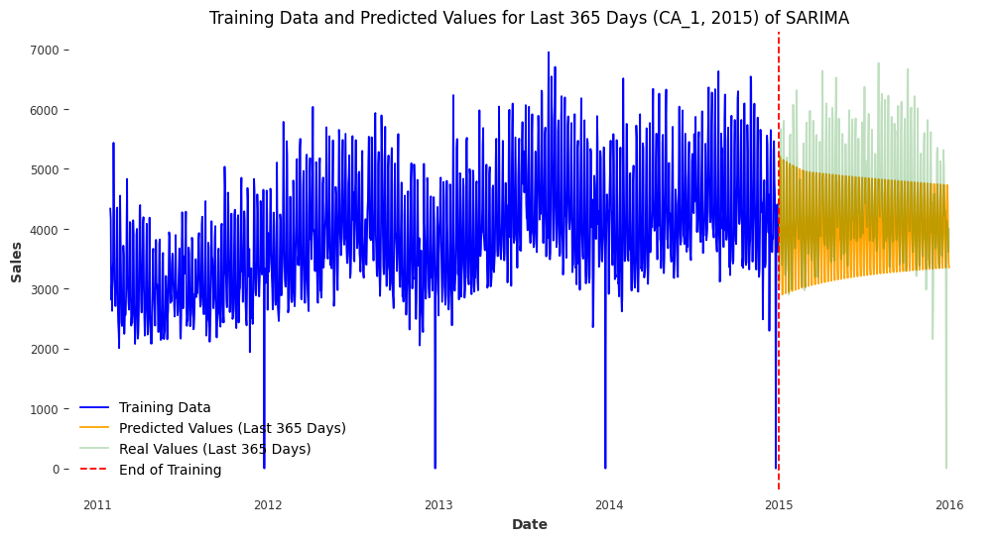

In [32]:
model_name = "SARIMA"
seasonal_periods = 365
store = 'CA_1'
plot_predictions_1_year(stores_train, store, extra_dates, true_values, 
                            predicted_values, end_of_training, seasonal_periods, model_name)


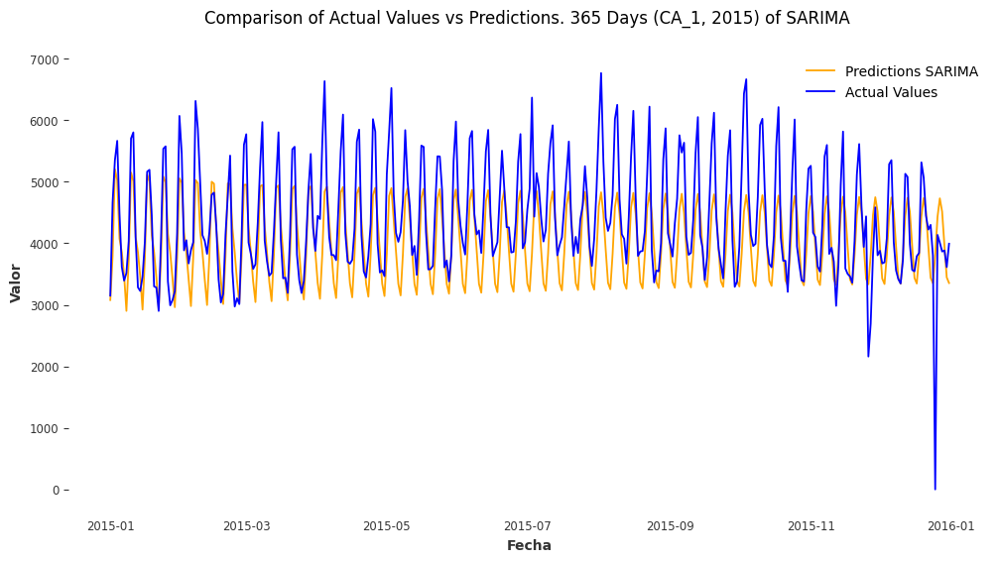

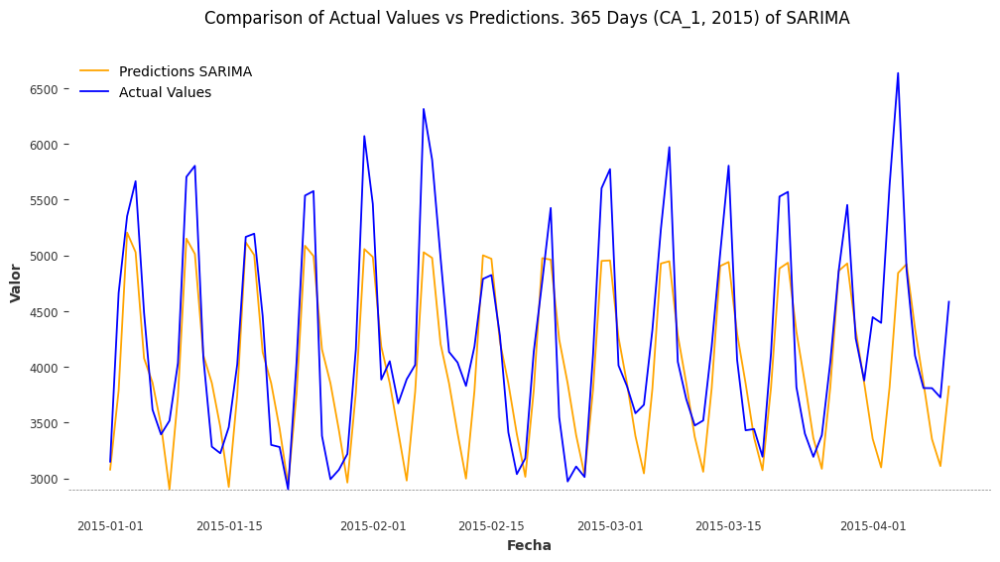

In [33]:
days_to_plot = 100
plot_predictions_zoom(store, extra_dates, true_values, predicted_values, model_name,
                       days_to_plot, seasonal_periods, one_plot=False)


In [34]:
# Calculate error metrics on the inverse-transformed values
mae_sarima, rmse_sarima, mape_sarima = compute_errors(true_values, predicted_values)

print(f"MAE: {mae_sarima}")
print(f"RMSE: {rmse_sarima}")
print(f"MAPE: {mape_sarima} %")

predicted_values_dict['Sarima'] = predicted_values

MAE: 550.5024345085926
RMSE: 706.6511876843424
MAPE: 11.731843172469917 %


# Kalman

In [35]:
# Assuming the dataset contains multiple store columns, select a specific store (e.g., 'CA_1')
scaler = StandardScaler()
stores_train_scaled = scaler.fit_transform(stores_train[['CA_1']])
stores_test_scaled = scaler.transform(stores_test[['CA_1']])

CA_1_train = TimeSeries.from_series(pd.Series(stores_train_scaled.flatten(), index=stores_train.index))  # Training dataset

# Initialize and train the Kalman Forecaster model
kalman_m = models.KalmanForecaster(dim_x=299)  # Kalman Forecaster with 2 state dimensions
kalman_m.fit(CA_1_train)

# Calculate the number of additional days in the test set
n_days_future = len(stores_test) - len(stores_train)

# Make predictions for the future period
predicted_values = kalman_m.predict(n_days_future)

# Inverse transform predictions and actual values for error calculation
predicted_values = scaler.inverse_transform(predicted_values.values().reshape(-1, 1)).flatten()

true_values = stores_test.iloc[-n_days_future:,0]
extra_dates = stores_test.index[-n_days_future:]
end_of_training = stores_train.index[-1]; print(end_of_training)

2014-12-31 00:00:00


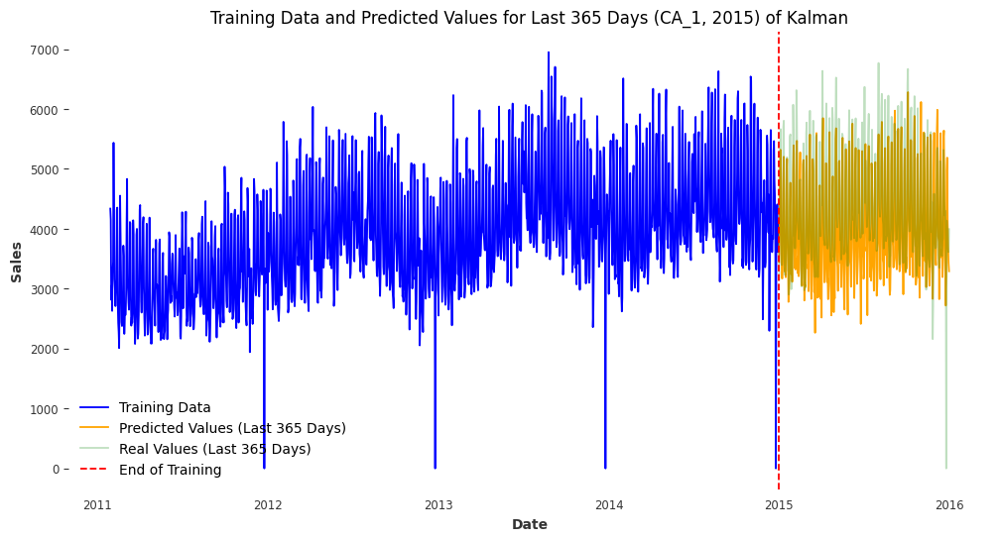

In [36]:
model_name = "Kalman"
seasonal_periods = 365
store = 'CA_1'
plot_predictions_1_year(stores_train, store, extra_dates, true_values, 
                            predicted_values, end_of_training, seasonal_periods, model_name)


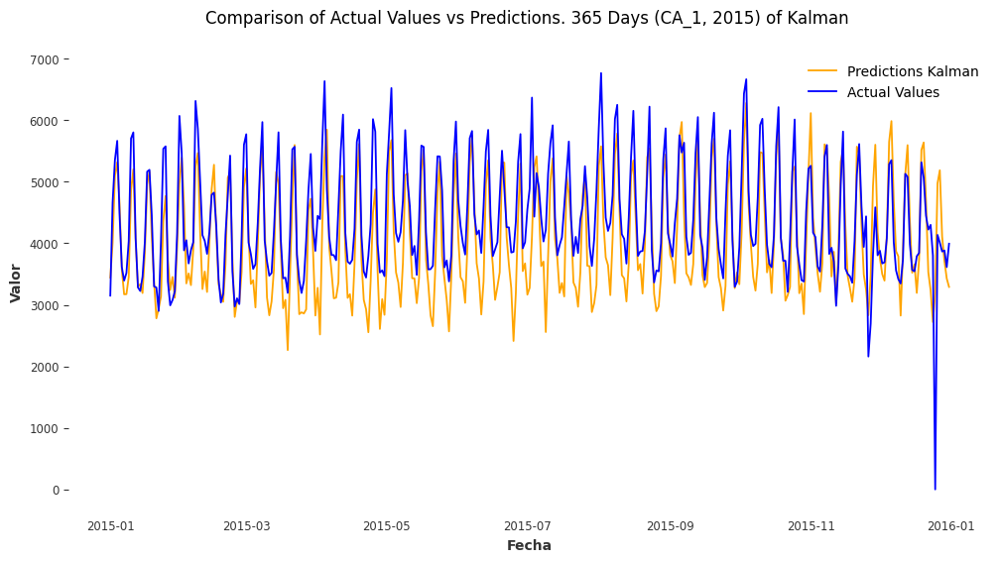

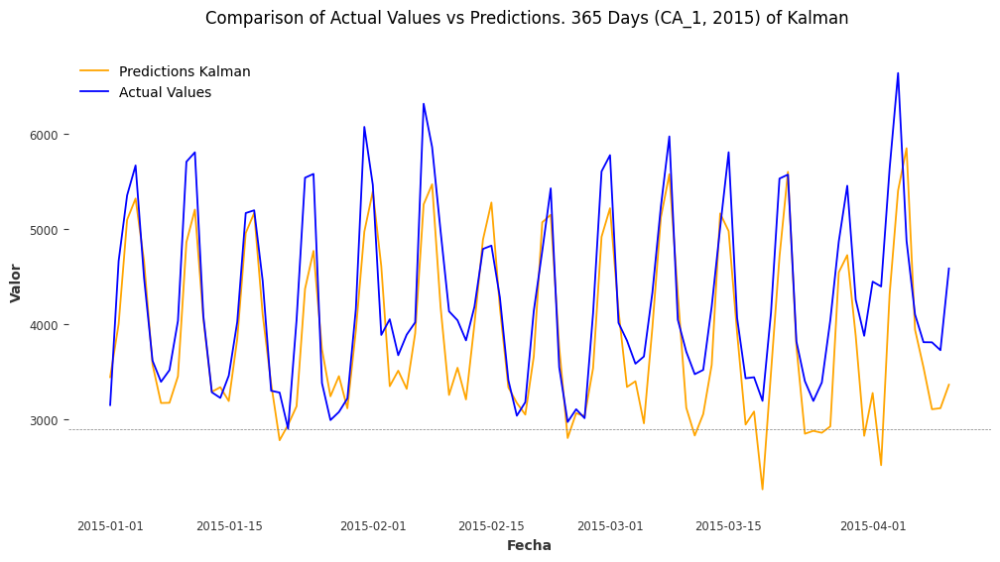

In [37]:
days_to_plot = 100
plot_predictions_zoom(store, extra_dates, true_values, predicted_values, model_name,
                       days_to_plot, seasonal_periods, one_plot=False)


In [38]:
mae_kalman, rmse_kalman, mape_kalman = compute_errors(true_values, predicted_values)

print(f"MAE: {mae_kalman}")
print(f"RMSE: {rmse_kalman}")
print(f"MAPE: {mape_kalman}%")

predicted_values_dict['Kalman'] = predicted_values

MAE: 529.2371448810622
RMSE: 660.6848774506659
MAPE: 11.913529894478964%


# XGBoost

In [39]:
# Scale the data
scaler = StandardScaler()
stores_train_scaled = scaler.fit_transform(stores_train[['CA_1']])
stores_test_scaled = scaler.transform(stores_test[['CA_1']])

# Prepare training data for XGBoost
CA_1_train = pd.Series(stores_train_scaled.flatten(), index=stores_train.index)  # Training dataset
CA_1_test = pd.Series(stores_test_scaled.flatten(), index=stores_test.index)  # Test dataset

# Convert time series data into supervised learning format (lag-based)
def create_lagged_features(series, lags=10):
    X, y = [], []
    for i in range(len(series) - lags):
        X.append(series[i:i+lags].values)
        y.append(series[i+lags])
    return np.array(X), np.array(y)

# Prepare the lagged features for training
lags = 10  # You can experiment with the number of lags
X_train, y_train = create_lagged_features(CA_1_train, lags)
X_test, y_test = create_lagged_features(CA_1_test, lags)

param_grid = {
    'n_estimators': [1500, 1750, 2000],  # Number of trees
    'learning_rate': [ 0.01],  # Step size for optimization
    'max_depth': [ 3 ],  # Depth of the trees
    'min_child_weight': [3,5],  # Minimum number of observations required in a child node
    'subsample': [0.8],  # Fraction of samples used for training
    'colsample_bytree': [ 0.8],  # Fraction of features used for each tree
    'gamma': [0.05, 0.1],  # Minimum loss reduction required to make a further partition
    'tree_method': ['hist'],  # Use CPU for training
    'reg_alpha': [0, 1,5, 10],
    'reg_lambda': [1,5, 10]
}


# Create the XGBoost model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror')

# Set up GridSearchCV to search through the hyperparameters
# grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5, 
#                            verbose=2, n_jobs=-1, scoring='neg_mean_squared_error')


# Define TimeSeriesSplit with a specific number of splits
tscv = TimeSeriesSplit(n_splits=5)

# Set up GridSearchCV with TimeSeriesSplit
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=tscv, 
                           verbose=2, n_jobs=-1, scoring='neg_mean_squared_error')


# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Best Parameters found: ", best_params)
print("Best Score found: ", best_score)

# Use the best model to make predictions
best_xgb_model = grid_search.best_estimator_
predicted_values = best_xgb_model.predict(X_test)

# Inverse transform predictions and actual values for error calculation
predicted_values_inv = scaler.inverse_transform(predicted_values.reshape(-1, 1)).flatten()
CA_1_test_inv = scaler.inverse_transform(CA_1_test[-len(predicted_values):].values.reshape(-1, 1)).flatten()

# Calculate error metrics
mae_xgb = mean_absolute_error(CA_1_test_inv, predicted_values_inv)
rmse_xgb = np.sqrt(mean_squared_error(CA_1_test_inv, predicted_values_inv))

# Avoid division by zero for MAPE calculation
with warnings.catch_warnings():
    warnings.filterwarnings('ignore', category=RuntimeWarning)
    non_zero_mask = CA_1_test_inv != 0
    mape_xgb = np.mean(np.abs((CA_1_test_inv[non_zero_mask] - predicted_values_inv[non_zero_mask]) / CA_1_test_inv[non_zero_mask])) * 100

print(f"MAE: {mae_xgb}")
print(f"RMSE: {rmse_xgb}")
print(f"MAPE: {mape_xgb}%")

predicted_values_dict['XGBoost'] = predicted_values_inv

Fitting 5 folds for each of 144 candidates, totalling 720 fits


C:\Users\Alejo-Lenovo\AppData\Local\Temp\ipykernel_20936\258241402.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(series[i+lags])


Best Parameters found:  {'colsample_bytree': 0.8, 'gamma': 0.05, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 1500, 'reg_alpha': 0, 'reg_lambda': 1, 'subsample': 0.8, 'tree_method': 'hist'}
Best Score found:  -0.29698230533849057
MAE: 250.08014639698686
RMSE: 355.77092436528955
MAPE: 6.197889315799534%


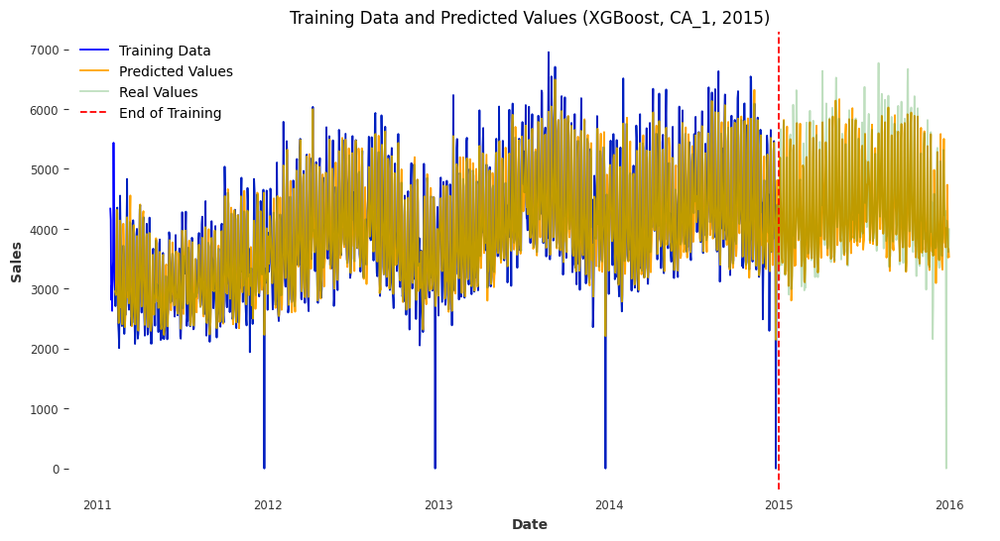

In [40]:
# Plot the results for all years (Training + Test)
CA_1_train_inv = scaler.inverse_transform(CA_1_train.values.reshape(-1, 1)).flatten()
extra_dates = stores_test.index[-len(predicted_values):]
end_of_training = stores_train.index[-1]
plt.figure(figsize=(12, 6))

# Plot the training data
plt.plot(stores_train.index, CA_1_train_inv, label="Training Data", color="blue")

# Plot the predicted values
plt.plot(extra_dates, predicted_values_inv, label="Predicted Values", color="orange")

# Plot the real values of the test
plt.plot(extra_dates, CA_1_test_inv, label="Real Values", color="green", alpha=0.25)
plt.axvline(x=end_of_training, color='red', linestyle='--', label='End of Training')

plt.title("Training Data and Predicted Values (XGBoost, CA_1, 2015)")
plt.xlabel("Date")
plt.ylabel("Sales")
plt.legend()
plt.grid()
plt.show()

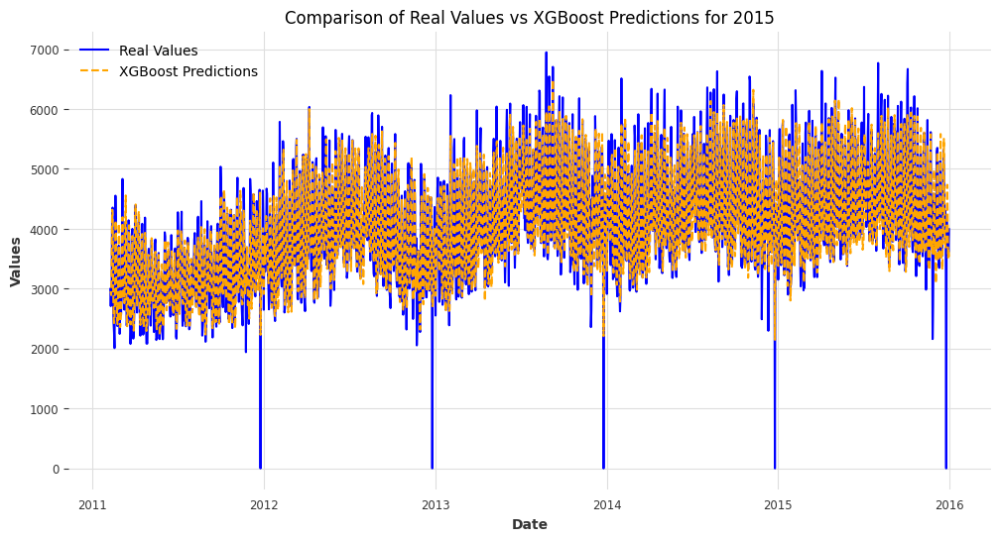

In [41]:
# Plot the results for 2015 values only
plt.figure(figsize=(12, 6))
plt.plot(stores_test.index[-len(predicted_values):], CA_1_test_inv, label='Real Values', color='blue', linestyle='-', linewidth=1.5)
plt.plot(stores_test.index[-len(predicted_values):], predicted_values_inv, label='XGBoost Predictions', color='orange', linestyle='--', linewidth=1.5)
plt.legend()
plt.title('Comparison of Real Values vs XGBoost Predictions for 2015')
plt.xlabel('Date')
plt.ylabel('Values')
plt.grid(True)
plt.show()

In [42]:
# Calculate error metrics on the inverse-transformed values
mae_xgb = mean_absolute_error(CA_1_test_inv, predicted_values_inv)
rmse_xgb = np.sqrt(mean_squared_error(CA_1_test_inv, predicted_values_inv))

# Avoid division by zero for MAPE calculation
with warnings.catch_warnings():
    warnings.filterwarnings('ignore', category=RuntimeWarning)
    non_zero_mask = CA_1_test_inv != 0
    mape_xgb = np.mean(np.abs((CA_1_test_inv[non_zero_mask] - predicted_values_inv[non_zero_mask]) / CA_1_test_inv[non_zero_mask])) * 100

print(f"MAE: {mae_xgb}")
print(f"RMSE: {rmse_xgb}")
print(f"MAPE: {mape_xgb}%")


predicted_values_dict['XGBoost'] = predicted_values_inv

MAE: 250.08014639698686
RMSE: 355.77092436528955
MAPE: 6.197889315799534%


XGBoost: 

- MAE: 113.87290282259504
- RMSE: 154.30675541617123
- MAPE: 3.0182882538736835%

# XGBoost with Darts

Testing with lags_model=365, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


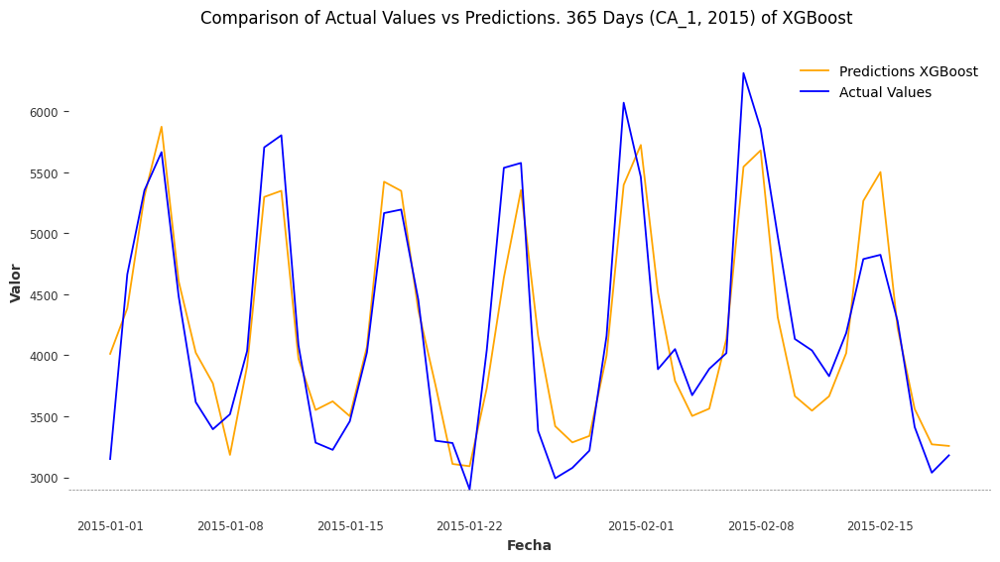

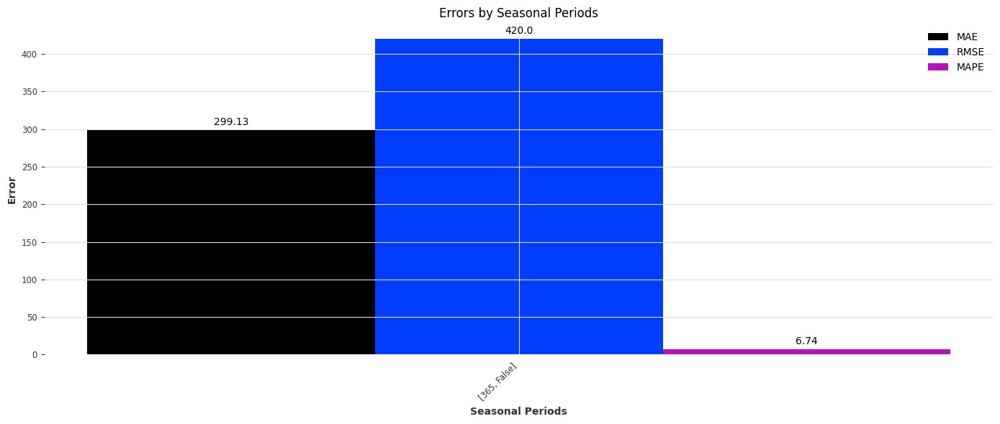

In [43]:
# Define the different values for lagged_features, lags_model, and scaling
lags_model_values = [365]
scaling_values = [False]

# Initialize an empty list to store the results
errors = []

# Loop through all combinations of lags_model, and scaling
for lags_model in lags_model_values:
    for scaling in scaling_values:
        print(f"Testing with lags_model={lags_model}, scaling={scaling}")

        # Run the cross-validation function for each combination of parameters
        extra_dates, true_values, predicted_values, end_of_training = cross_validation_XGBoost(
            stores_train, stores_test, lags_model, scaling=scaling
        )


        # Store the results and plot the predictions
        store = 'CA_1'
        days_to_plot = 50
        plot_predictions_zoom(
            store, extra_dates, true_values, predicted_values,
            "XGBoost", days_to_plot, lags_model, one_plot=True
        )

        # Compute the errors for the current combination of parameters
        mae_lgbm, rmse_lgbm, mape_lgbm = compute_errors(true_values, predicted_values)
        errors.append(([lags_model, scaling], mae_lgbm, rmse_lgbm, mape_lgbm))
        
        predicted_values_dict['XGBoost'] = predicted_values_inv
# Plot all the errors
plot_errors(errors)


In [44]:
element = 0
mae_xgb, rmse_xgb, mape_xgb  = errors[element][1], errors[element][2], errors[element][3]

print(f"MAE: {mae_xgb}")
print(f"RMSE: {rmse_xgb}")
print(f"MAPE: {mape_xgb} %")

MAE: 299.1251605308219
RMSE: 420.0005051497648
MAPE: 6.7428811795190295 %


With 364 lags and Scaling:
- MAE: 306.3396163313356
- RMSE: 403.31546378195725
- MAPE: 7.027686035983047 %

# LightGMB

`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000163 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1799
[LightGBM] [Info] Number of data points in the train set: 1426, number of used features: 14
[LightGBM] [Info] Start training from score 0.002540
Days to predict: 365


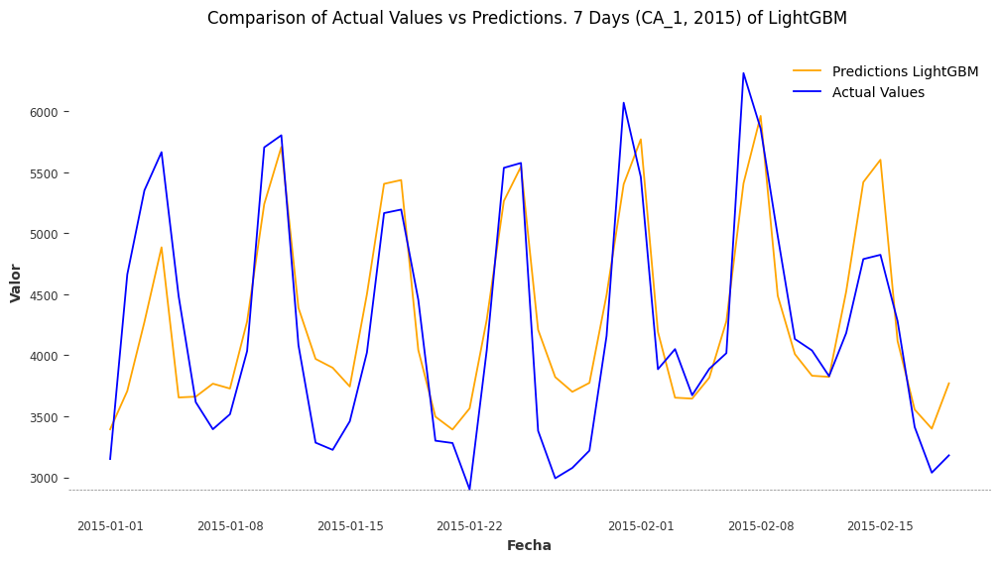

`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1799
[LightGBM] [Info] Number of data points in the train set: 1426, number of used features: 14
[LightGBM] [Info] Start training from score 3899.004909
Days to predict: 365


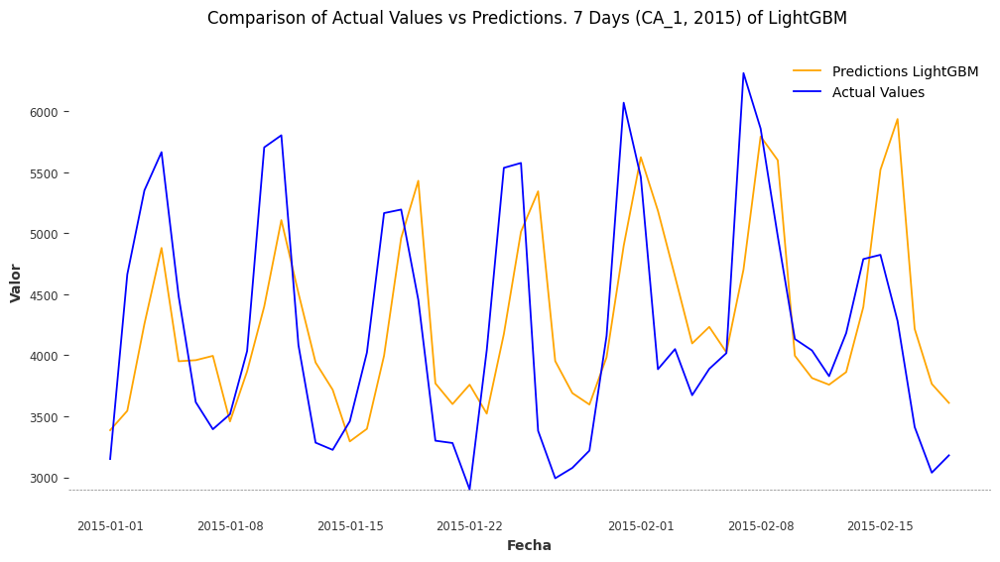

`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7196
[LightGBM] [Info] Number of data points in the train set: 1405, number of used features: 56
[LightGBM] [Info] Start training from score 0.012939
Days to predict: 365


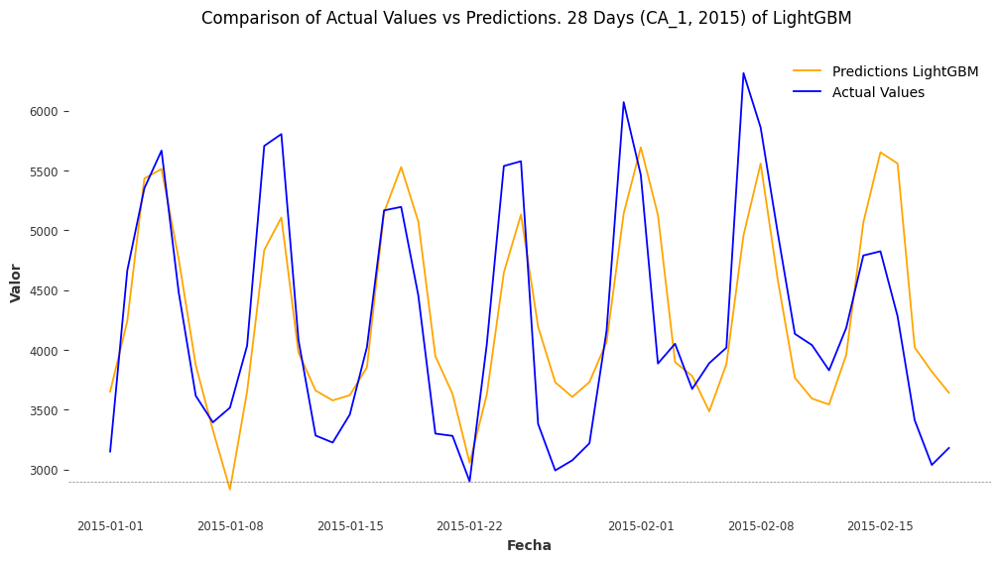

`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000600 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7196
[LightGBM] [Info] Number of data points in the train set: 1405, number of used features: 56
[LightGBM] [Info] Start training from score 3909.229181
Days to predict: 365


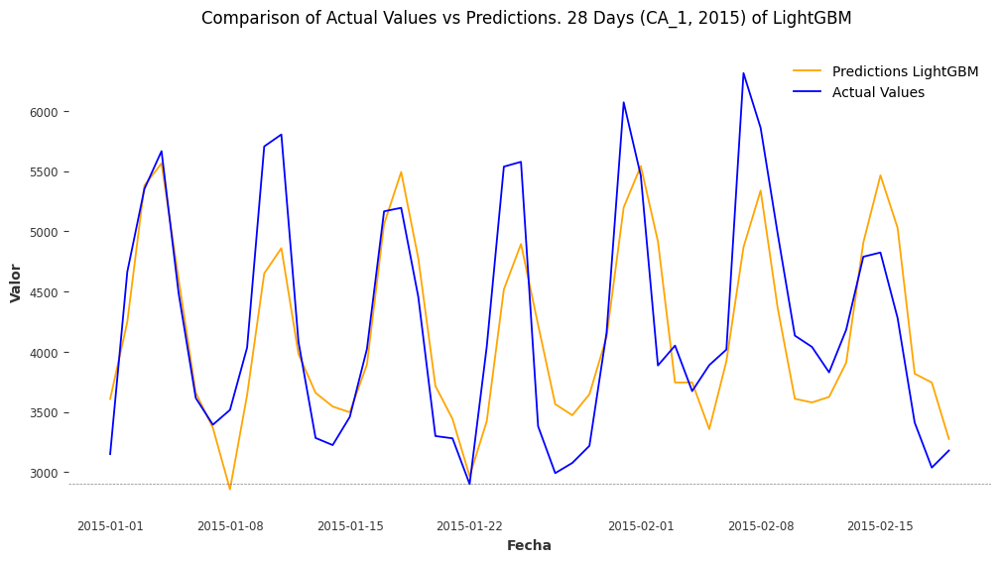

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21588
[LightGBM] [Info] Number of data points in the train set: 1349, number of used features: 168
[LightGBM] [Info] Start training from score 0.047966


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


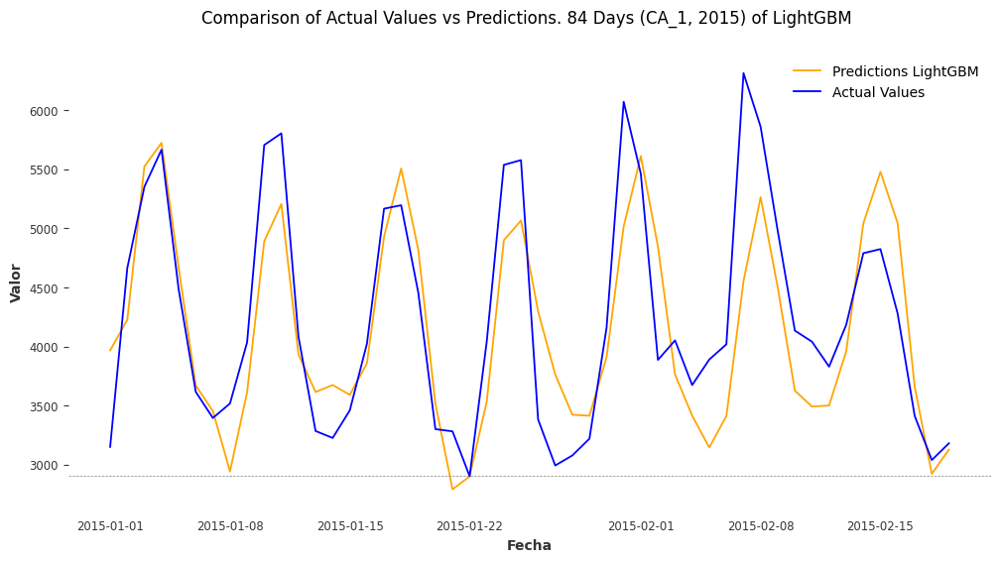

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21588
[LightGBM] [Info] Number of data points in the train set: 1349, number of used features: 168
[LightGBM] [Info] Start training from score 3943.667161


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


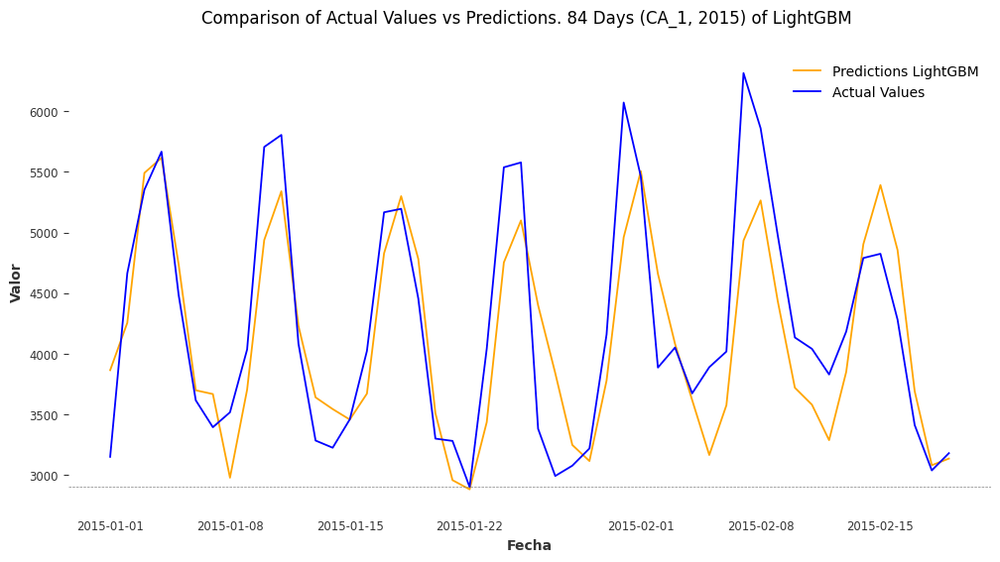

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43176
[LightGBM] [Info] Number of data points in the train set: 1265, number of used features: 336
[LightGBM] [Info] Start training from score 0.113672


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


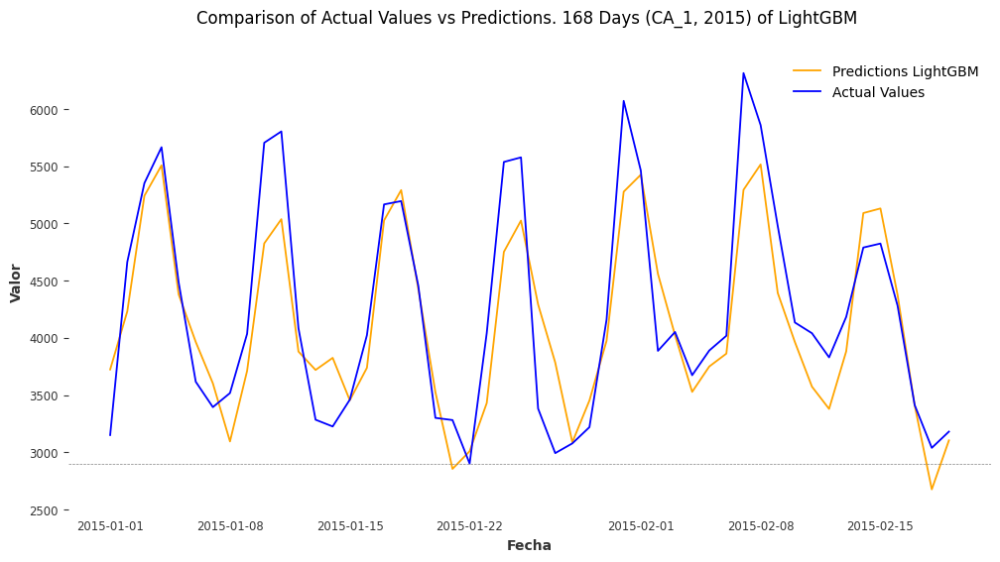

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43176
[LightGBM] [Info] Number of data points in the train set: 1265, number of used features: 336
[LightGBM] [Info] Start training from score 4008.267194


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


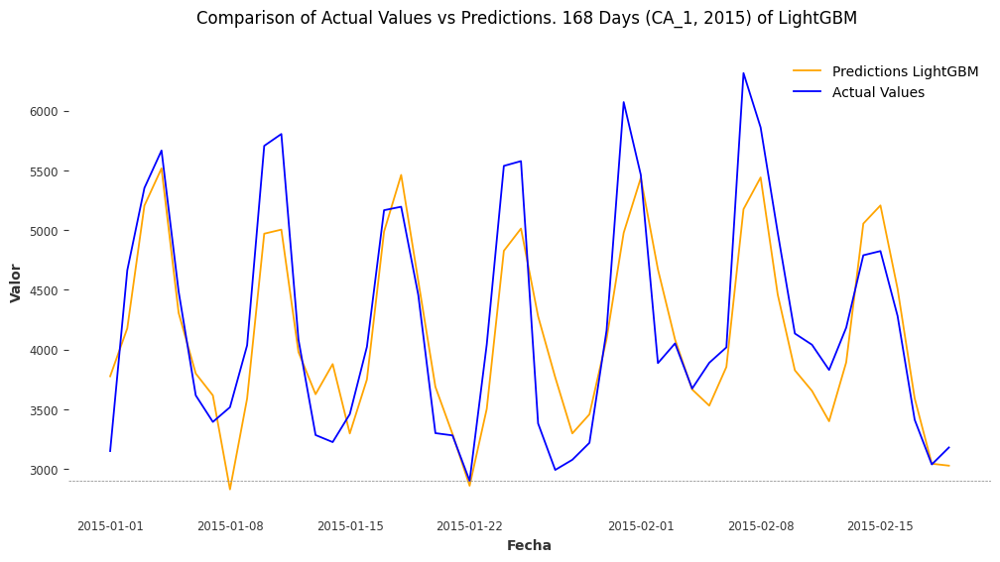

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 86352
[LightGBM] [Info] Number of data points in the train set: 1097, number of used features: 672
[LightGBM] [Info] Start training from score 0.234270


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


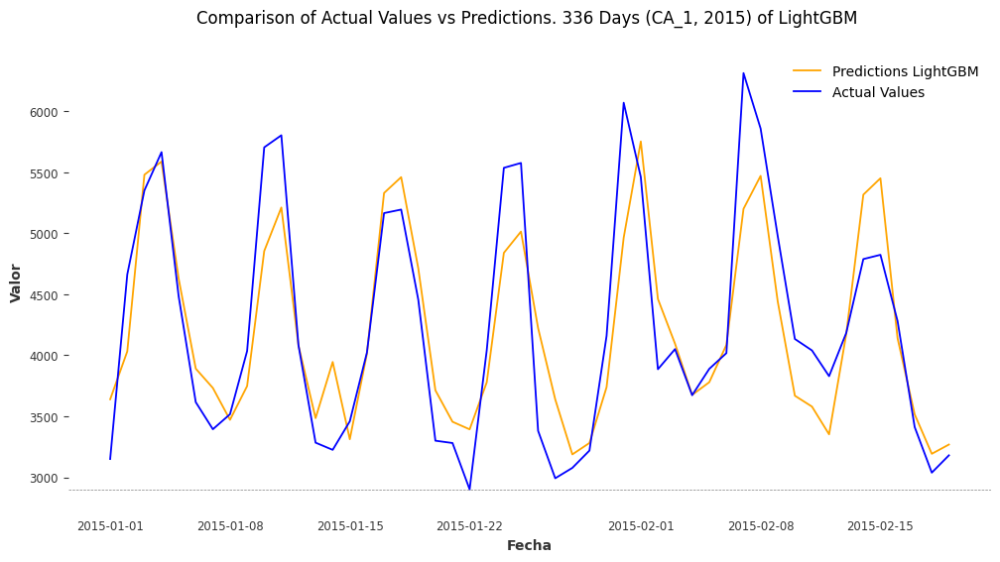

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 86352
[LightGBM] [Info] Number of data points in the train set: 1097, number of used features: 672
[LightGBM] [Info] Start training from score 4126.835916


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


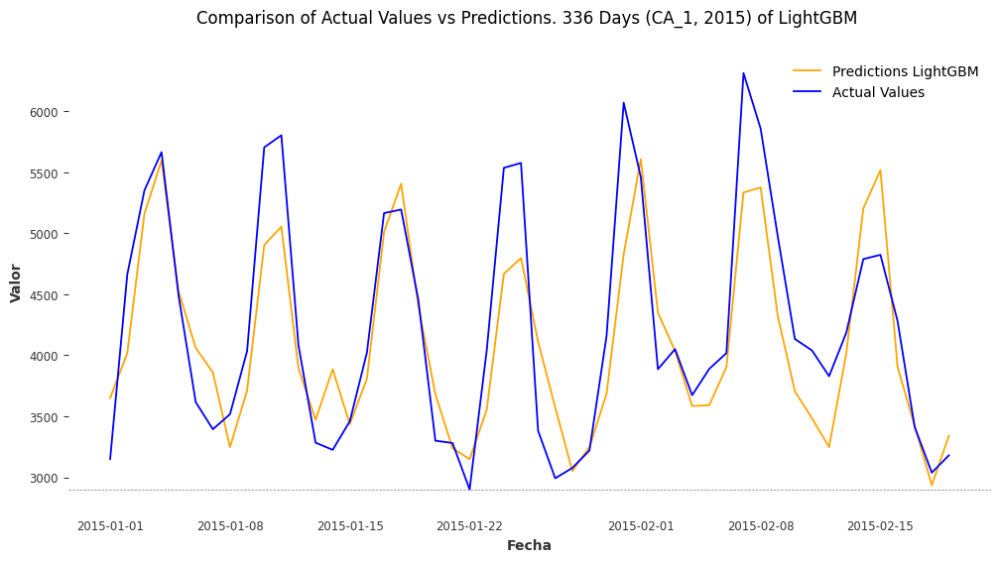

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010892 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 93548
[LightGBM] [Info] Number of data points in the train set: 1069, number of used features: 728
[LightGBM] [Info] Start training from score 0.252257


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


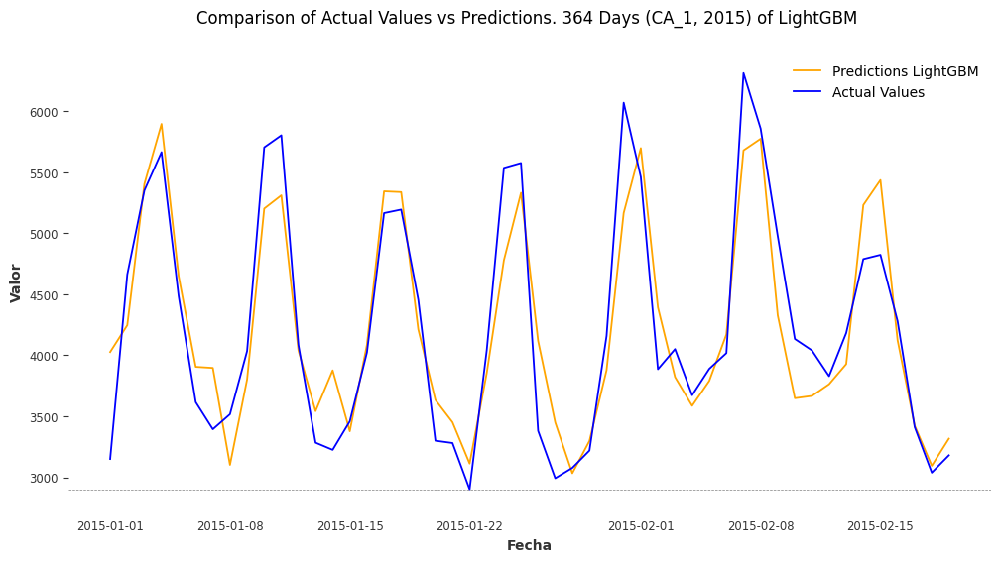

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 93548
[LightGBM] [Info] Number of data points in the train set: 1069, number of used features: 728
[LightGBM] [Info] Start training from score 4144.521048


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


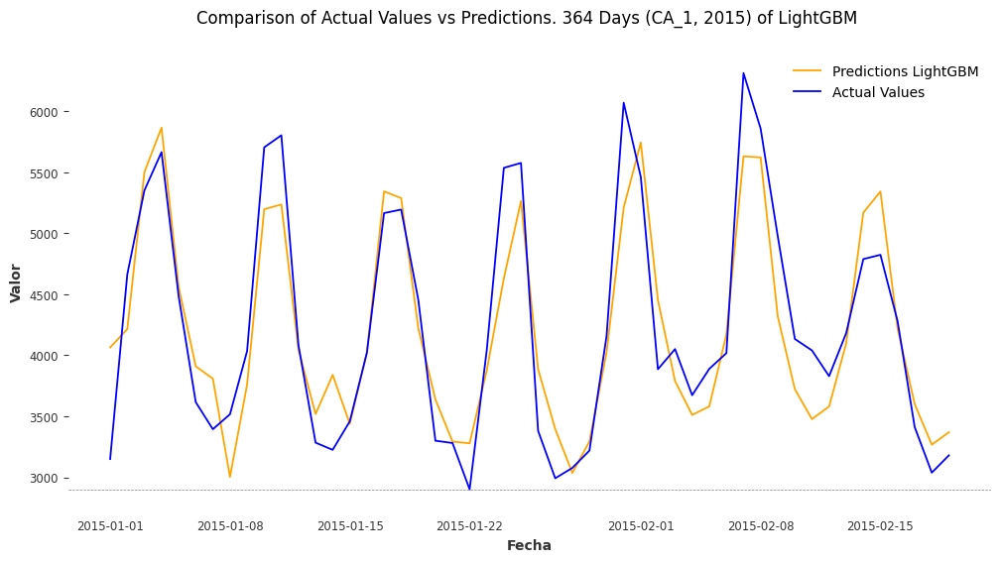

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 93805
[LightGBM] [Info] Number of data points in the train set: 1068, number of used features: 730
[LightGBM] [Info] Start training from score 0.252166


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


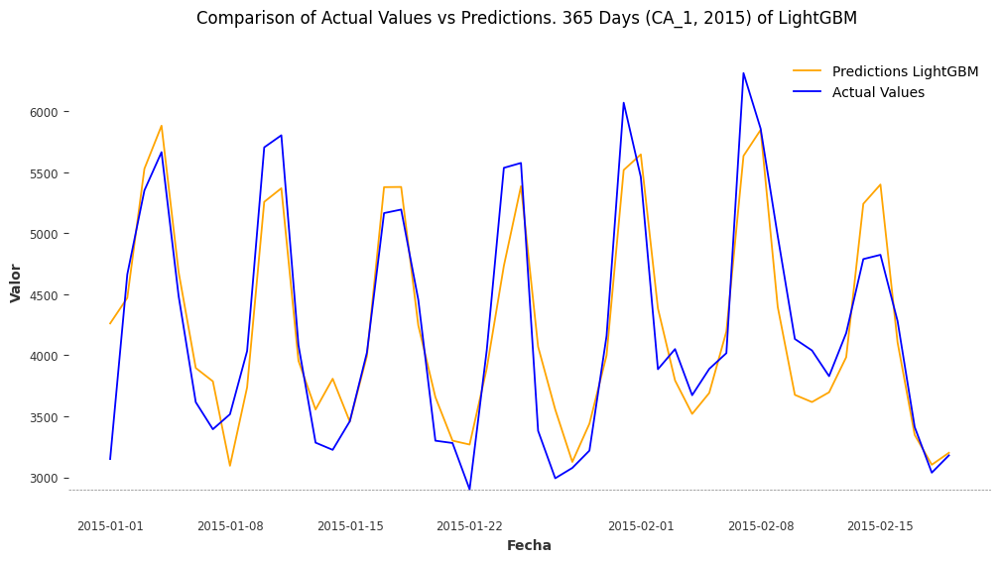

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 93805
[LightGBM] [Info] Number of data points in the train set: 1068, number of used features: 730
[LightGBM] [Info] Start training from score 4144.430712


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


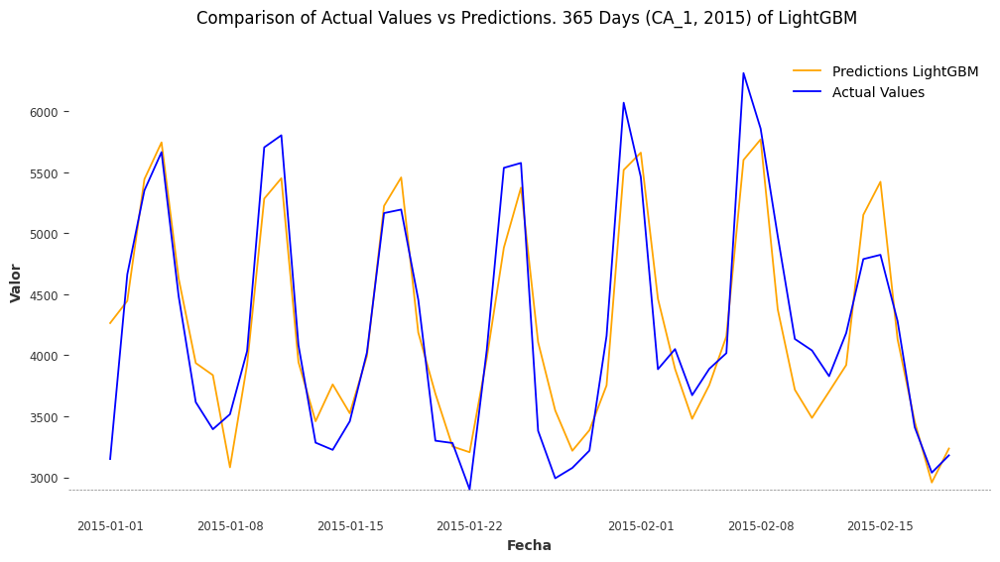

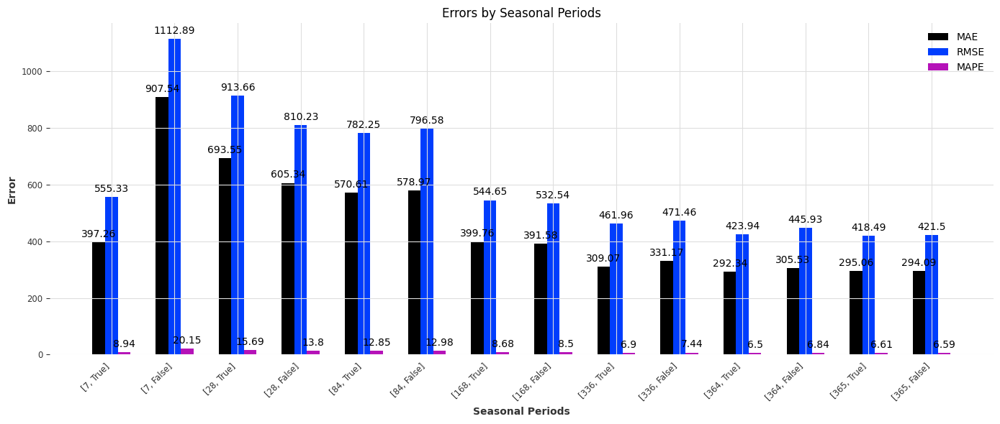

In [45]:
errors = []


hyperparameters = {
    'n_estimators': [2000],
    'learning_rate': [0.01],
    'max_depth': [3],
    'min_child_weight': [5],
    'subsample': [0.8],
    'colsample_bytree': [0.8],
    'gamma': [0.05],
    'reg_alpha': [0.5],
    'reg_lambda': [1],
    'lags_model': [7, 28, 84, 168, 336, 364, 365],  # Add lags_model values
    'scaling': [True, False]  # Add scaling values
}

# Loop through all combinations of hyperparameters
for params in itertools.product(*hyperparameters.values()):
    # Create a dictionary of current hyperparameters
    current_params = dict(zip(hyperparameters.keys(), params))

    # Extract lags_model and scaling values from current_params
    lags_model = current_params['lags_model']
    scaling = current_params['scaling']

    # Call the cross-validation function with the current hyperparameters
    extra_dates, true_values, predicted_values, end_of_training = cross_validation_LightGBM(
        stores_train, stores_test, lags_model, scaling=scaling,
        model=lambda: models.LightGBMModel(**{k: v for k, v in current_params.items() if k != 'lags_model' and k != 'scaling'})

        # model=lambda: models.LightGBMModel(**{k: v for k, v in current_params.items() if k != 'lags_model' and k != 'scaling'})
    )

    # Store the results and plot the predictions
    store = 'CA_1'
    days_to_plot = 50
    plot_predictions_zoom(
        store, extra_dates, true_values, predicted_values,
        "LightGBM", days_to_plot, lags_model, one_plot=True
    )

    # Compute the errors for the current combination of parameters
    mae_lgbm, rmse_lgbm, mape_lgbm = compute_errors(true_values, predicted_values)
    errors.append(([lags_model, scaling], mae_lgbm, rmse_lgbm, mape_lgbm))

plot_errors(errors)


In [46]:
element = 10
mae_lgbm, rmse_lgbm, mape_lgbm  = errors[element][1], errors[element][2], errors[element][3]

print(f"MAE: {mae_lgbm}")
print(f"RMSE: {rmse_lgbm}")
print(f"MAPE: {mape_lgbm} %")

MAE: 292.34056861841873
RMSE: 423.94366485566667
MAPE: 6.503331730673157 %


Default LightGBM with 364 False: 
- MAE: 294.0884710372087
- RMSE: 421.4950860595485
- MAPE: 6.586623606967522 %

In [47]:
predicted_values_dict['LightGBM'] = predicted_values

# Random Forest

`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


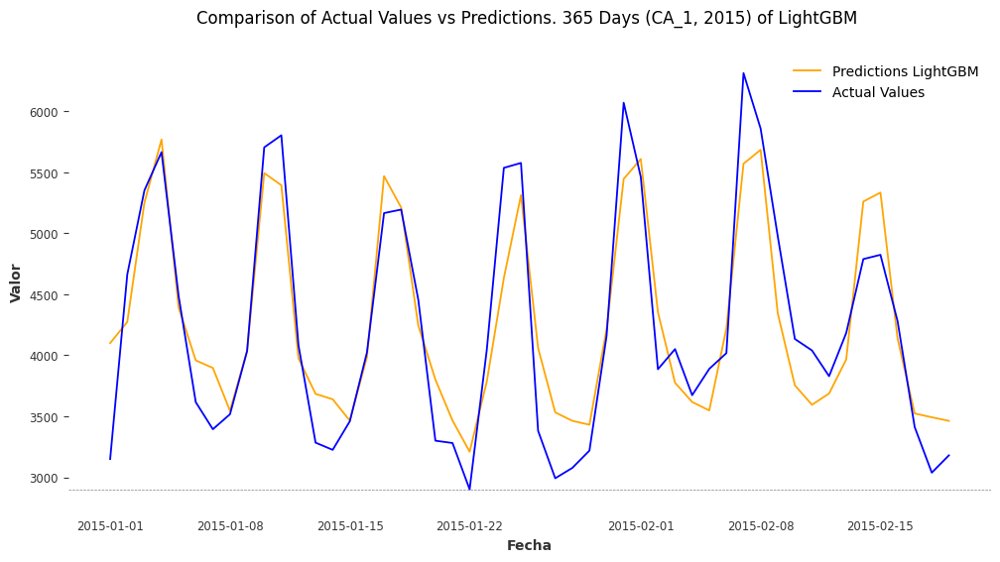

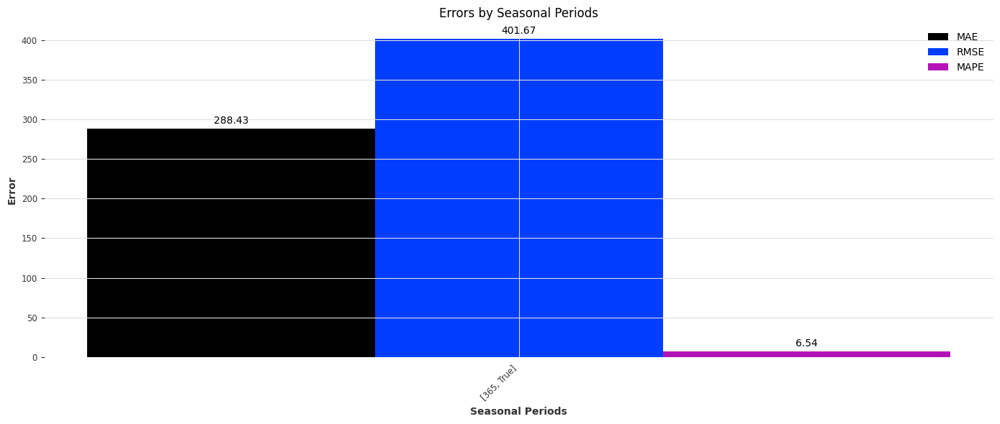

In [48]:
errors = []

hyperparameters = {
    'n_estimators': [2000],
    'learning_rate': [0.01],
    'max_depth': [3],
    'min_child_weight': [5],
    'subsample': [0.8],
    'colsample_bytree': [0.8],
    'gamma': [0.05],
    'reg_alpha': [0.5],
    'reg_lambda': [1],
    'lags_model': [365],  # Add lags_model values
    'scaling': [True]  # Add scaling values
}

# Loop through all combinations of hyperparameters
for params in itertools.product(*hyperparameters.values()):
    # Create a dictionary of current hyperparameters
    current_params = dict(zip(hyperparameters.keys(), params))

    # Extract lags_model and scaling values from current_params
    lags_model = current_params['lags_model']
    scaling = current_params['scaling']

    # Call the cross-validation function with the current hyperparameters
    extra_dates, true_values, predicted_values, end_of_training = cross_validation_RandomForest(
        stores_train, stores_test, lags_model, scaling=scaling,
        model=lambda: models.LightGBMModel(**{k: v for k, v in current_params.items() if k != 'lags_model' and k != 'scaling'})

        # model=lambda: models.LightGBMModel(**{k: v for k, v in current_params.items() if k != 'lags_model' and k != 'scaling'})
    )

    # Store the results and plot the predictions
    store = 'CA_1'
    days_to_plot = 50
    plot_predictions_zoom(
        store, extra_dates, true_values, predicted_values,
        "LightGBM", days_to_plot, lags_model, one_plot=True
    )

    # Compute the errors for the current combination of parameters
    mae_rndforest, rmse_rndforest, mape_rndforest = compute_errors(true_values, predicted_values)
    errors.append(([lags_model, scaling], mae_rndforest, rmse_rndforest, mape_rndforest))
    
    predicted_values_dict['RandomForest'] = predicted_values

plot_errors(errors)


# Time Series Decomposition

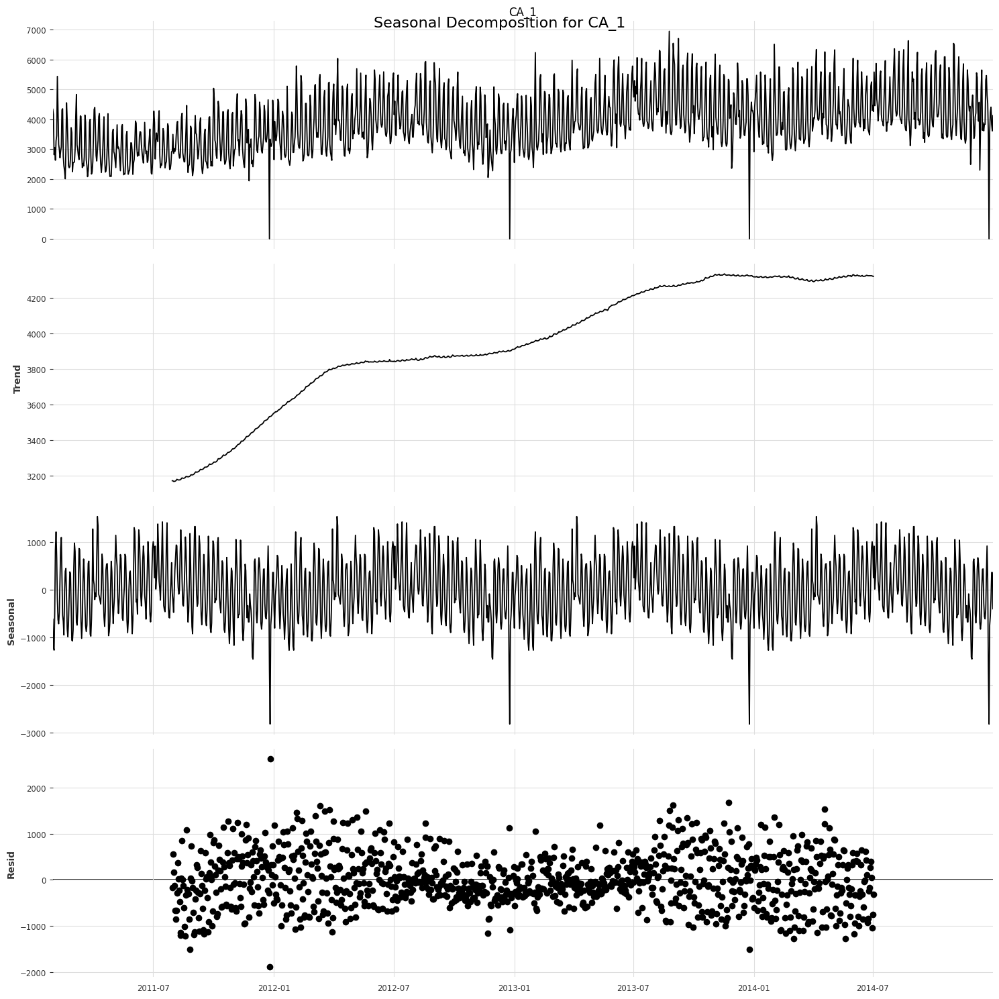

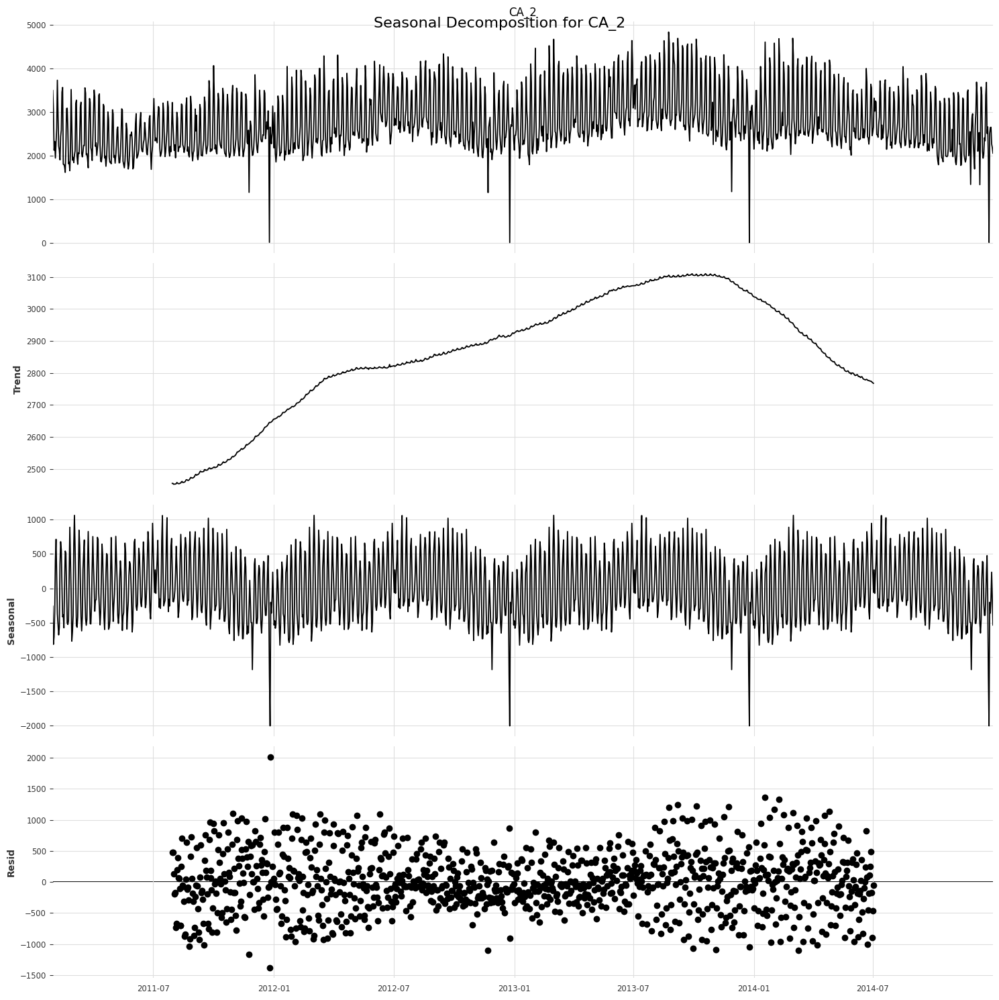

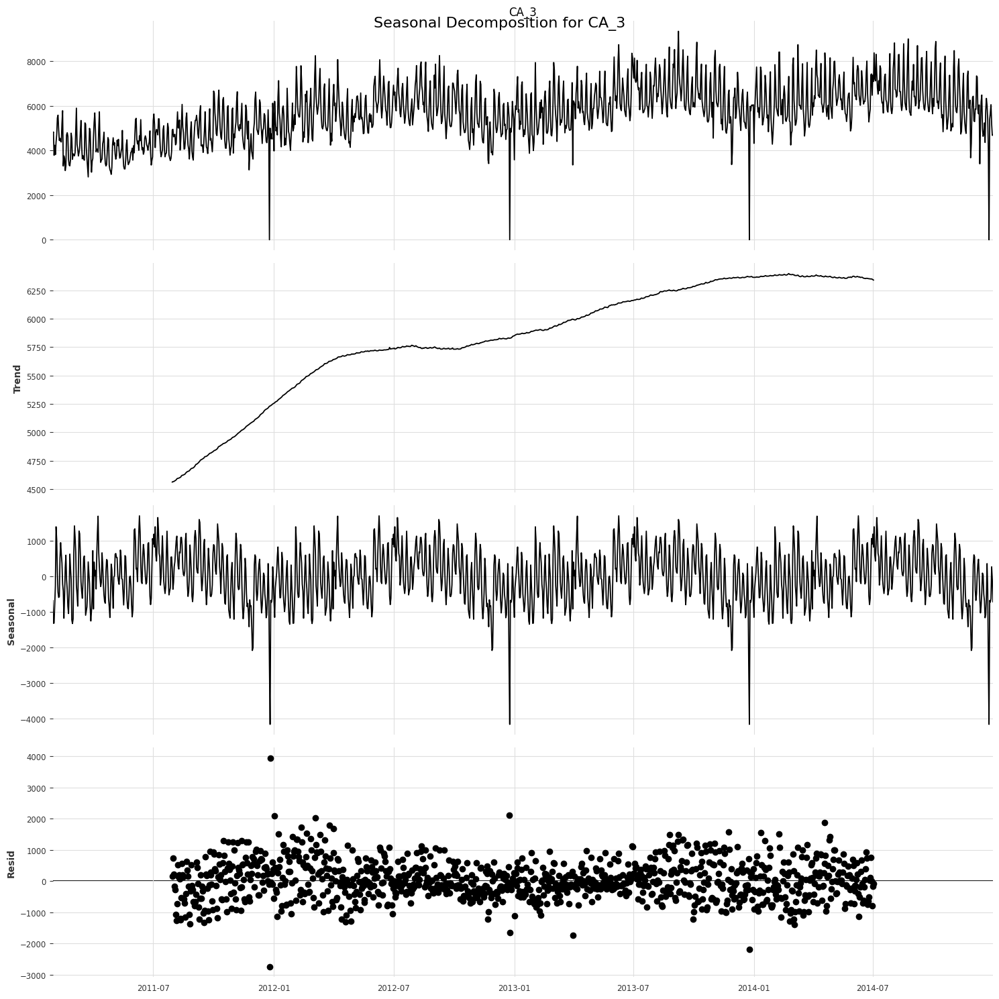

In [49]:
stores_to_analyze = ['CA_1', 'CA_2', 'CA_3']  # Adjust based on your needs

# Decompose time series for each store
for store in stores_to_analyze:
    # Resample data to daily frequency and fill missing values
    store_data = stores_train[store].resample('D').mean().ffill().asfreq('D')
    
    # Seasonal decomposition
    plt.rc("figure", figsize=(15, 15))
    result = seasonal_decompose(store_data, model='additive', period=365)
    result.plot()
    plt.suptitle(f'Seasonal Decomposition for {store}', fontsize=16)
    plt.show()

## Additive Decomposition Using Simple Moving Average

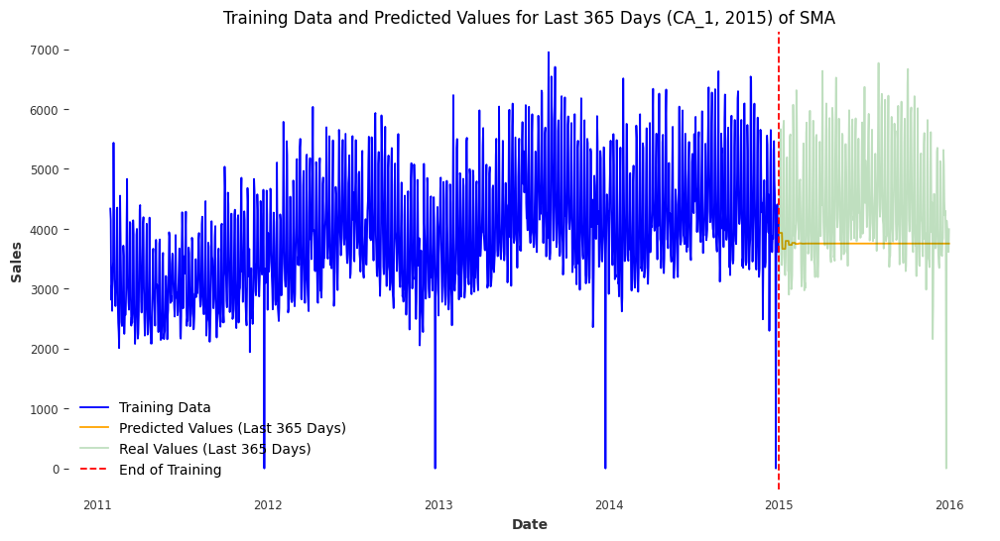

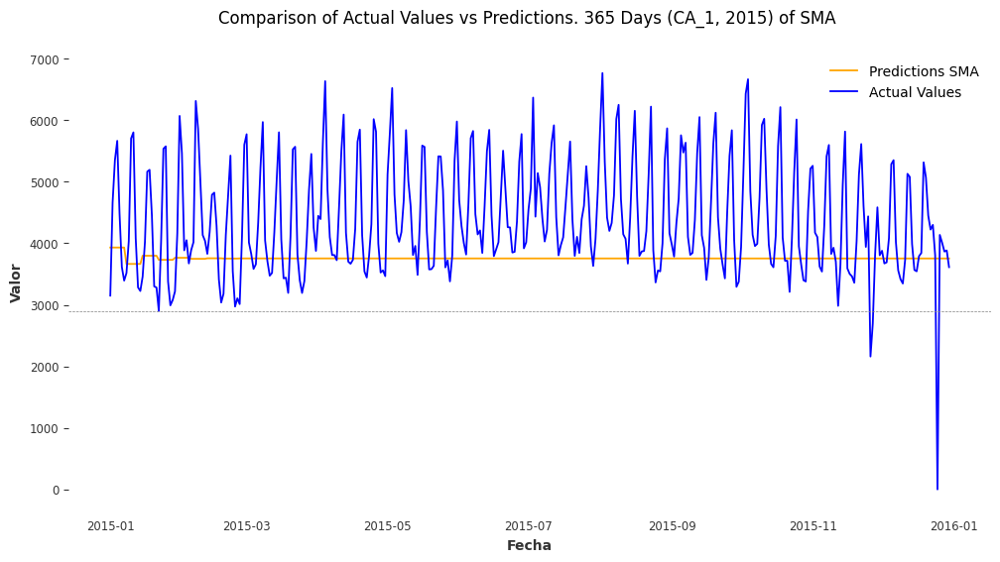

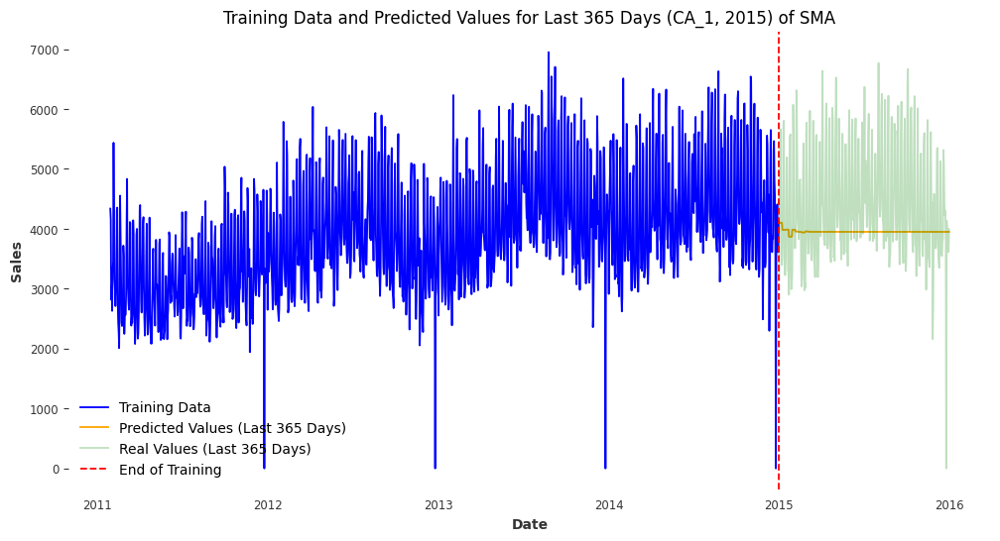

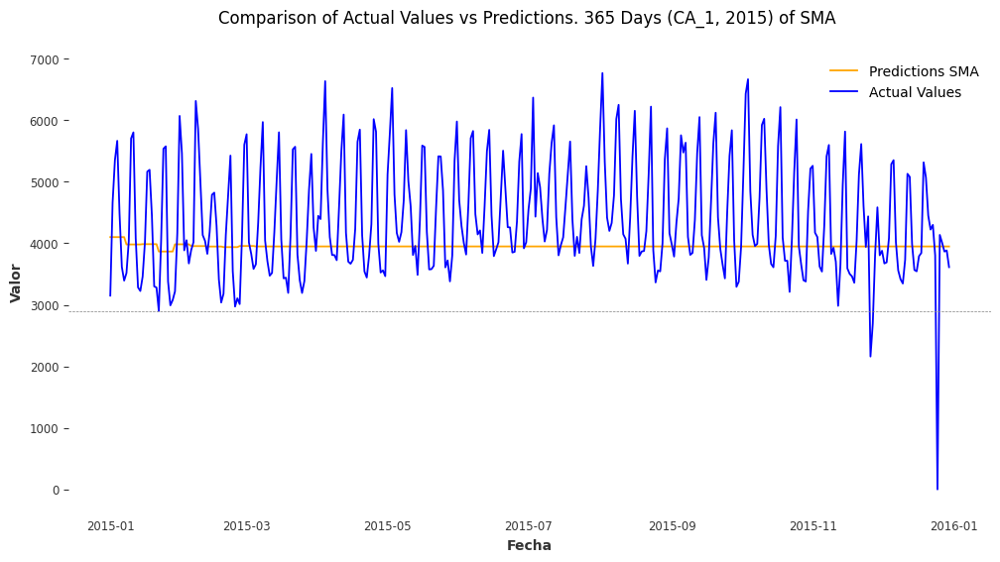

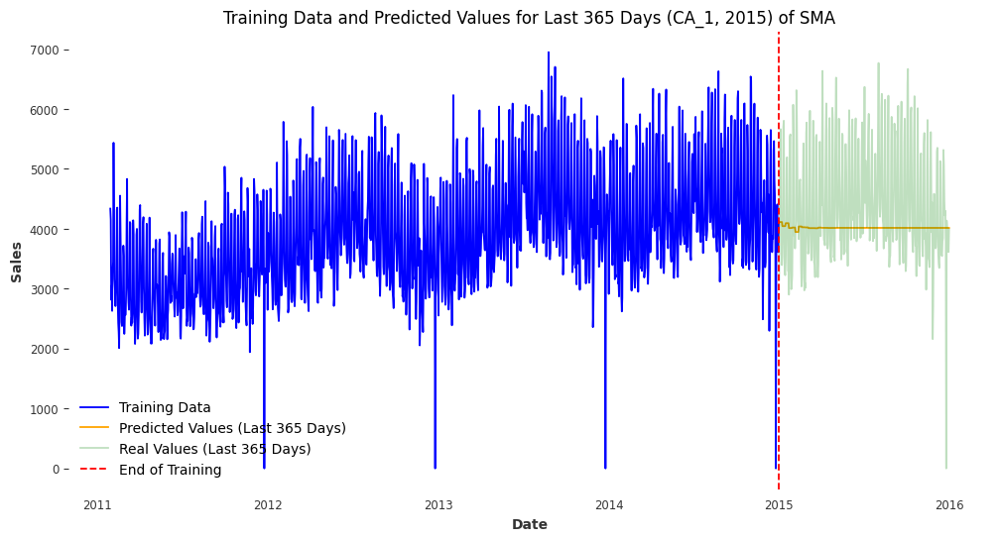

...

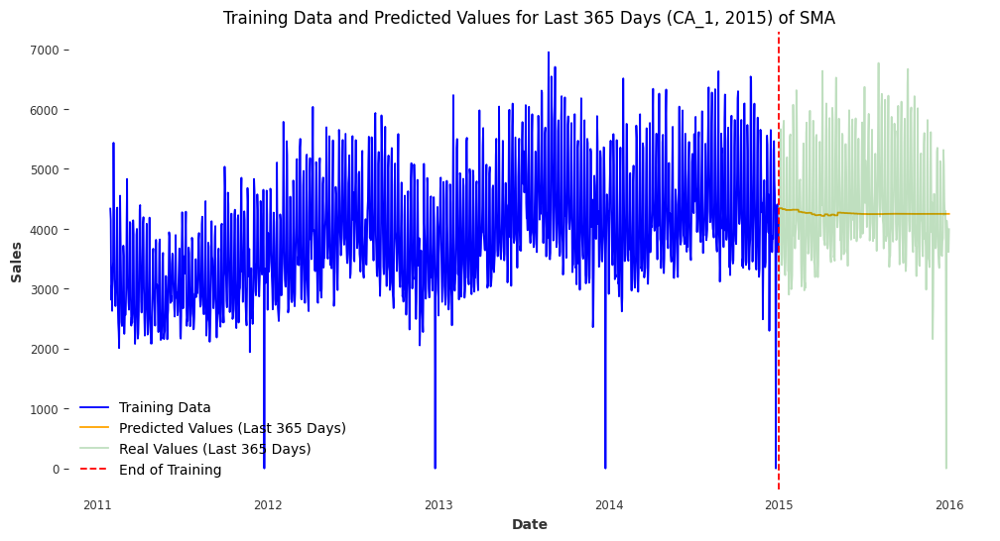

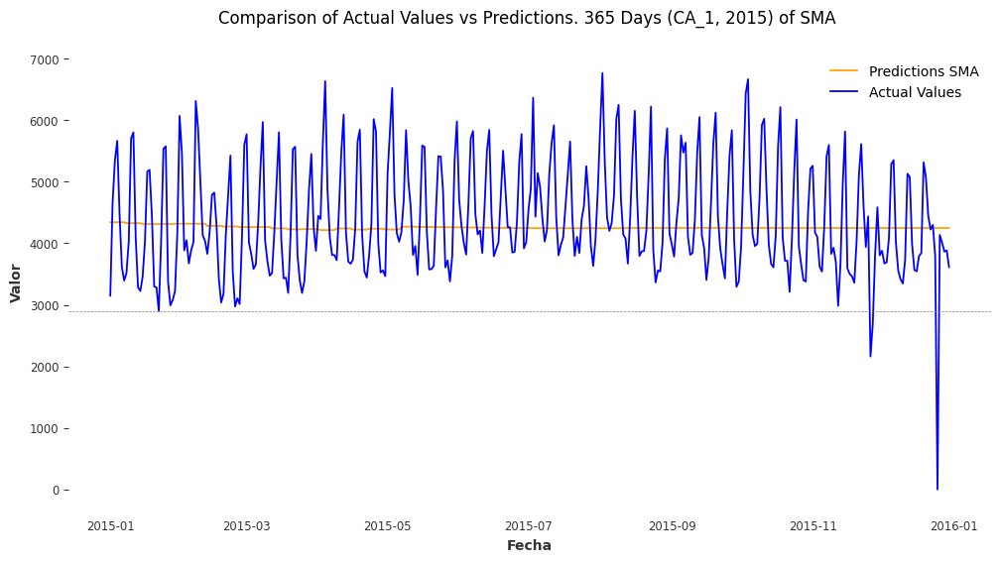

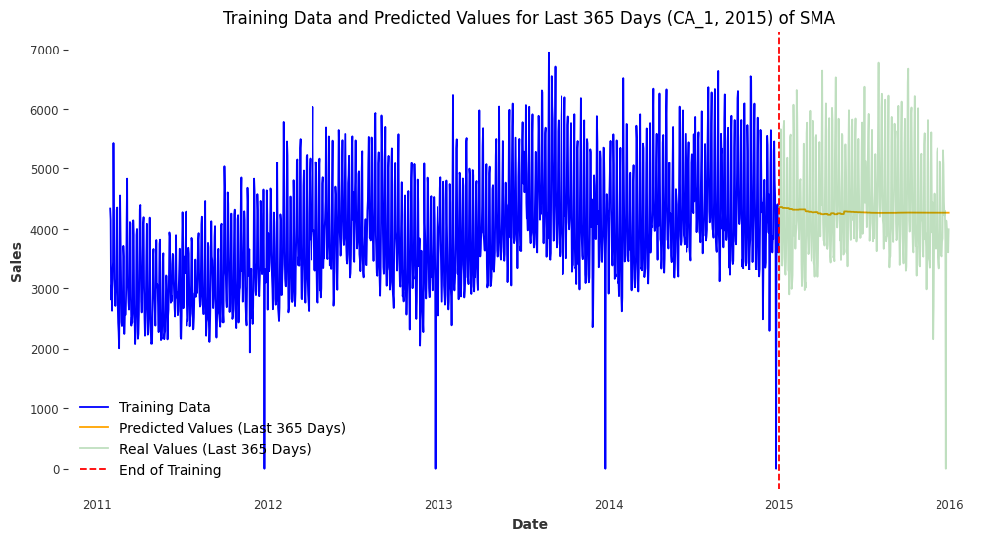

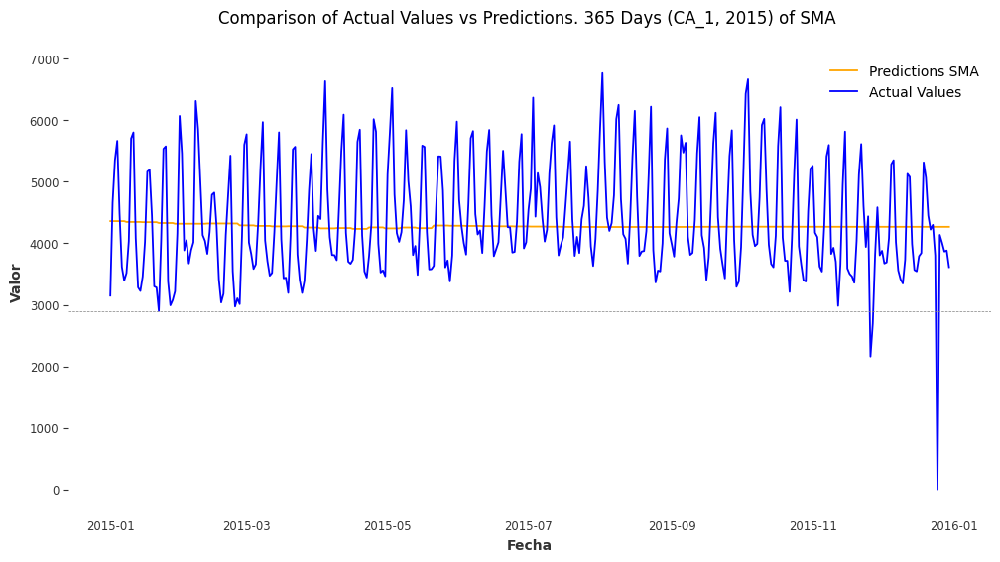

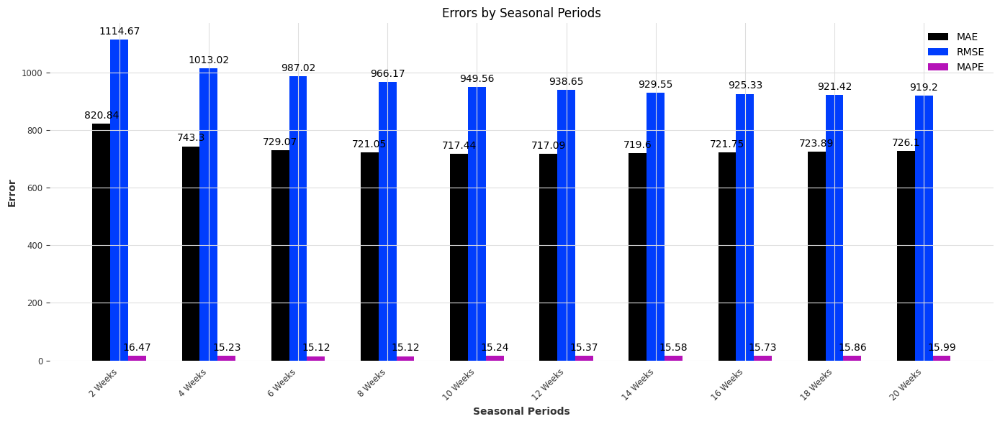

In [50]:
N_values = [2, 4, 6, 8, 10, 12, 14, 16, 18, 20]
errors = []
store = 'CA_1'
start_date = '2015-01-01'
window_weeks = 4
model_name = "SMA"

for N in N_values:
    predicted_values = iterative_sma_forecast(
        data=stores_train, store=store,
        start_date=start_date, num_weeks=52,  # Predict for the entire year
        window_weeks=N  # Use the last N weeks for each prediction
    )
    
    true_values = stores_test['CA_1']['2015']
    
    # If predicted_values is shorter than true_values, append the last value
    if len(predicted_values) < len(true_values):
        last_value = pd.Series([predicted_values.iloc[-1]], index=[true_values.index[-1]])
        predicted_values = pd.concat([predicted_values, last_value])
    
    # Ensure predicted_values has the same length as true_values (extra_dates)
    if len(predicted_values) > len(true_values):
        predicted_values = predicted_values[:len(true_values)]  # Slice to match length
    
    extra_dates = predicted_values.index
    end_of_training = stores_train.index[-1]
    
    # Plot predictions for 1 year
    plot_predictions_1_year(
        data_train=stores_train, store=store, extra_dates=extra_dates,
        true_values=true_values,  # True values for 2015
        predicted_values=predicted_values, end_of_training=end_of_training,  # End of training period
        seasonal_periods=365, model_name=model_name
    )
    
    days_to_plot = 364
    plot_predictions_zoom(store, extra_dates, true_values, predicted_values, 
                          model_name, days_to_plot, 365, one_plot=True,
                            trend = '', seasonality = '', )


    # Compute errors (MAE, RMSE, MAPE)
    mae_sma, rmse_sma, mape_sma = compute_errors(true_values, predicted_values)
    errors.append((f"{N} Weeks", mae_sma, rmse_sma, mape_sma))

# Plot errors
plot_errors(errors)


In [51]:
element = 5 # 12 Weeks
mae_sma, rmse_sma, mape_sma  = errors[element][1], errors[element][2], errors[element][3]

print(f"MAE: {mae_sma}")
print(f"RMSE: {rmse_sma}")
print(f"MAPE: {mape_sma} %")


predicted_values_dict['SMA'] = predicted_values

MAE: 717.0912661745542
RMSE: 938.6482779501315
MAPE: 15.371368018429244 %


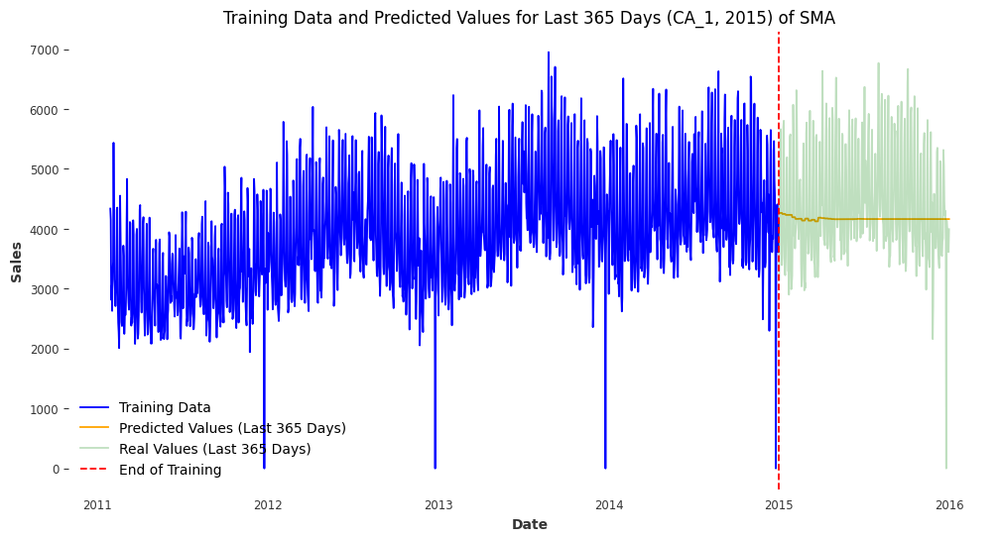

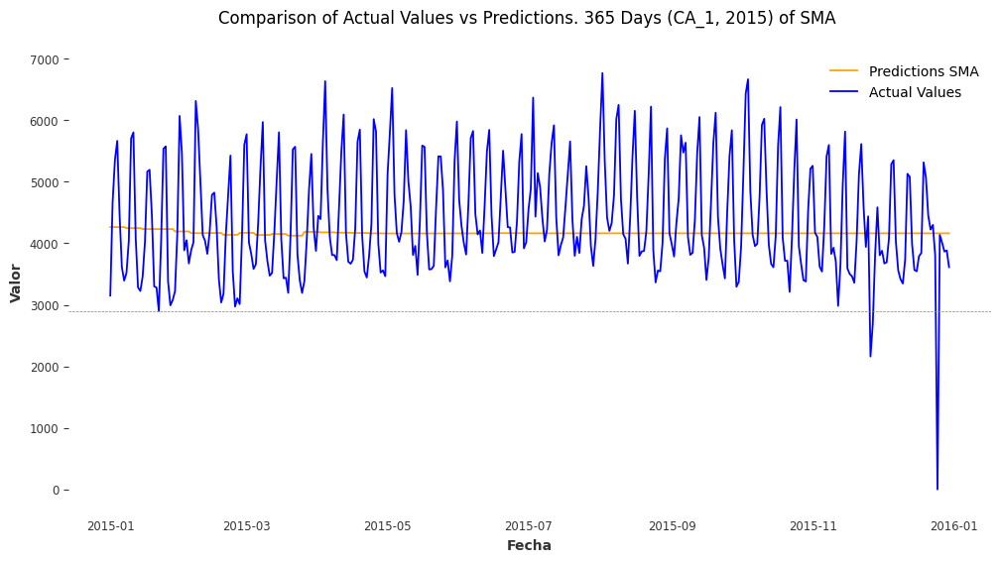

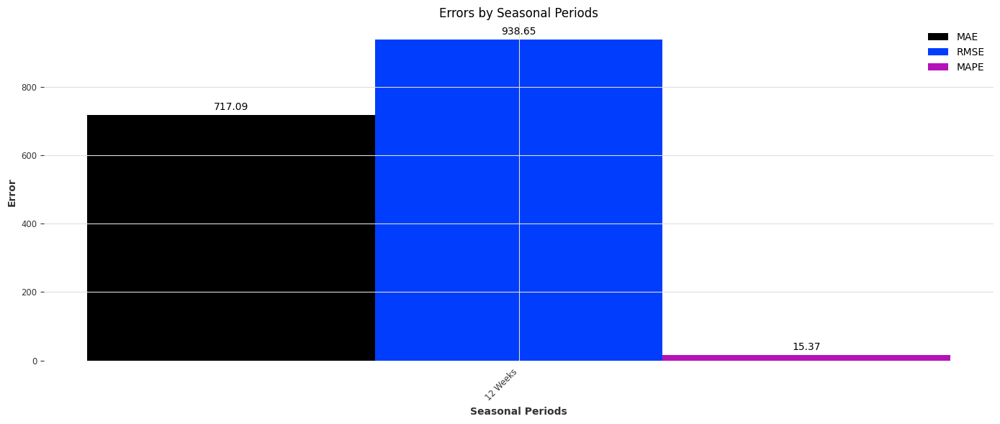

In [52]:
N_values = [12]
errors = []
store = 'CA_1'
start_date = '2015-01-01'
window_weeks = 4
model_name = "SMA"

for N in N_values:
    predicted_values = iterative_sma_forecast(
        data=stores_train, store=store,
        start_date=start_date, num_weeks=52,  # Predict for the entire year
        window_weeks=N  # Use the last N weeks for each prediction
    )
    
    true_values = stores_test['CA_1']['2015']
    
    # If predicted_values is shorter than true_values, append the last value
    if len(predicted_values) < len(true_values):
        last_value = pd.Series([predicted_values.iloc[-1]], index=[true_values.index[-1]])
        predicted_values = pd.concat([predicted_values, last_value])
    
    # Ensure predicted_values has the same length as true_values (extra_dates)
    if len(predicted_values) > len(true_values):
        predicted_values = predicted_values[:len(true_values)]  # Slice to match length
    
    extra_dates = predicted_values.index
    end_of_training = stores_train.index[-1]
    
    # Plot predictions for 1 year
    plot_predictions_1_year(
        data_train=stores_train, store=store, extra_dates=extra_dates,
        true_values=true_values,  # True values for 2015
        predicted_values=predicted_values, end_of_training=end_of_training,  # End of training period
        seasonal_periods=365, model_name=model_name
    )
    
    days_to_plot = 364
    plot_predictions_zoom(store, extra_dates, true_values, predicted_values, 
                          model_name, days_to_plot, 365, one_plot=True,
                            trend = '', seasonality = '', )


    # Compute errors (MAE, RMSE, MAPE)
    mae_sma, rmse_sma, mape_sma = compute_errors(true_values, predicted_values)
    errors.append((f"{N} Weeks", mae_sma, rmse_sma, mape_sma))

# Plot errors
plot_errors(errors)


In [53]:
element = 0 # 12 Weeks
mae_sma, rmse_sma, mape_sma  = errors[element][1], errors[element][2], errors[element][3]

print(f"MAE: {mae_sma}")
print(f"RMSE: {rmse_sma}")
print(f"MAPE: {mape_sma} %")

predicted_values_dict['SMA'] = predicted_values

MAE: 717.0912661745542
RMSE: 938.6482779501315
MAPE: 15.371368018429244 %


# Naive Error Bases

$$
\text{MAPE} = \frac{1}{n} \sum_{i=1}^{n} \left| \frac{y_{\text{true}, i} - y_{\text{pred}, i}}{y_{\text{true}, i}} \right| \times 100
$$

$$
\text{RMSE} = \sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_{\text{true}, i} - y_{\text{pred}, i})^2}
$$

$$
\text{MAE} = \frac{1}{n} \sum_{i=1}^{n} \left| y_{\text{true}, i} - y_{\text{pred}, i} \right|
$$


#### Naive Model (Last Observation Carried Forward):

Forecast each of the next 365 days using the last value from the training data.

In [54]:
naive_forecast = np.full_like(CA_1_test_inv, CA_1_train_inv[-1], dtype=np.float32)
# Every element is filled with the last value of CA_1_train_inv (CA_1_train_inv[-1]).
# This is a naive forecasting method where the forecast for all future values is simply the last observed value from the training set

mae_naive = mean_absolute_error(CA_1_test_inv, naive_forecast)
rmse_naive = np.sqrt(mean_squared_error(CA_1_test_inv, naive_forecast))
mape_naive = np.median(np.abs((CA_1_test_inv - naive_forecast) / CA_1_test_inv)) * 100

predicted_values_dict['Naive Forecast'] = naive_forecast

C:\Users\Alejo-Lenovo\AppData\Local\Temp\ipykernel_20936\622849218.py:7: RuntimeWarning: divide by zero encountered in divide
  mape_naive = np.median(np.abs((CA_1_test_inv - naive_forecast) / CA_1_test_inv)) * 100


#### Mean or Median of the Last Year:

If you take the mean (or median) of the last 365 days in your training set:

In [55]:
last_year_mean = np.median(CA_1_train_inv[-365:])
seasonal_forecast = np.full_like(CA_1_test_inv, last_year_mean, dtype=np.float32)

# Compute error metrics for Seasonal Mean Model
mae_last_year = mean_absolute_error(CA_1_test_inv, seasonal_forecast)
rmse_last_year = np.sqrt(mean_squared_error(CA_1_test_inv, seasonal_forecast))
mape_last_year = np.median(np.abs((CA_1_test_inv - seasonal_forecast) / CA_1_test_inv)) * 100


predicted_values_dict['Last Year Median'] = seasonal_forecast


print(mape_last_year)

17.981607846443655


C:\Users\Alejo-Lenovo\AppData\Local\Temp\ipykernel_20936\2881611282.py:7: RuntimeWarning: divide by zero encountered in divide
  mape_last_year = np.median(np.abs((CA_1_test_inv - seasonal_forecast) / CA_1_test_inv)) * 100


#### Seasonal Naive Model

For a seasonal naive forecast, you would take the value from the same day last year (lag = 365).

In [56]:
seasonal_naive_forecast = CA_1_train_inv[-365:];  # Example: 365th day of the last year
seasonal_naive_forecast = np.tile(seasonal_naive_forecast, (len(CA_1_test_inv) // 365 + 1,)).flatten()[:len(CA_1_test_inv)]  # Repeat for the entire test period

# Compute error metrics for Seasonal Naive Model
mae_seasonal_naive = mean_absolute_error(CA_1_test_inv, seasonal_naive_forecast)
rmse_seasonal_naive = np.sqrt(mean_squared_error(CA_1_test_inv, seasonal_naive_forecast))
mape_seasonal_naive = np.median(np.abs((CA_1_test_inv - seasonal_naive_forecast) / CA_1_test_inv)) * 100

print(CA_1_test_inv)


predicted_values_dict['Seasonal Naive Forecast'] = seasonal_naive_forecast


[2995. 2710. 2928. ... 3884. 3613. 3994.]


C:\Users\Alejo-Lenovo\AppData\Local\Temp\ipykernel_20936\991840255.py:7: RuntimeWarning: divide by zero encountered in divide
  mape_seasonal_naive = np.median(np.abs((CA_1_test_inv - seasonal_naive_forecast) / CA_1_test_inv)) * 100


## Now we are going to compare between the different models

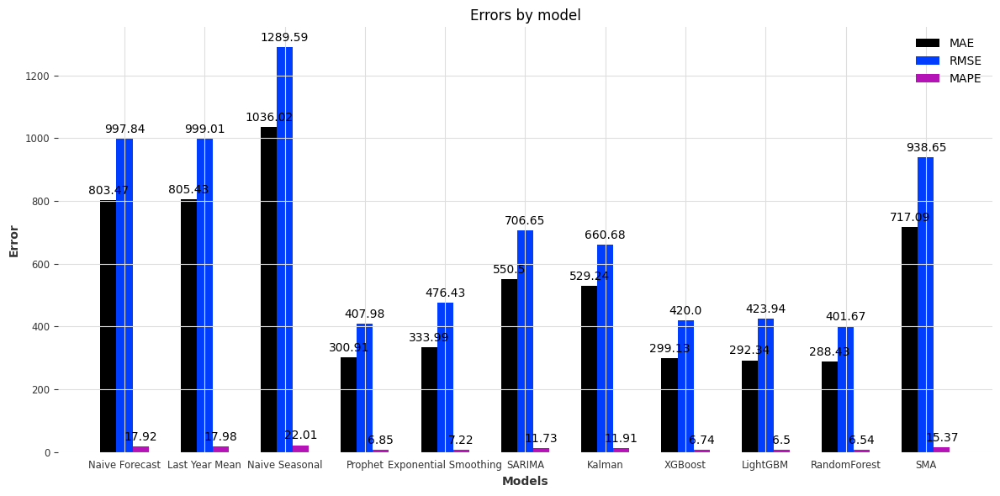

In [57]:
# Define the errors for each model
models = ['Naive Forecast', 'Last Year Mean', 'Naive Seasonal','Prophet', 'Exponential Smoothing', 'SARIMA', 'Kalman', 'XGBoost','LightGBM', 'RandomForest', 'SMA']
mae_values = [mae_naive, mae_last_year, mae_seasonal_naive,  mae_proph, mae_expsmooth, mae_sarima, mae_kalman, mae_xgb, mae_lgbm, mae_rndforest, mae_sma ]
rmse_values = [rmse_naive, rmse_last_year,rmse_seasonal_naive,  rmse_proph, rmse_expsmooth, rmse_sarima, rmse_kalman, rmse_xgb, rmse_lgbm, rmse_rndforest, rmse_sma]
mape_values = [mape_naive, mape_last_year,mape_seasonal_naive, mape_proph, mape_expsmooth, mape_sarima, mape_kalman, mape_xgb, mape_lgbm, mape_rndforest, mape_sma]

# Create a DataFrame to store and rank the errors for each model
error_df = pd.DataFrame({
    'Model': models,
    'MAE': mae_values,
    'RMSE': rmse_values,
    'MAPE': mape_values
})


# Plot the errors
x = np.arange(len(models))  # the label locations
width = 0.2  # the width of the bars

fig, ax = plt.subplots(figsize=(12, 6))
rects1 = ax.bar(x - width, mae_values, width, label='MAE')
rects2 = ax.bar(x, rmse_values, width, label='RMSE')
rects3 = ax.bar(x + width, mape_values, width, label='MAPE')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_xlabel('Models')
ax.set_ylabel('Error')
ax.set_title('Errors by model')
ax.set_xticks(x)
ax.set_xticklabels(models)
ax.legend()

# Attach a text label above each bar in *rects*, displaying its height.
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(round(height, 2)),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

fig.tight_layout()

plt.show()

In [58]:
# Rank models based on MAE, RMSE, and MAPE (lower is better)
error_df['Rank_MAE'] = error_df['MAE'].rank()
error_df['Rank_RMSE'] = error_df['RMSE'].rank()
error_df['Rank_MAPE'] = error_df['MAPE'].rank()

# Calculate the average rank (lower average rank is better)
error_df['Avg_Rank'] = error_df[['Rank_MAE', 'Rank_RMSE', 'Rank_MAPE']].mean(axis=1)

# Sort models based on average rank (ascending order, best models first)
error_df_sorted = error_df.sort_values('Avg_Rank')

In [59]:
# Select the top 3 models based on the lowest average rank
top_3_models = error_df_sorted['Model'].head(3).values
print("Top 3 models selected for the ensemble:", top_3_models)

# Check the shape of predictions for each model
for model in top_3_models:
    print(f"Shape of predictions for {model}: {predicted_values_dict[model].shape}")


Top 3 models selected for the ensemble: ['RandomForest' 'LightGBM' 'XGBoost']
Shape of predictions for RandomForest: (365,)
Shape of predictions for LightGBM: (365,)
Shape of predictions for XGBoost: (1788,)


In [60]:
predicted_values_dict['XGBoost'] = predicted_values_dict['XGBoost'][-365:]

for model in top_3_models:
    print(f"Shape of predictions for {model}: {predicted_values_dict[model].shape}")

Shape of predictions for RandomForest: (365,)
Shape of predictions for LightGBM: (365,)
Shape of predictions for XGBoost: (365,)


### Include SMA

In [61]:
# Define the model you want to include manually (for example, 'SARIMA')
model_to_include = 'SMA'

# Check if the model is not already in the top list and add it if necessary
if model_to_include not in top_3_models:
    # Add the model you want to include to the list
    top_3_models = np.append(top_3_models, model_to_include)

# Re-sort the models after including the specific model
# Ensure that the ensemble models list is ordered correctly
top_3_models = error_df_sorted.loc[error_df_sorted['Model'].isin(top_3_models), 'Model'].values

print("Updated top models selected for the ensemble:", top_3_models)

# Check the shape of predictions for each model
for model in top_3_models:
    print(f"Shape of predictions for {model}: {predicted_values_dict[model].shape}")


Updated top models selected for the ensemble: ['RandomForest' 'LightGBM' 'XGBoost' 'SMA']
Shape of predictions for RandomForest: (365,)
Shape of predictions for LightGBM: (365,)
Shape of predictions for XGBoost: (365,)
Shape of predictions for SMA: (365,)


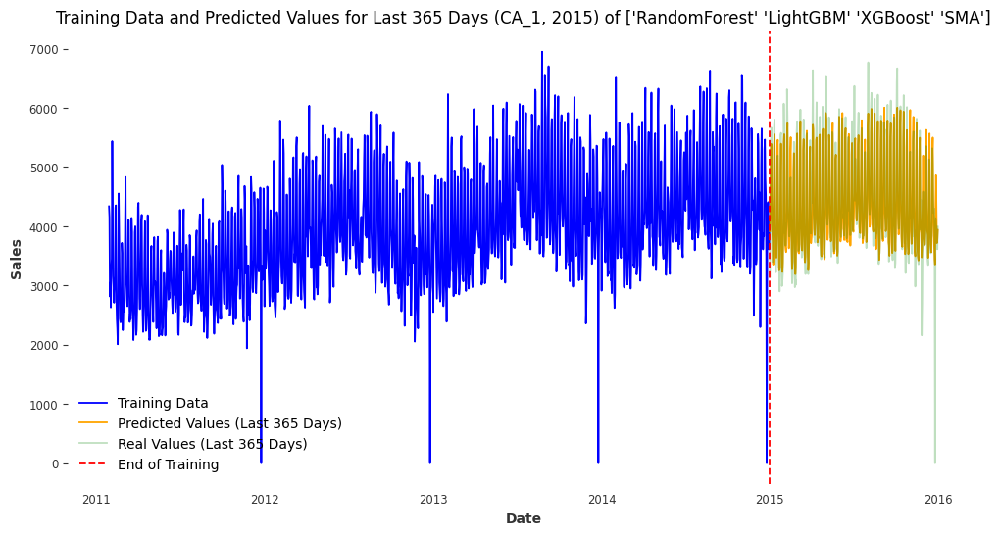

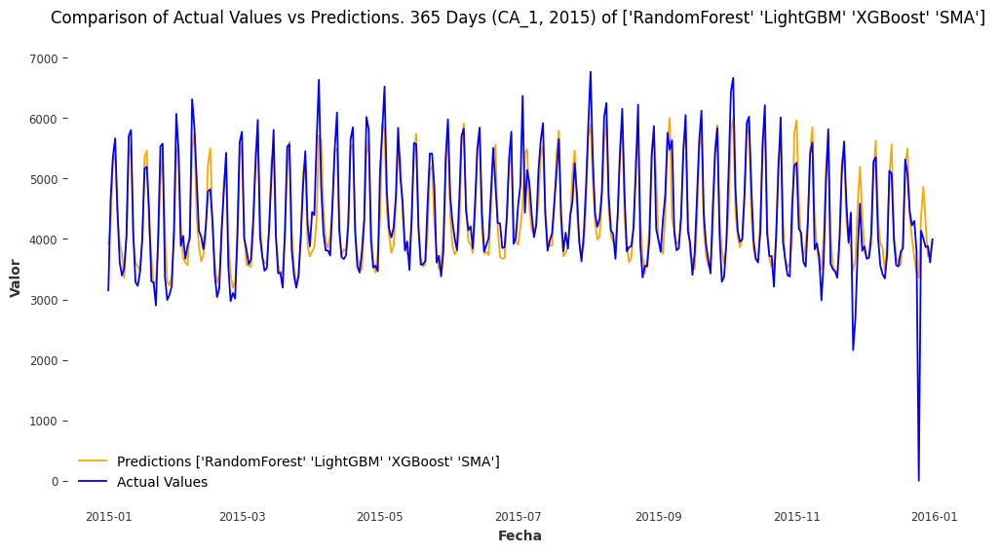

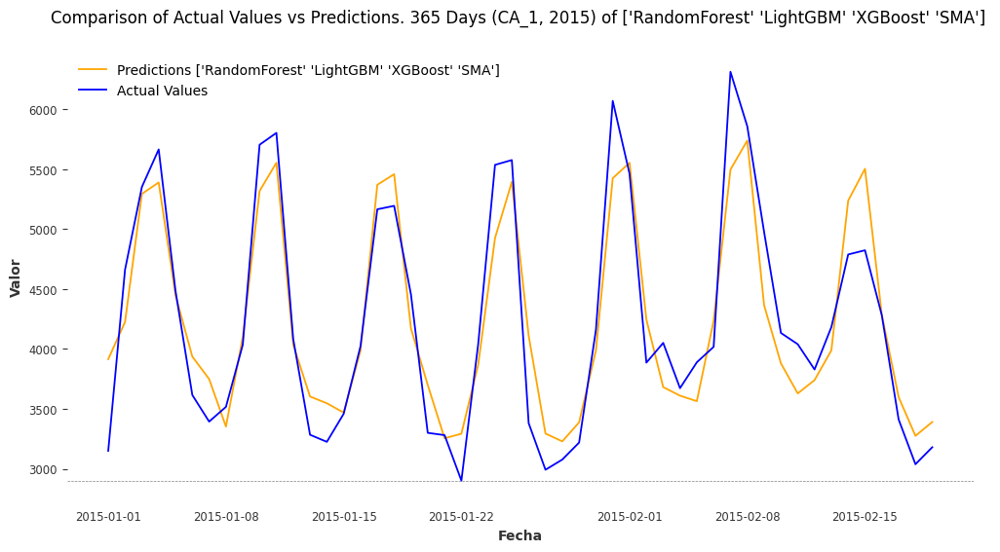

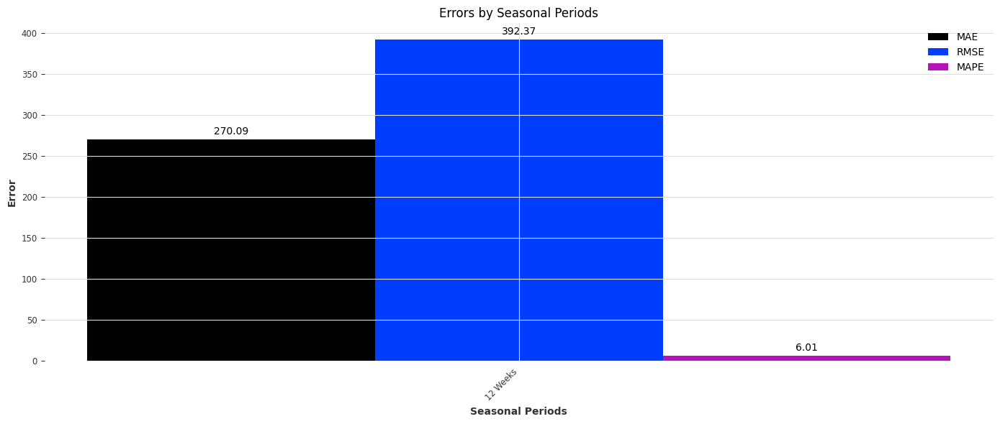

In [62]:
errors = []
store = 'CA_1'
start_date = '2015-01-01'
window_weeks = 4
model_name = top_3_models

predicted_values = np.mean([
predicted_values_dict[top_3_models[0]],
predicted_values_dict[top_3_models[1]],
predicted_values_dict[top_3_models[2]]
], axis=0)


true_values = stores_test['CA_1']['2015']

# If predicted_values is shorter than true_values, append the last value
if len(predicted_values) < len(true_values):
    last_value = pd.Series([predicted_values.iloc[-1]], index=[true_values.index[-1]])
    predicted_values = pd.concat([predicted_values, last_value])

# extra_dates = predicted_values.index
end_of_training = stores_train.index[-1]

# Plot predictions for 1 year
plot_predictions_1_year(
    data_train=stores_train, store=store, extra_dates=extra_dates,
    true_values=true_values,  # True values for 2015
    predicted_values=predicted_values, end_of_training=end_of_training,  # End of training period
    seasonal_periods=365, model_name=model_name
)

days_to_plot = 50
plot_predictions_zoom(store, extra_dates, true_values, predicted_values, 
                        model_name, days_to_plot, 365, one_plot=False,
                        trend = '', seasonality = '', )


# Compute errors (MAE, RMSE, MAPE)
mae_ensemble, rmse_ensemble, mape_ensemble = compute_errors(true_values, predicted_values)
errors.append((f"{N} Weeks", mae_ensemble, rmse_ensemble, mape_ensemble))

# Plot errors
plot_errors(errors)



# Define the errors for each model
models = ['Naive Forecast', 'Last Year Mean', 'Naive Seasonal','Prophet', 'Exponential Smoothing', 'SARIMA', 'Kalman', 'XGBoost','LightGBM', 'RandomForest', 'SMA', model_name]
mae_values = [mae_naive, mae_last_year, mae_seasonal_naive,  mae_proph, mae_expsmooth, mae_sarima, mae_kalman, mae_xgb, mae_lgbm, mae_rndforest, mae_sma,mae_ensemble ]
rmse_values = [rmse_naive, rmse_last_year,rmse_seasonal_naive,  rmse_proph, rmse_expsmooth, rmse_sarima, rmse_kalman, rmse_xgb, rmse_lgbm, rmse_rndforest, rmse_sma,rmse_ensemble]
mape_values = [mape_naive, mape_last_year,mape_seasonal_naive, mape_proph, mape_expsmooth, mape_sarima, mape_kalman, mape_xgb, mape_lgbm, mape_rndforest, mape_sma,mape_ensemble]

# Create a DataFrame to store and rank the errors for each model
error_df = pd.DataFrame({
    'Model': models,
    'MAE': mae_values,
    'RMSE': rmse_values,
    'MAPE': mape_values
})





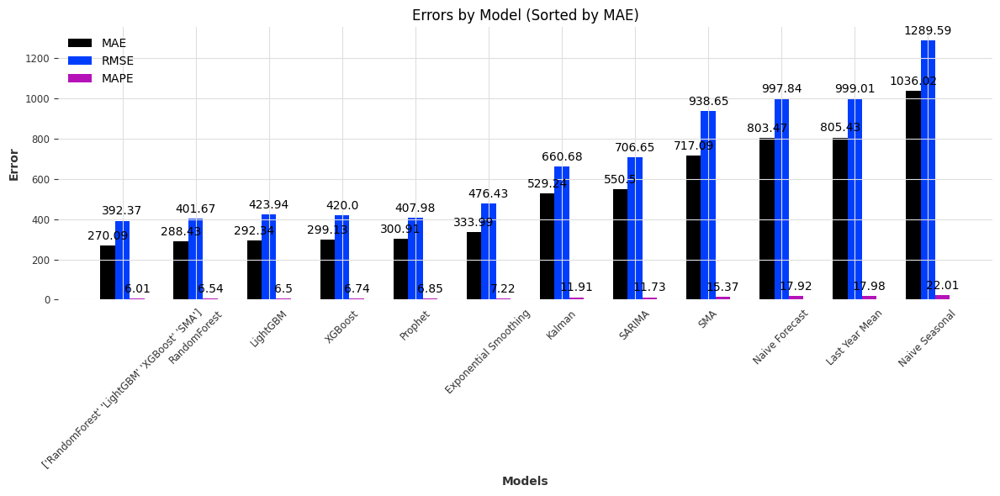

In [63]:
# Sort the DataFrame by MAE (or RMSE/MAPE) to visualize errors in ascending order
error_df_sorted = error_df.sort_values(by='MAE')  # You can choose 'RMSE' or 'MAPE' here if preferred

# Get sorted error values and model names
sorted_models = error_df_sorted['Model'].values
sorted_mae_values = error_df_sorted['MAE'].values
sorted_rmse_values = error_df_sorted['RMSE'].values
sorted_mape_values = error_df_sorted['MAPE'].values

# Plot the errors
x = np.arange(len(sorted_models))  # the label locations for sorted models
width = 0.2  # the width of the bars

fig, ax = plt.subplots(figsize=(12, 6))
rects1 = ax.bar(x - width, sorted_mae_values, width, label='MAE')
rects2 = ax.bar(x, sorted_rmse_values, width, label='RMSE')
rects3 = ax.bar(x + width, sorted_mape_values, width, label='MAPE')

# Add some text for labels, title, and custom x-axis tick labels, etc.
ax.set_xlabel('Models')
ax.set_ylabel('Error')
ax.set_title('Errors by Model (Sorted by MAE)')
ax.set_xticks(x)
ax.set_xticklabels(sorted_models, rotation=45)  # Rotate the model names if necessary
ax.legend()

# Attach a text label above each bar in *rects*, displaying its height.
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(round(height, 2)),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

# Apply the autolabel function to each set of bars
autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

fig.tight_layout()

plt.show()

In [64]:
break # para evitar correr lo de abajo otra vez

SyntaxError: 'break' outside loop (3416179220.py, line 1)

Testing with lags_model=6, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


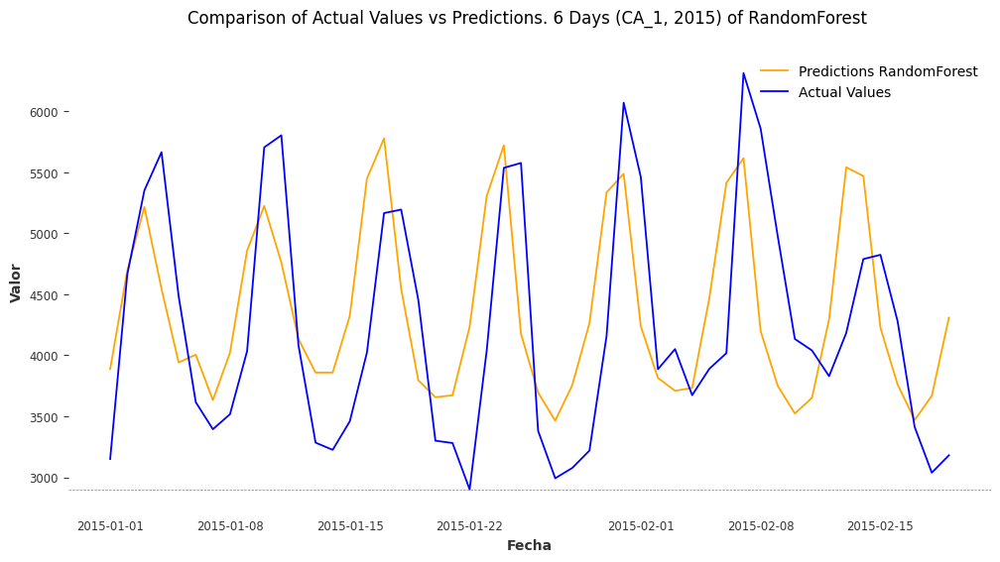

Testing with lags_model=6, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


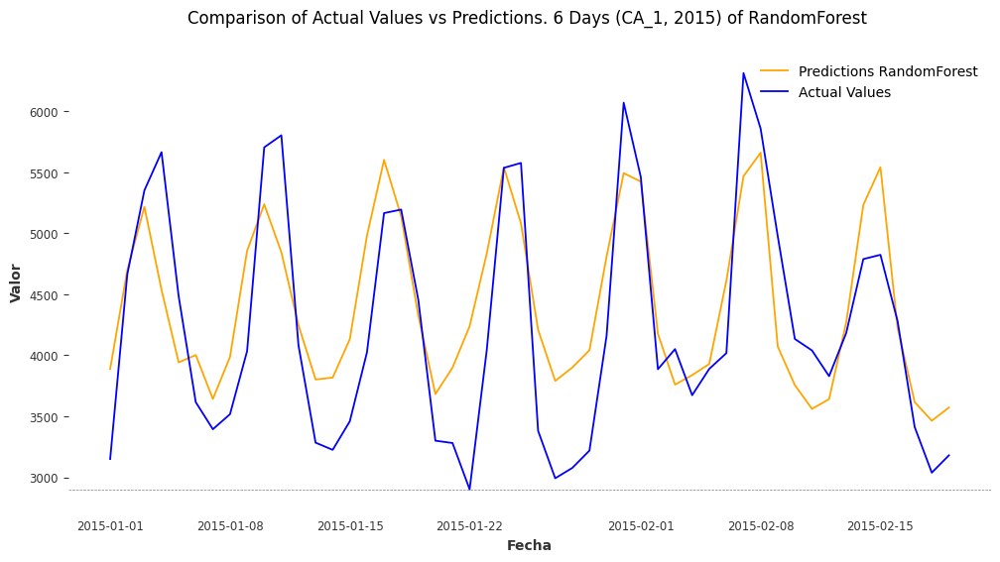

Testing with lags_model=7, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


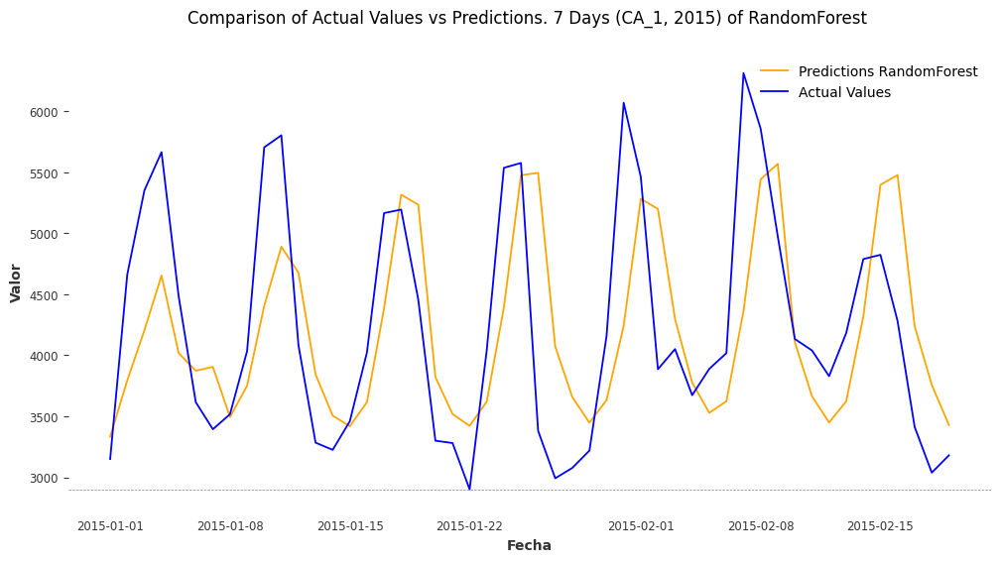

Testing with lags_model=7, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


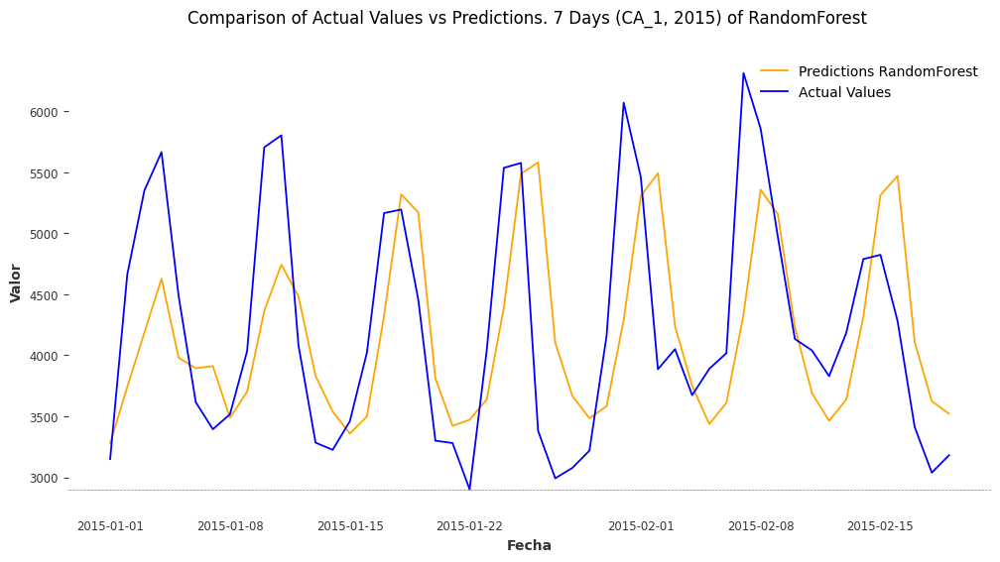

Testing with lags_model=24, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


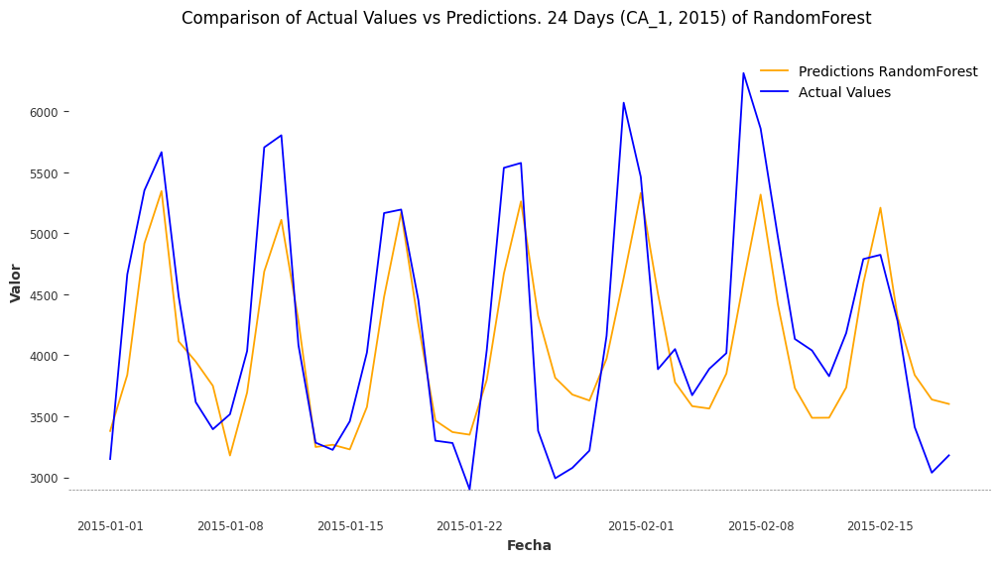

Testing with lags_model=24, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


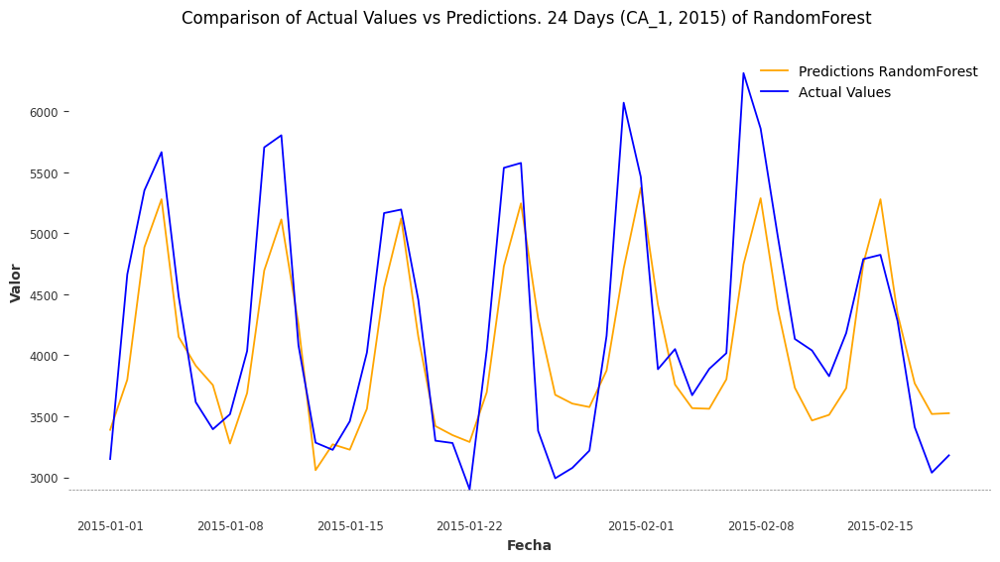

Testing with lags_model=28, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


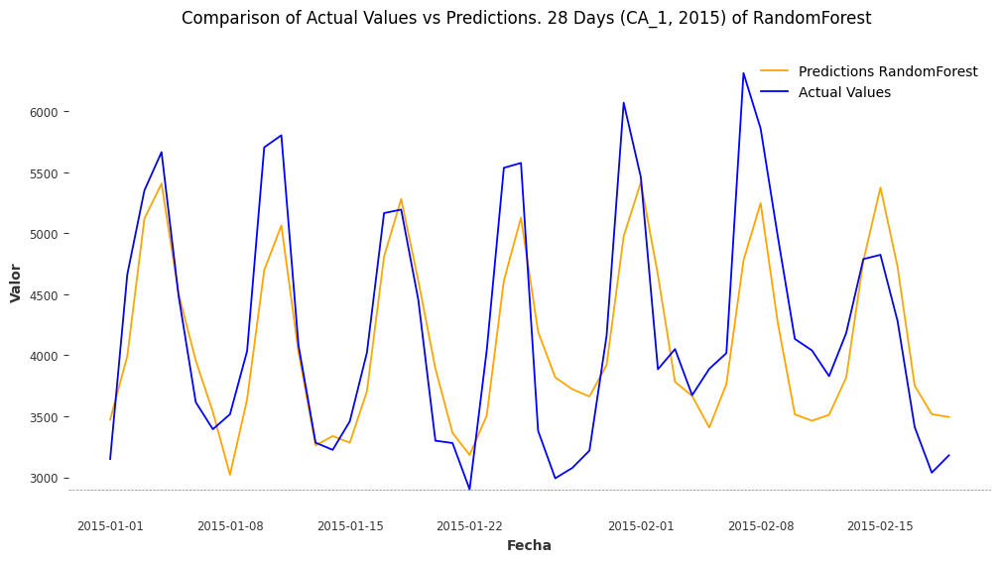

Testing with lags_model=28, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


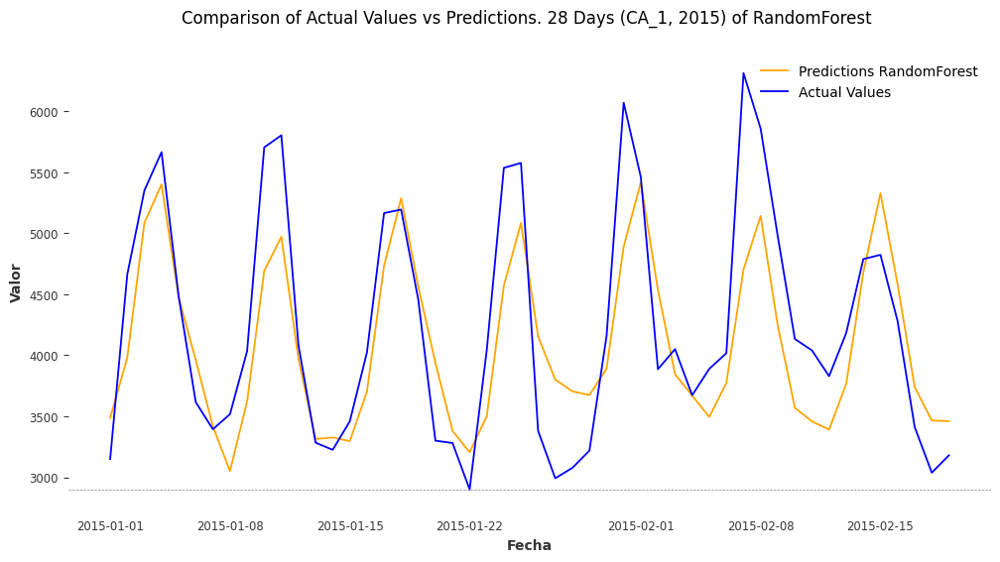

Testing with lags_model=72, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


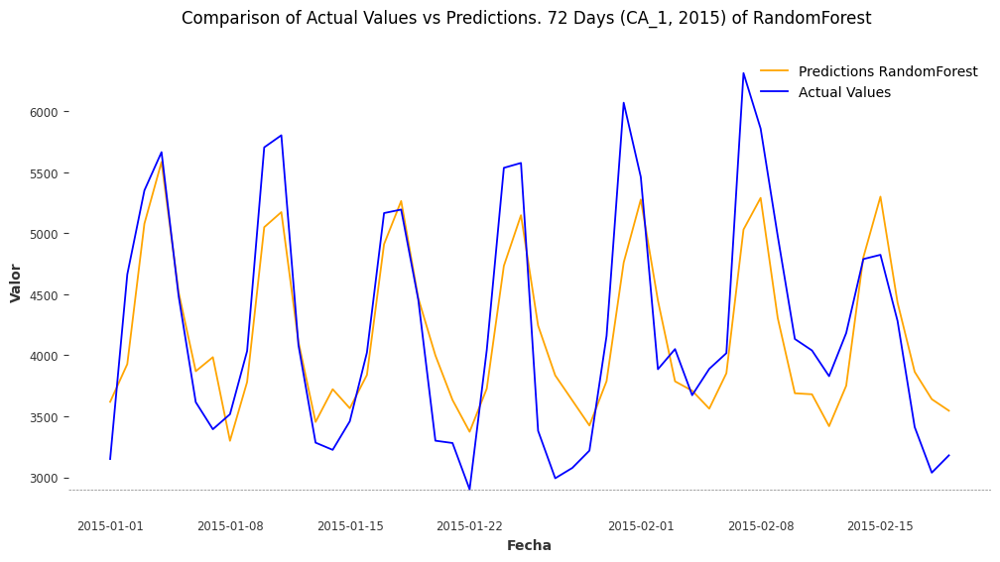

Testing with lags_model=72, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


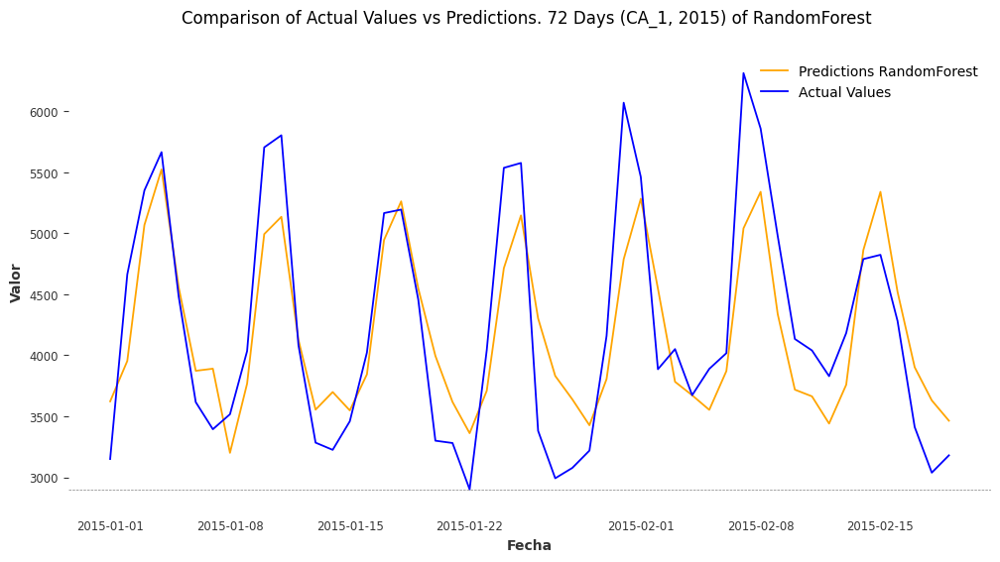

Testing with lags_model=84, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


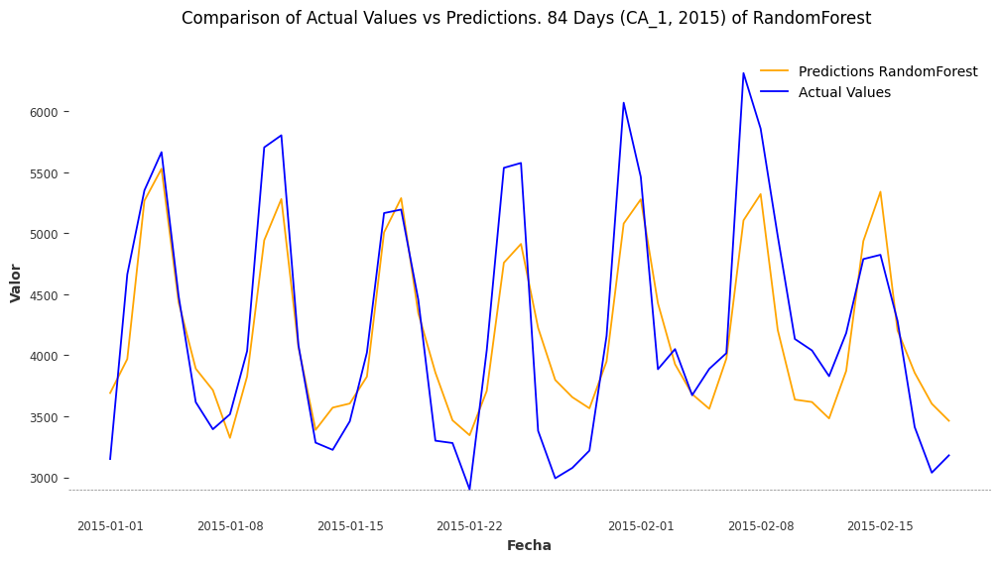

Testing with lags_model=84, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


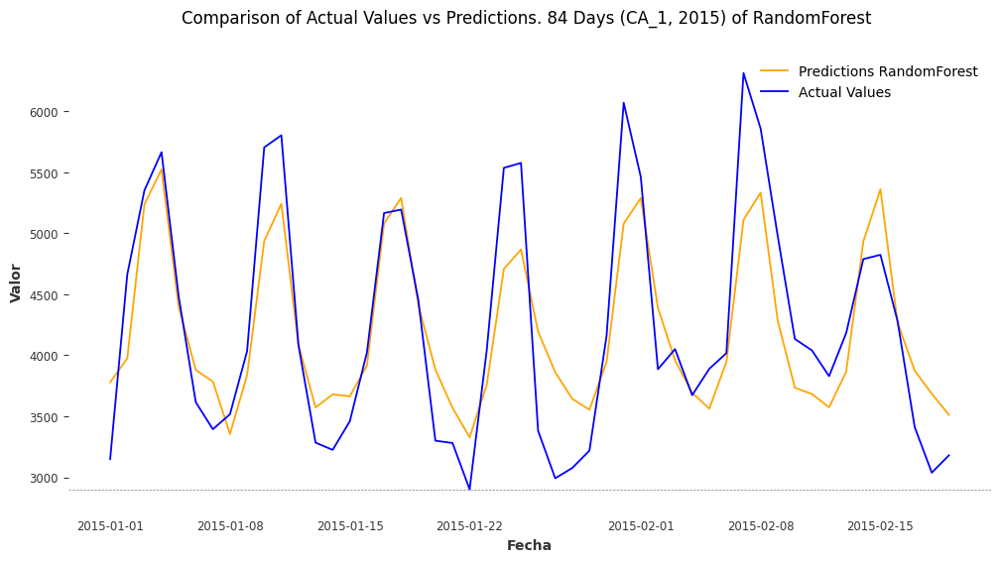

Testing with lags_model=144, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


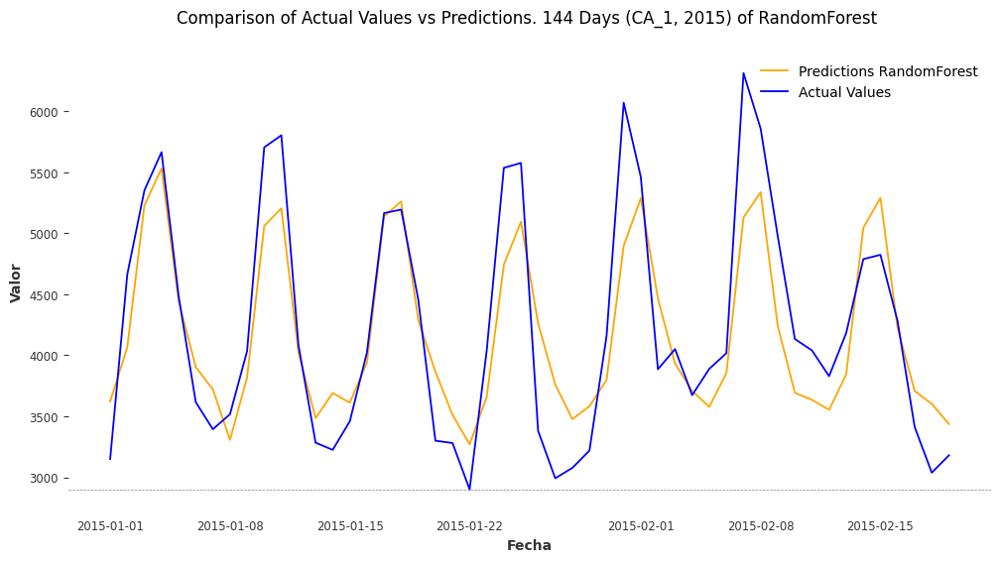

Testing with lags_model=144, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


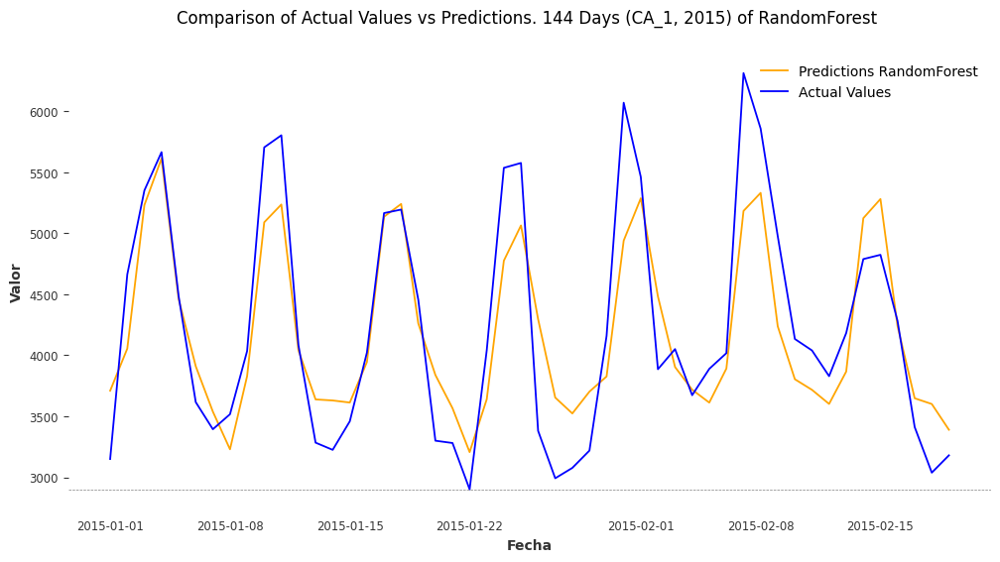

Testing with lags_model=168, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


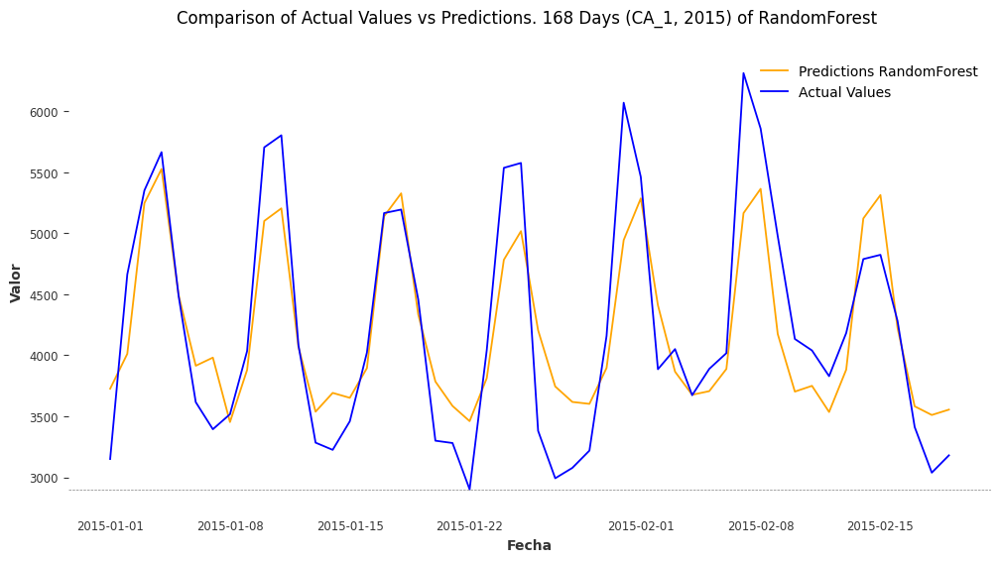

Testing with lags_model=168, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


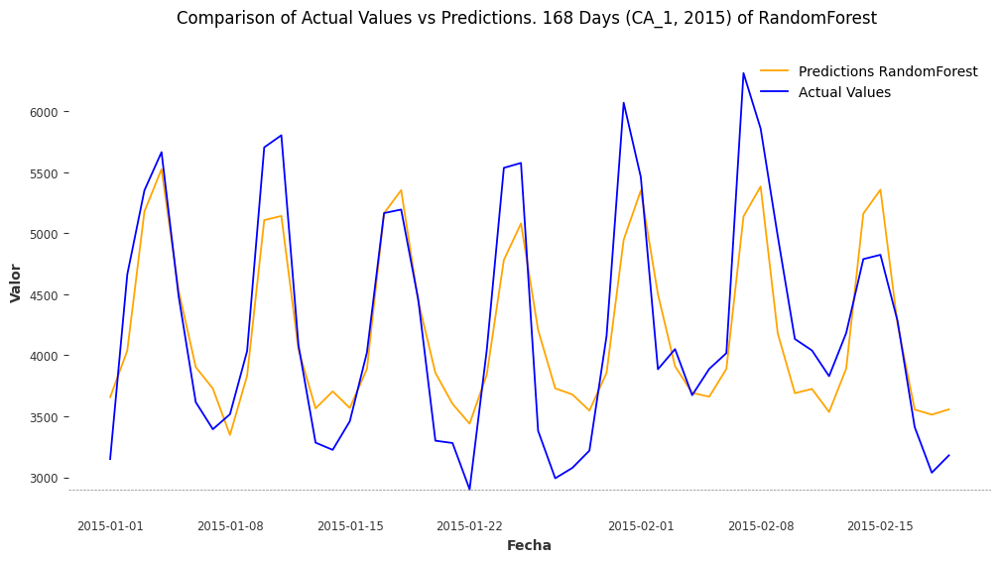

Testing with lags_model=288, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


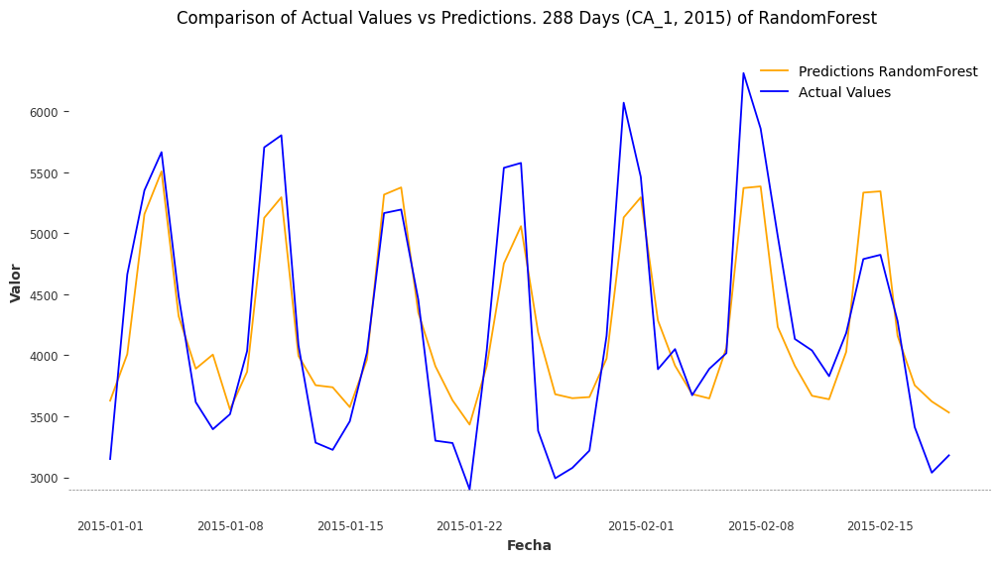

Testing with lags_model=288, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


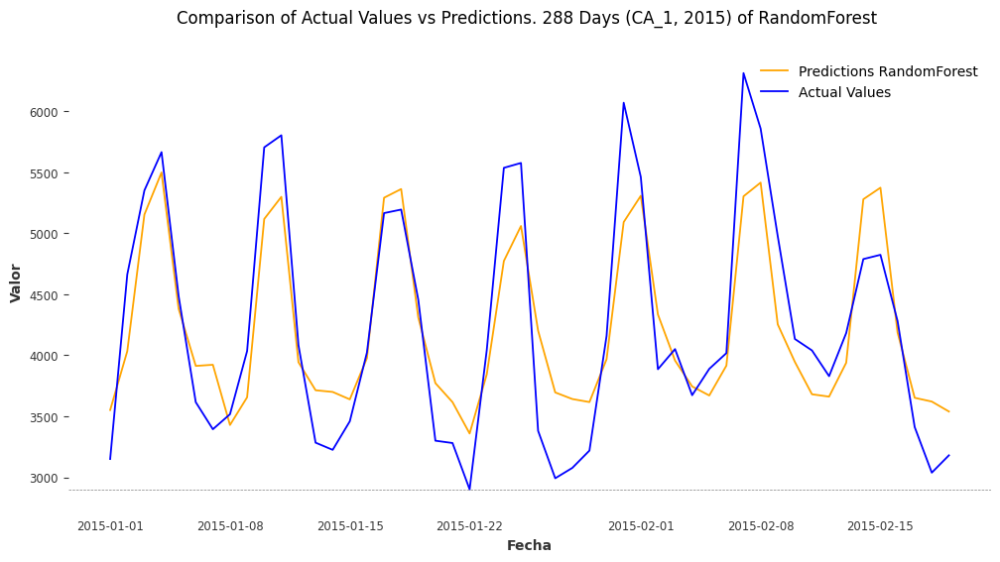

Testing with lags_model=336, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


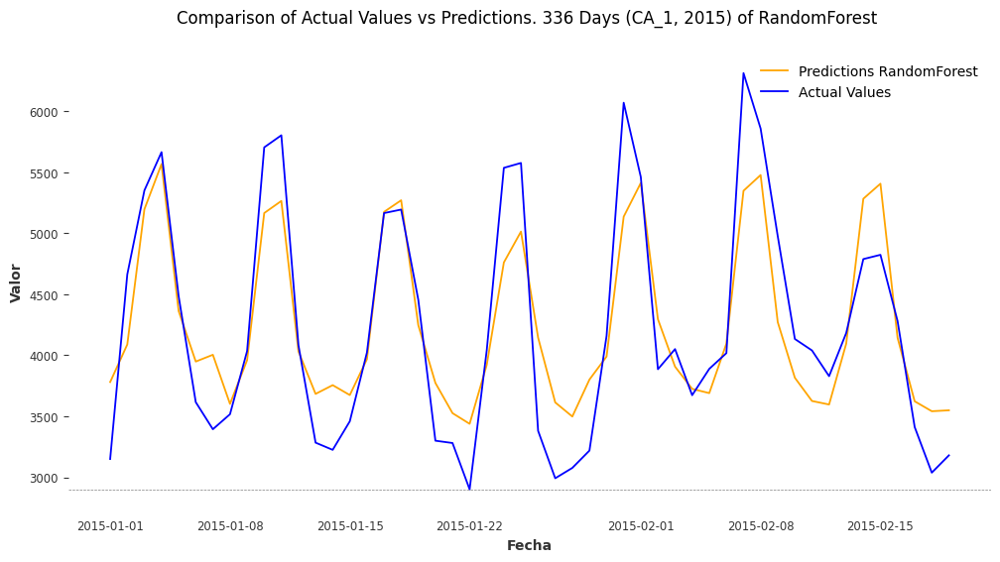

Testing with lags_model=336, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


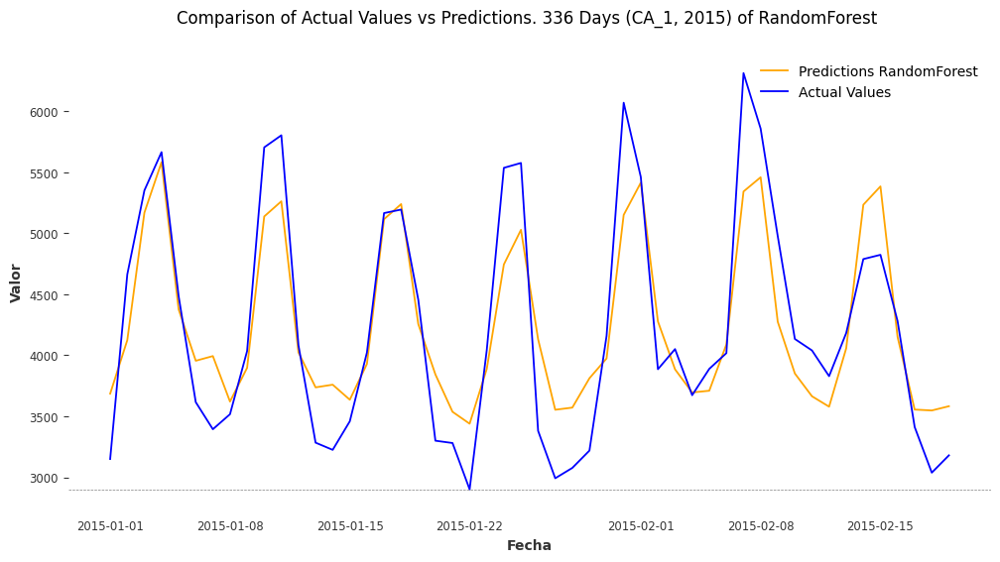

Testing with lags_model=364, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


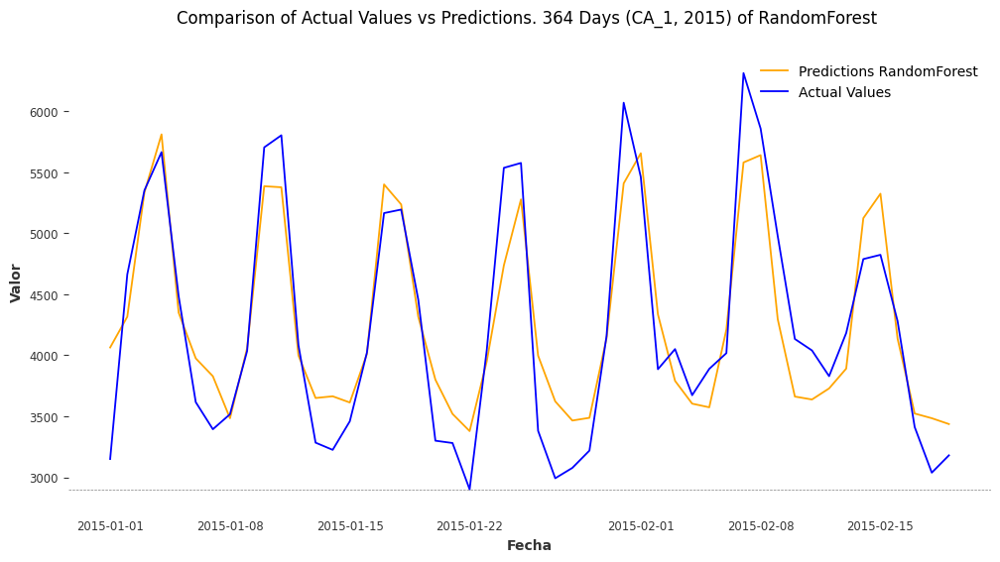

Testing with lags_model=364, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


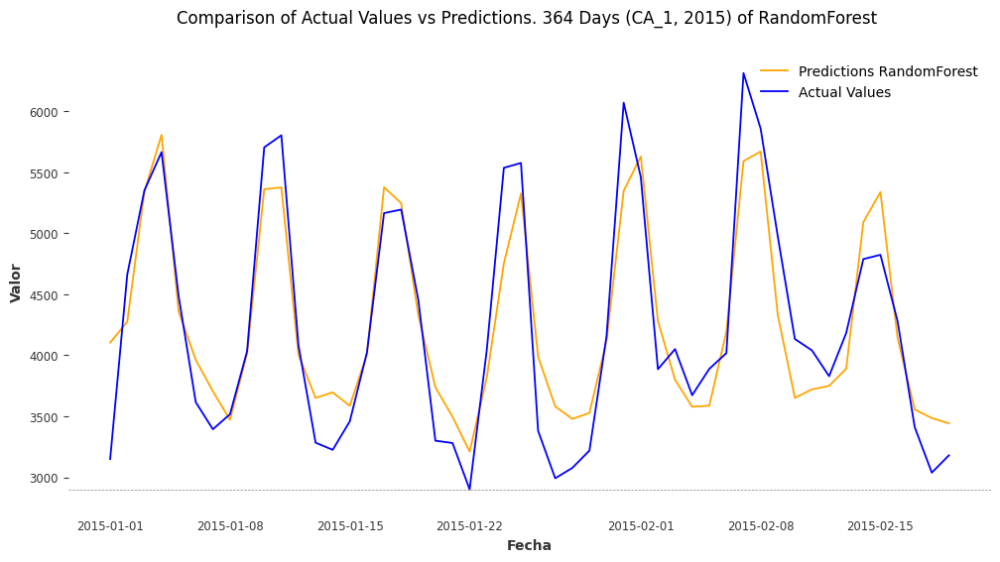

Testing with lags_model=365, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


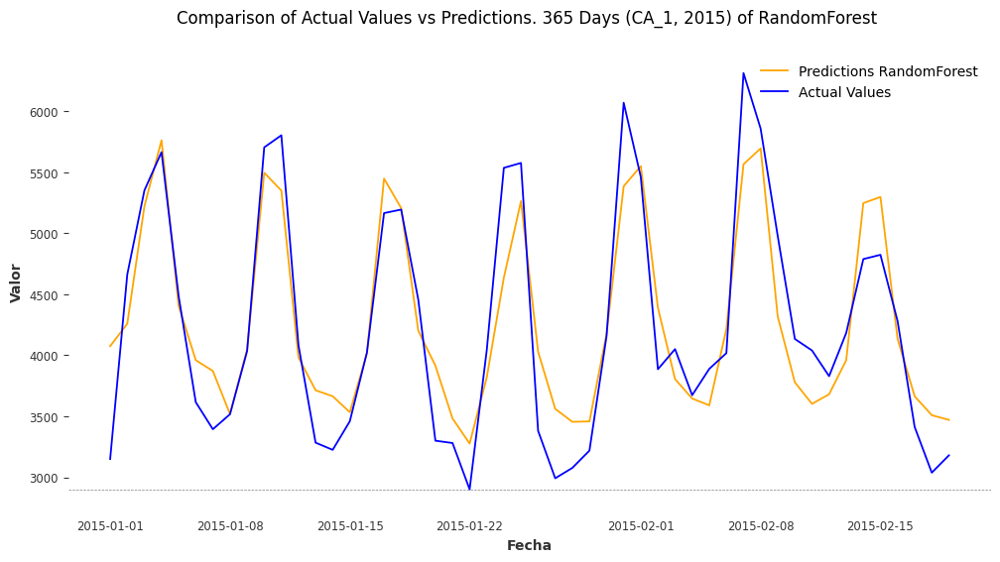

Testing with lags_model=365, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


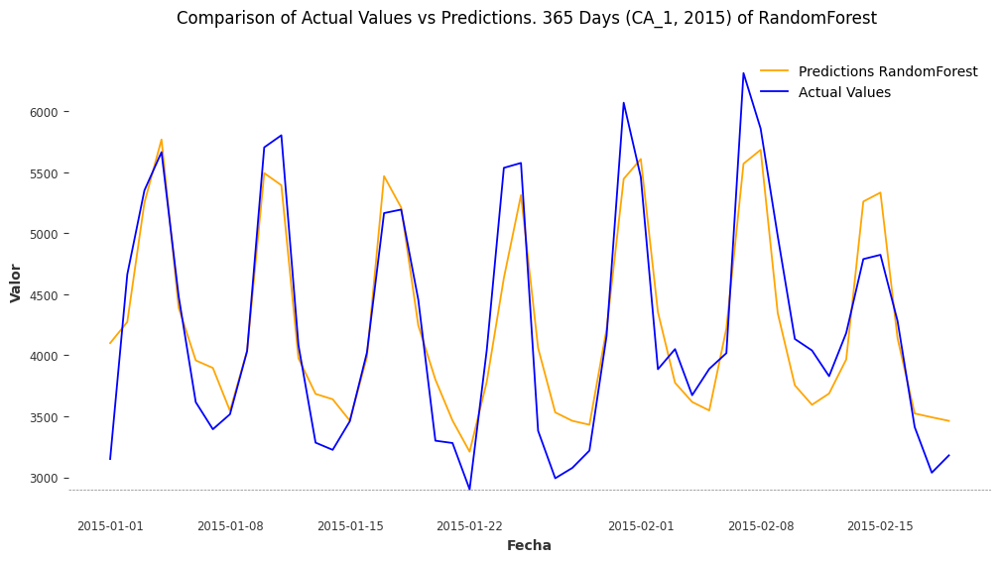

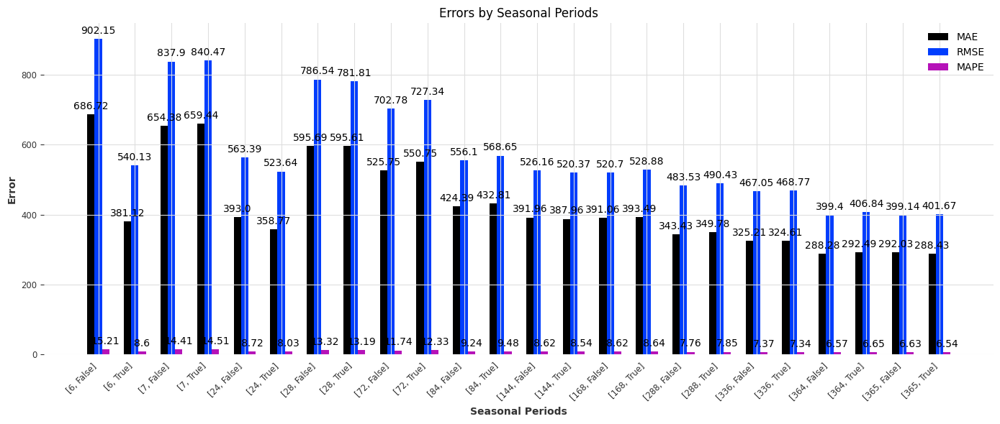

In [ ]:
# Define the different values for lagged_features, lags_model, and scaling
lags_model_values = [6, 7, 24, 28, 72, 84, 144, 168, 288, 336, 364, 365]
scaling_values = [False, True]

# Initialize an empty list to store the results
errors = []

# Loop through all combinations of lags_model, and scaling
for lags_model in lags_model_values:
    for scaling in scaling_values:
        print(f"Testing with lags_model={lags_model}, scaling={scaling}")

        # Run the cross-validation function for each combination of parameters
        extra_dates, true_values, predicted_values, end_of_training = cross_validation_RandomForest(
            stores_train, stores_test, lags_model, scaling=scaling
        )


        # Store the results and plot the predictions
        store = 'CA_1'
        days_to_plot = 50
        plot_predictions_zoom(
            store, extra_dates, true_values, predicted_values,
            "RandomForest", days_to_plot, lags_model, one_plot=True
        )

        # Compute the errors for the current combination of parameters
        mae_lgbm, rmse_lgbm, mape_lgbm = compute_errors(true_values, predicted_values)
        errors.append(([lags_model, scaling], mae_lgbm, rmse_lgbm, mape_lgbm))

# Plot all the errors
plot_errors(errors)


# Esto son pruebas de RandomForest y XGBoost con Darts

`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Testing with lags_model=6, scaling=False
Days to predict: 365


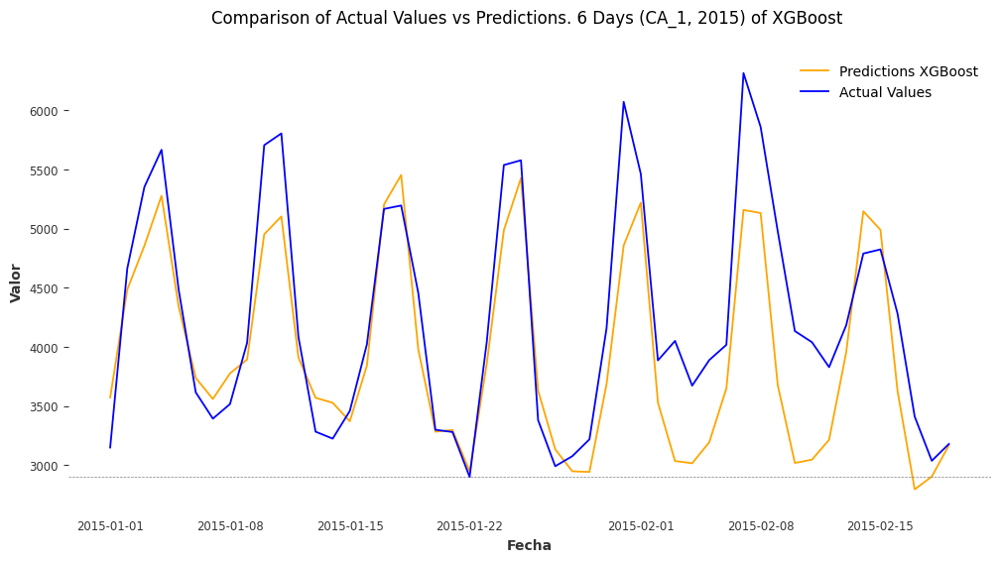

`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Testing with lags_model=6, scaling=True
Days to predict: 365


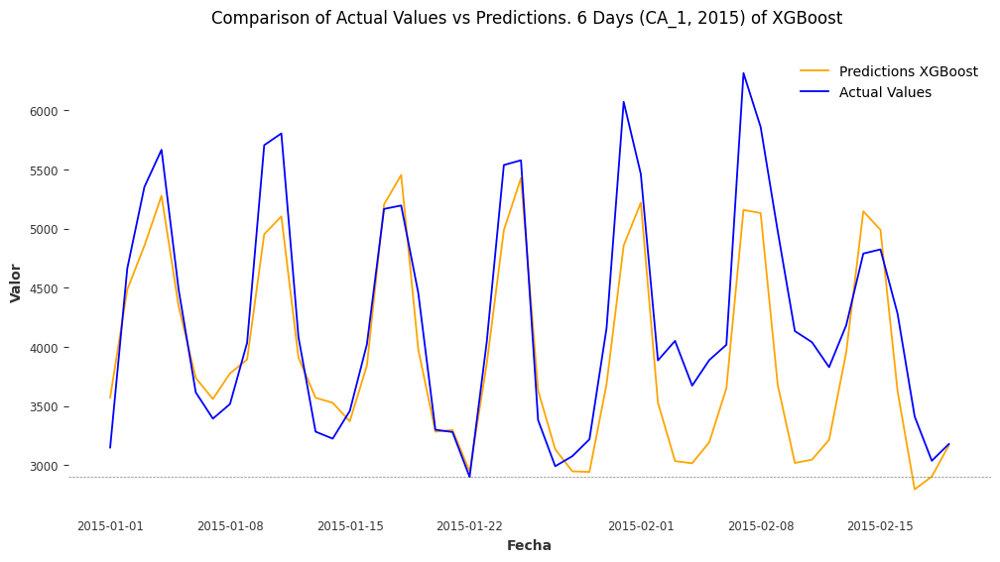

Testing with lags_model=7, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


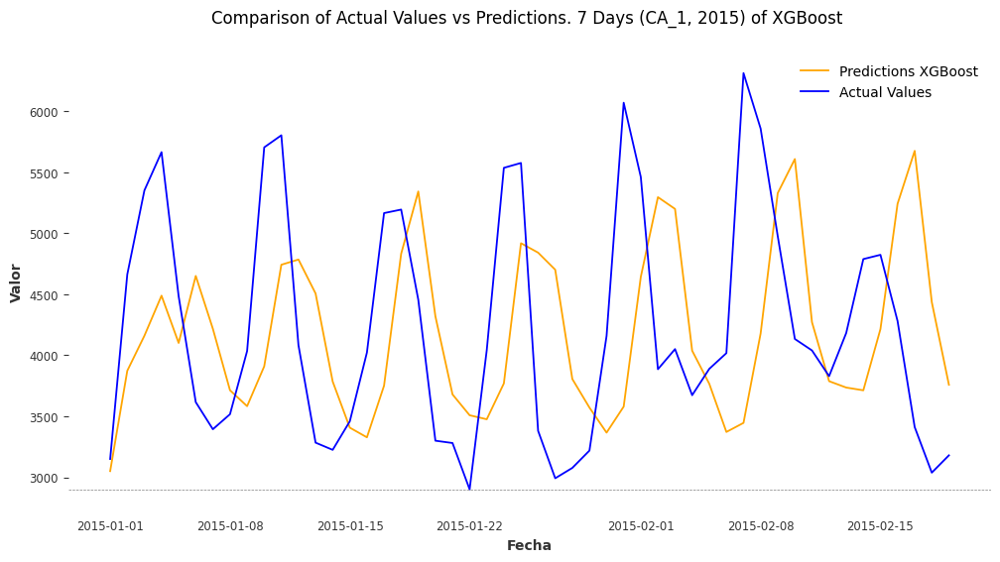

Testing with lags_model=7, scaling=True
Days to predict: 365


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


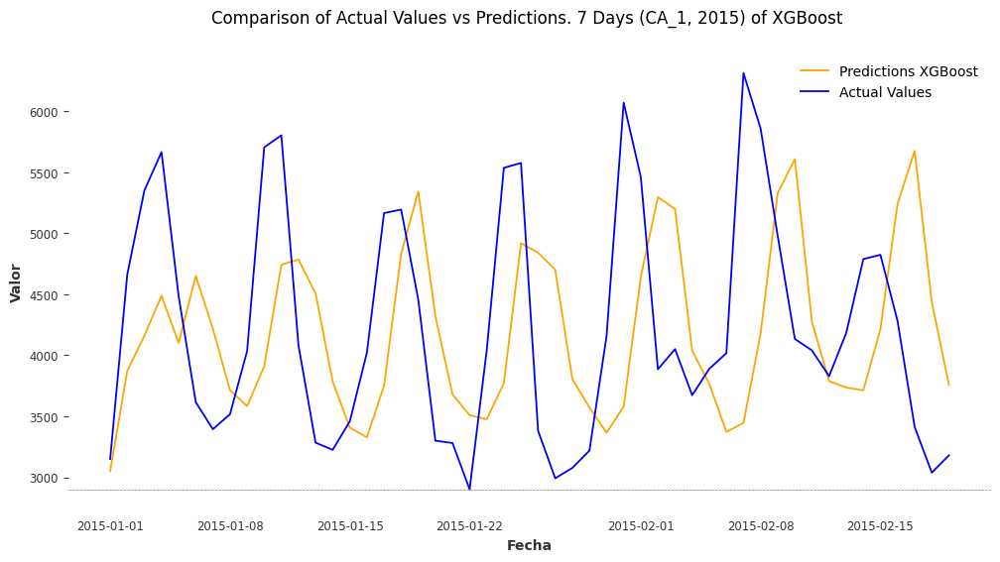

Testing with lags_model=24, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


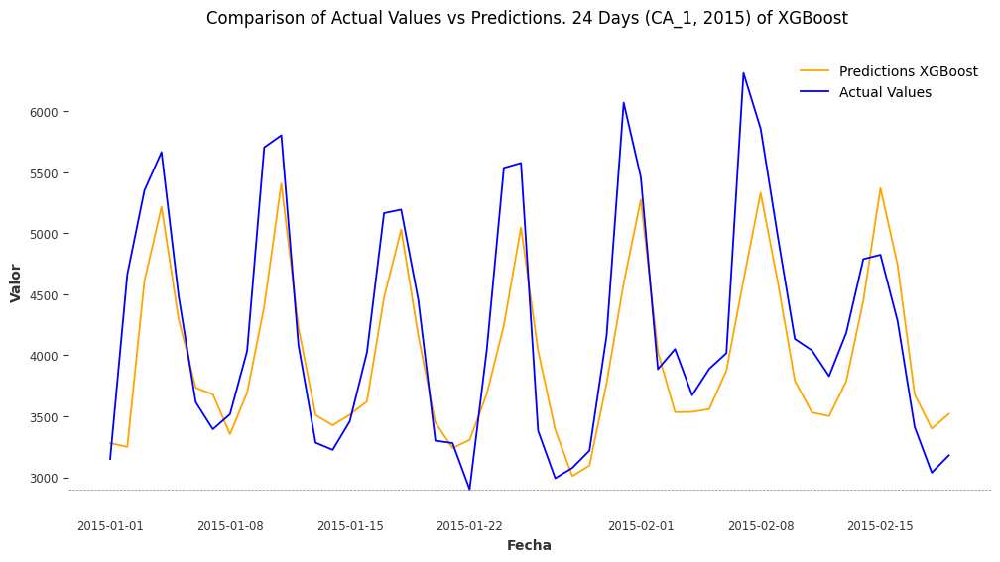

Testing with lags_model=24, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


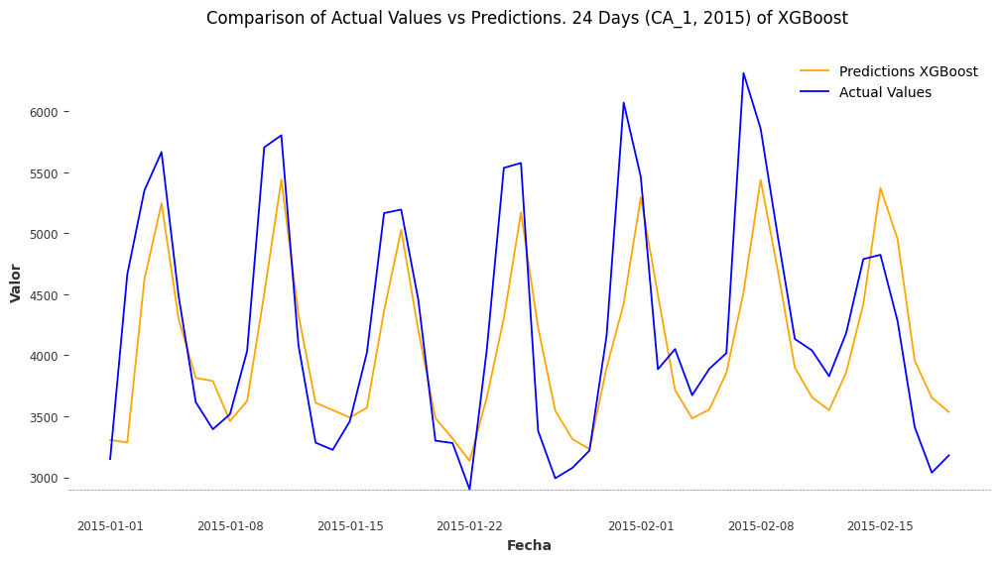

Testing with lags_model=28, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


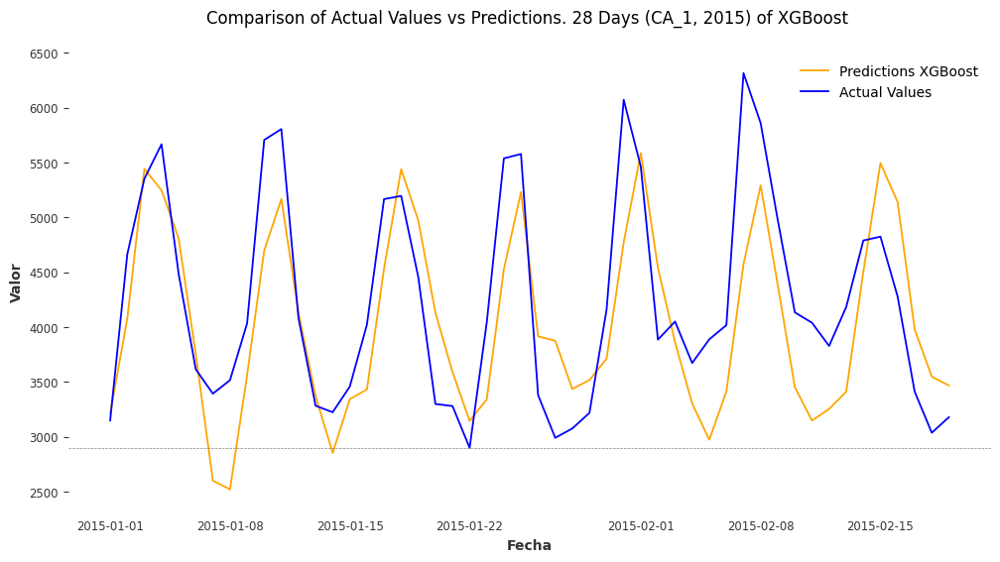

Testing with lags_model=28, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


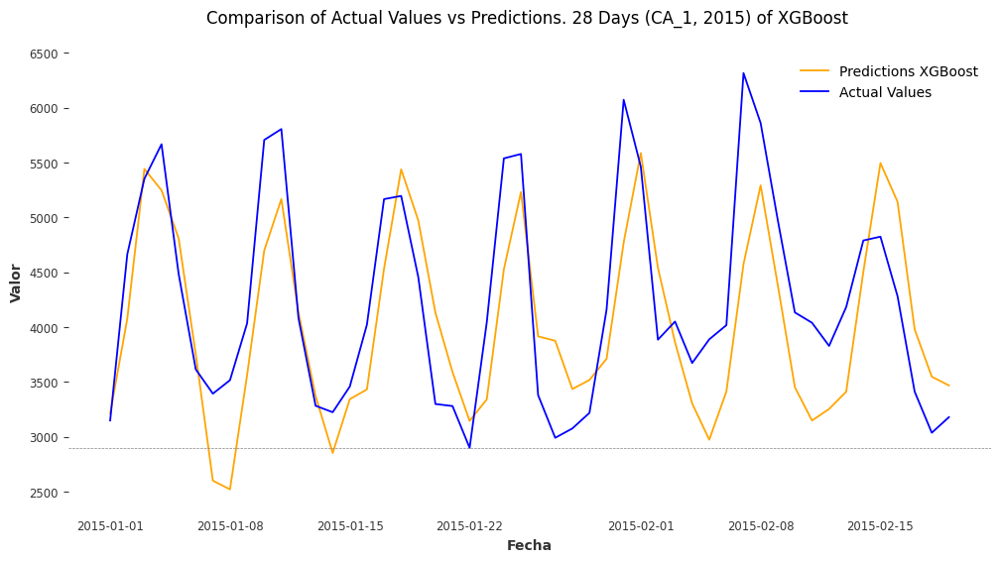

Testing with lags_model=72, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


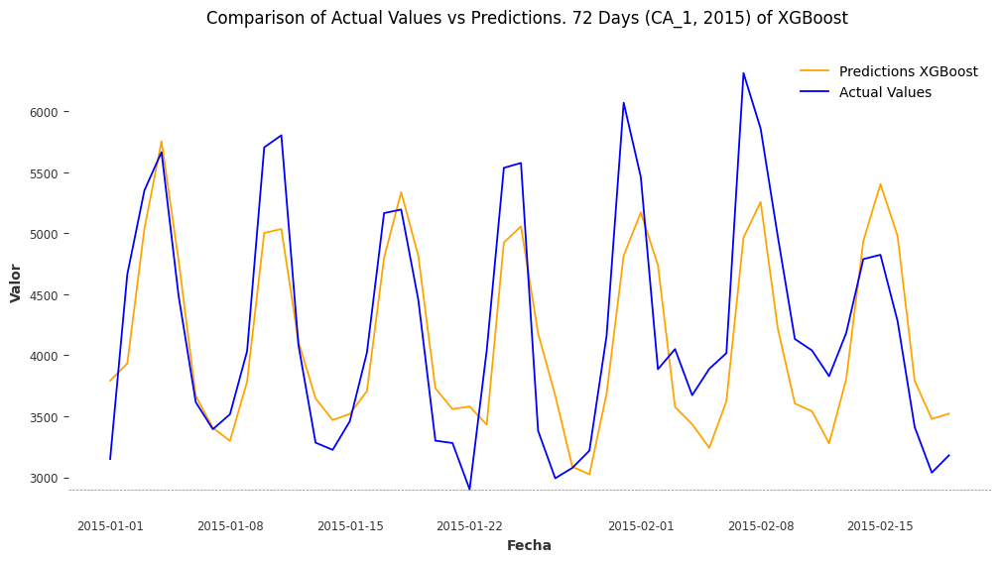

Testing with lags_model=72, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


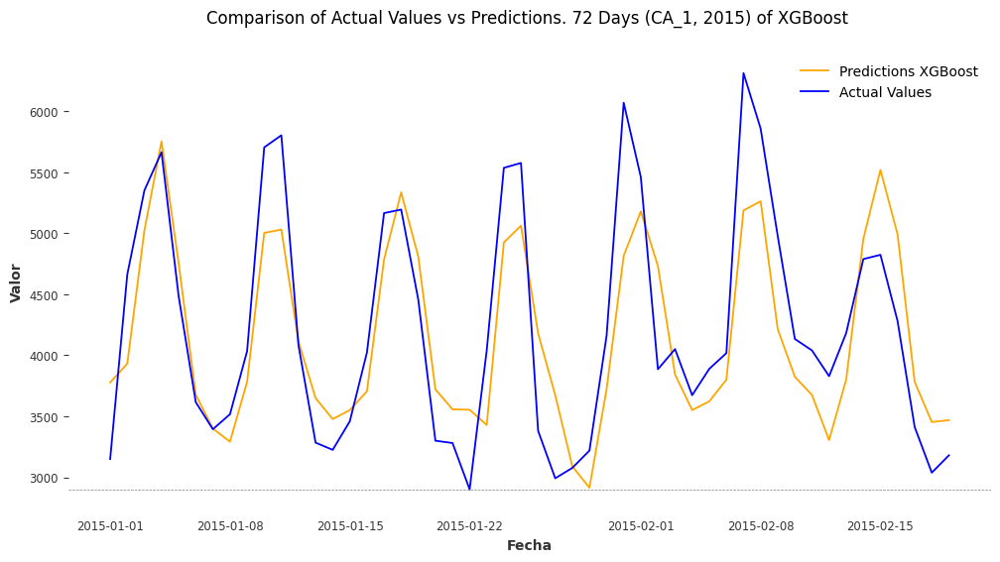

Testing with lags_model=84, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


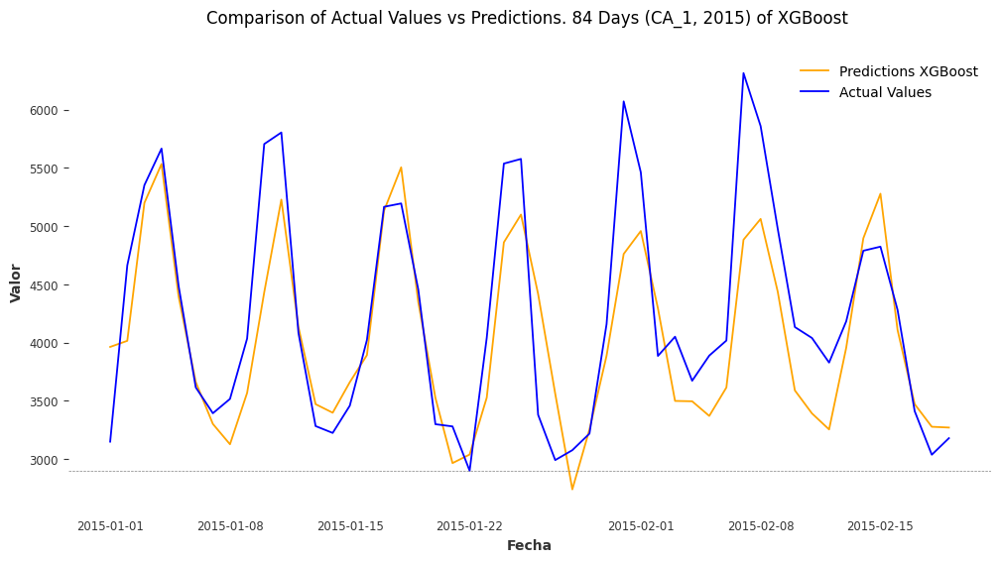

Testing with lags_model=84, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


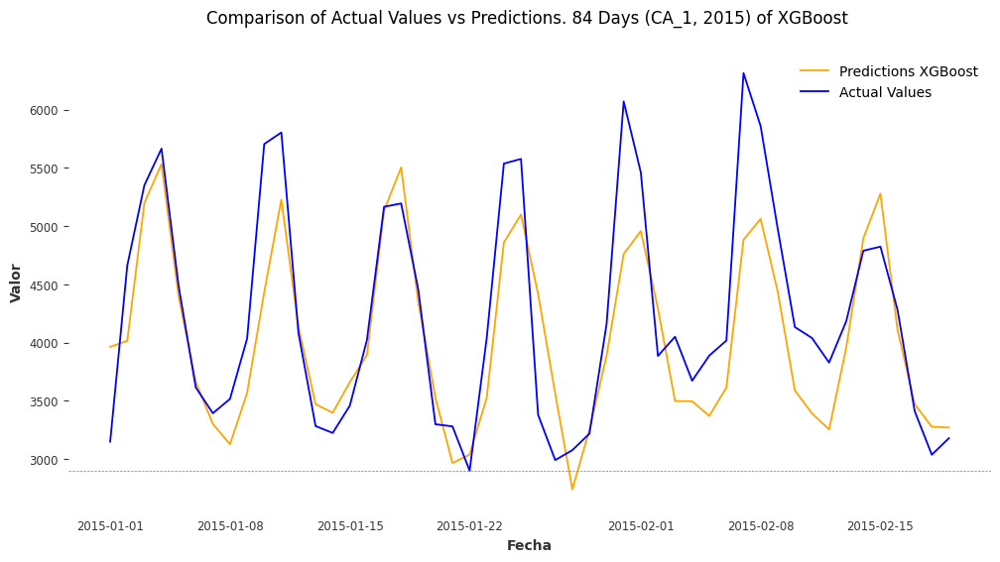

Testing with lags_model=144, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


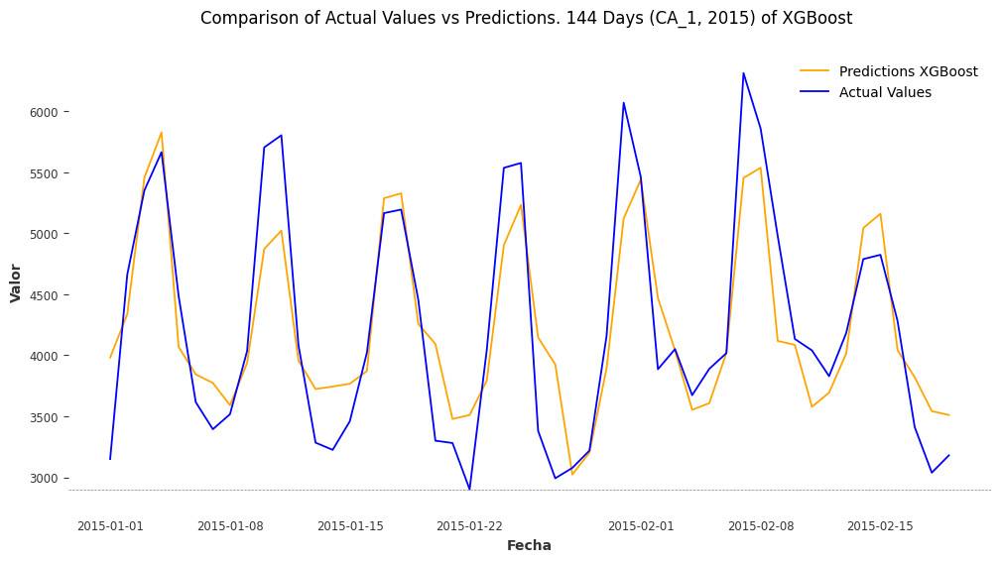

Testing with lags_model=144, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


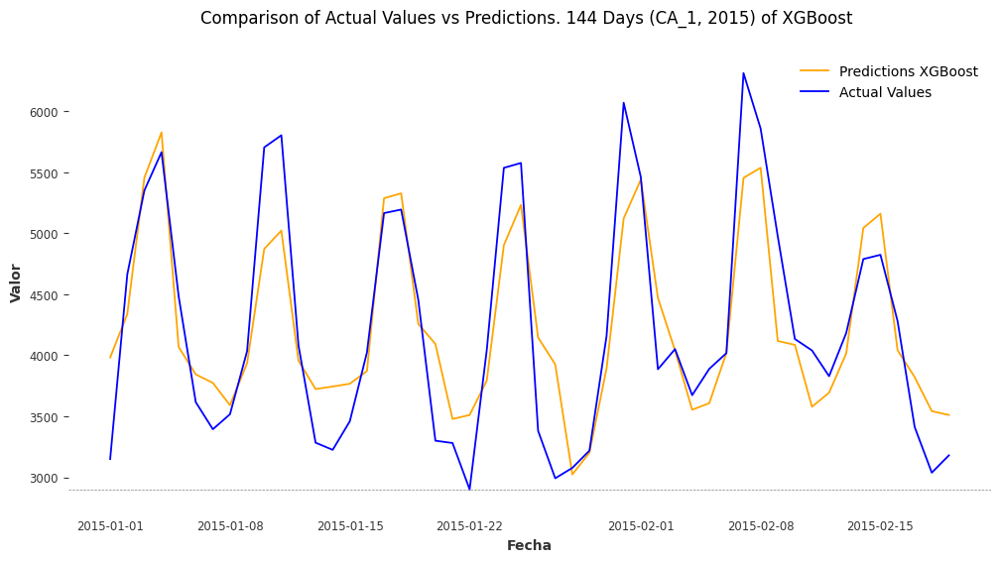

Testing with lags_model=168, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


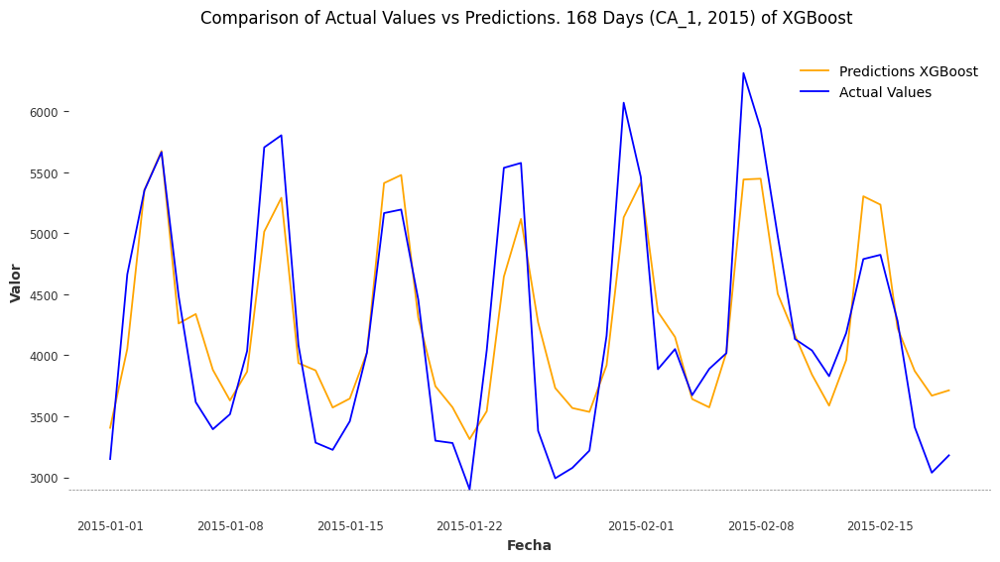

Testing with lags_model=168, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


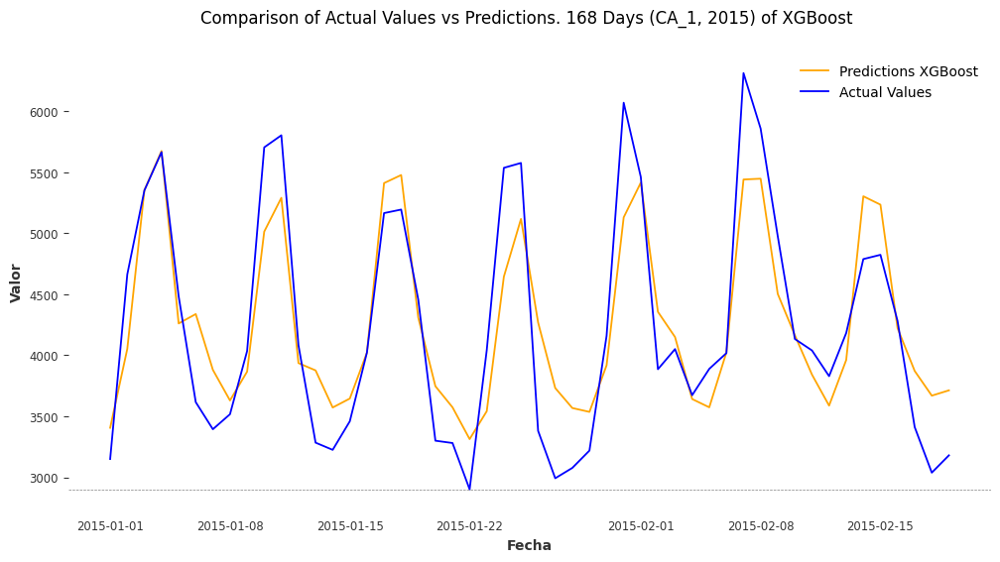

Testing with lags_model=288, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


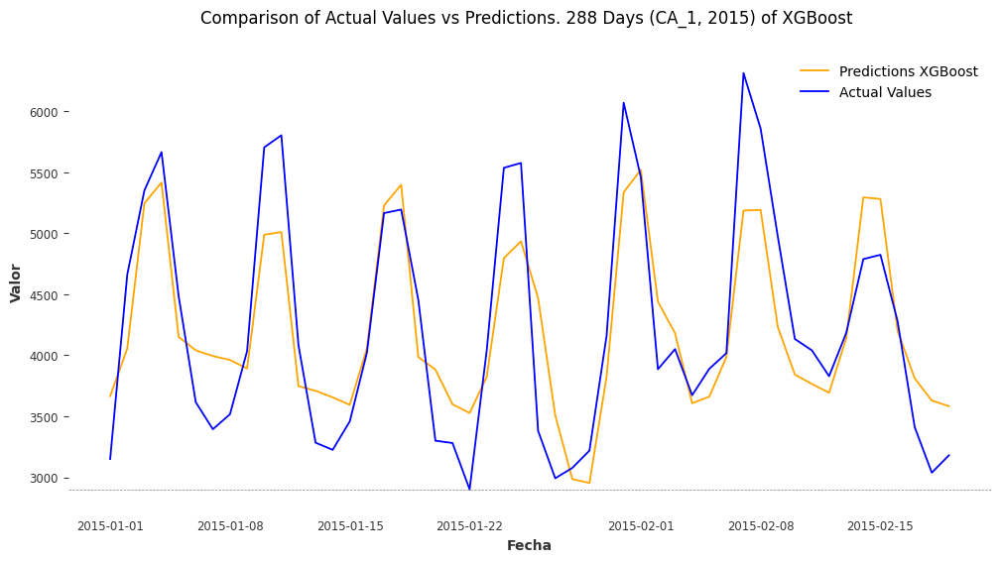

Testing with lags_model=288, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


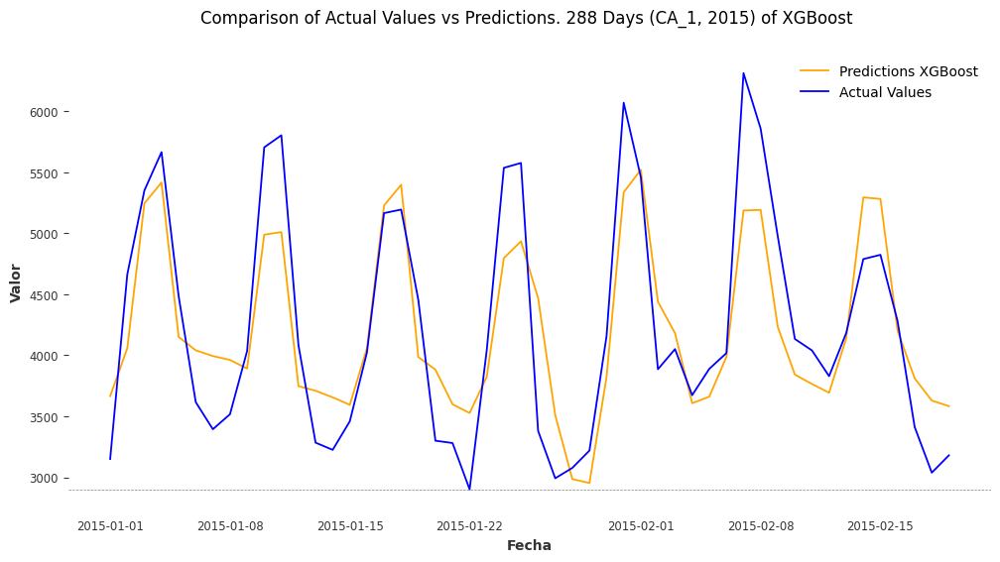

Testing with lags_model=336, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


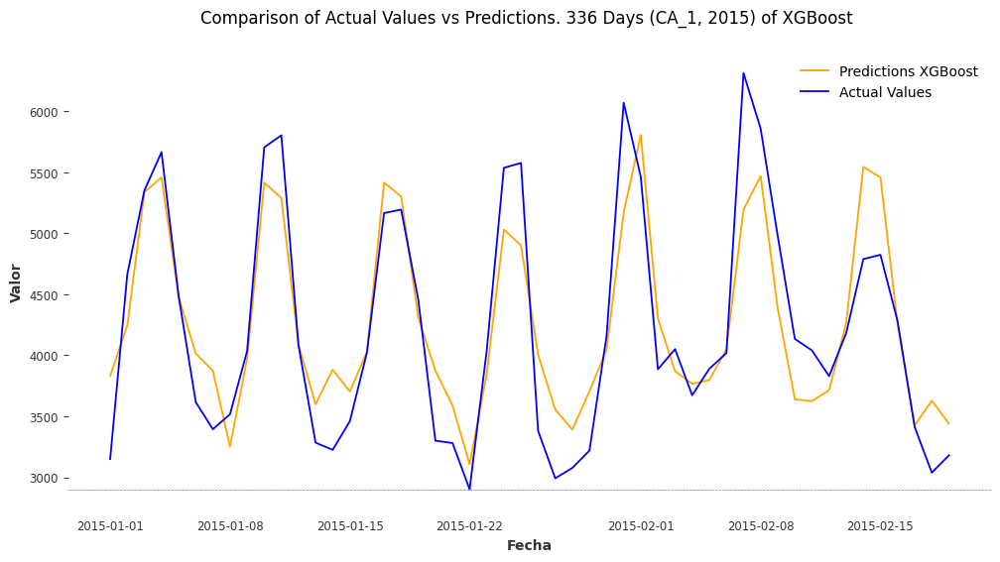

Testing with lags_model=336, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


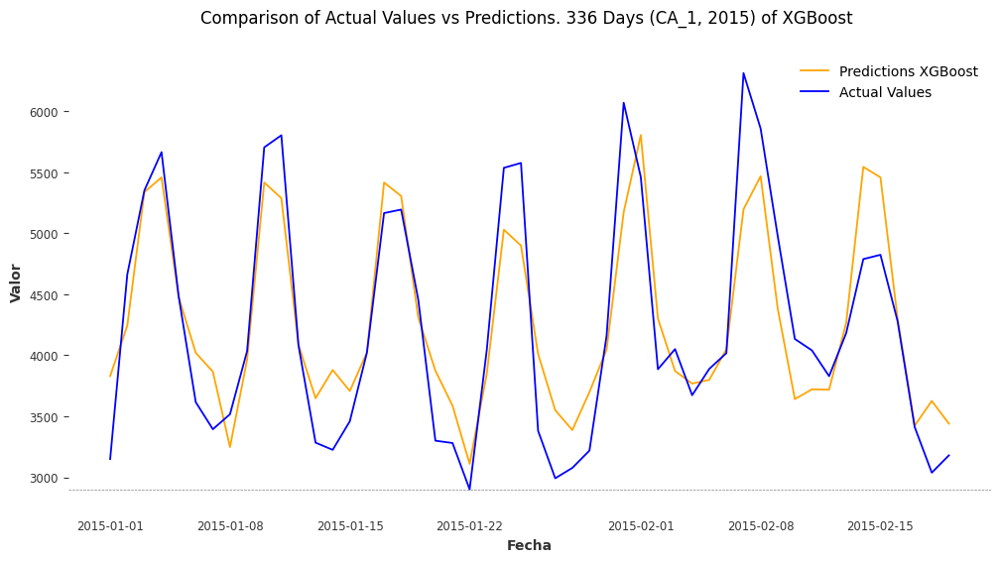

Testing with lags_model=364, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


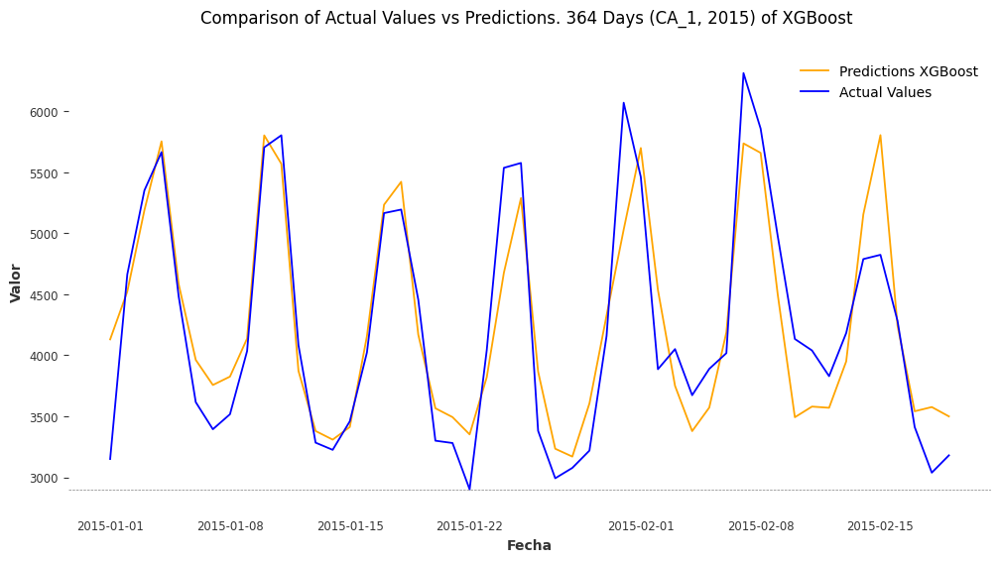

Testing with lags_model=364, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


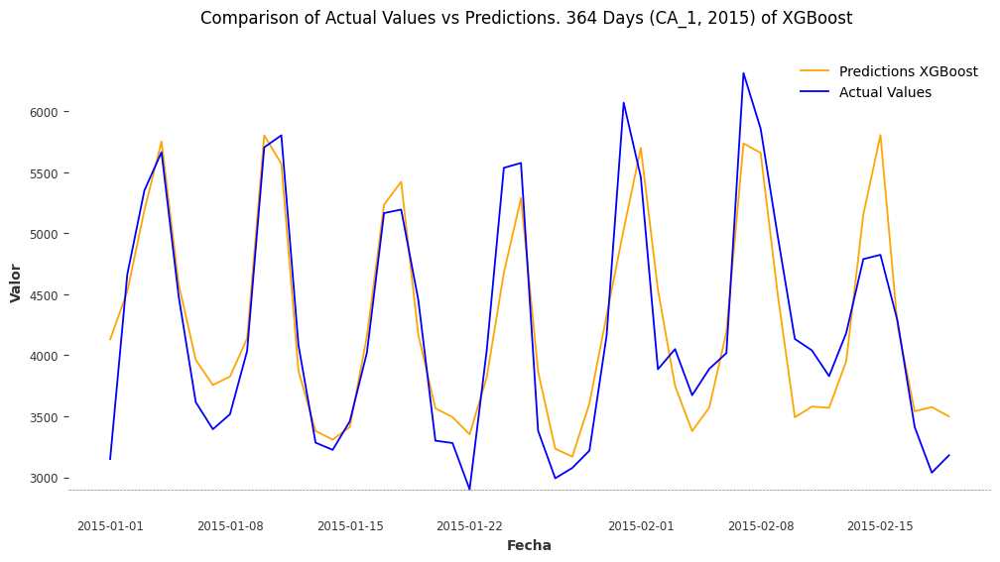

Testing with lags_model=365, scaling=False


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


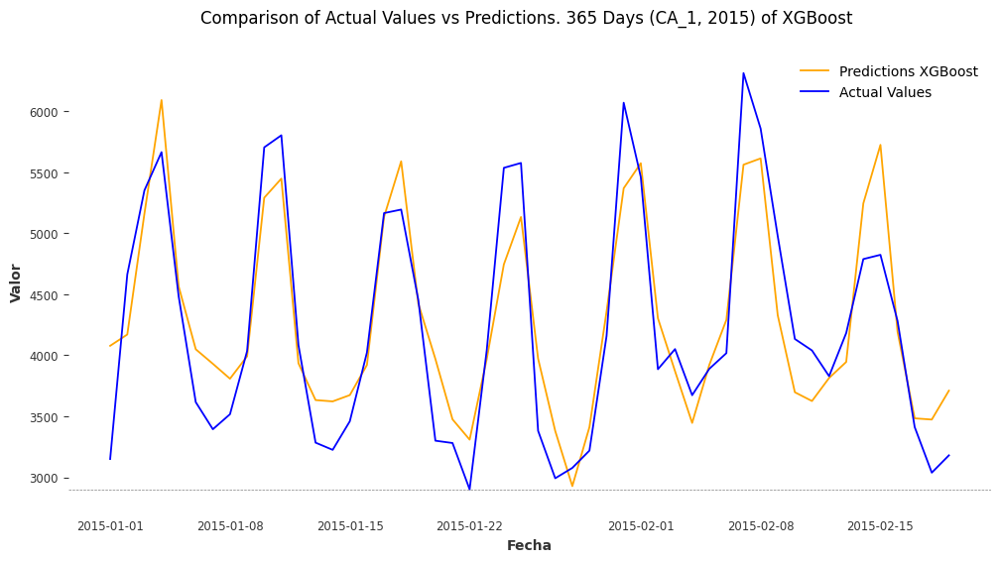

Testing with lags_model=365, scaling=True


`predict()` was called with `n > output_chunk_length`: using auto-regression to forecast the values after `output_chunk_length` points. The model will access `(n - output_chunk_length)` future values of your `past_covariates` (relative to the first predicted time step). To hide this warning, set `show_warnings=False`.


Days to predict: 365


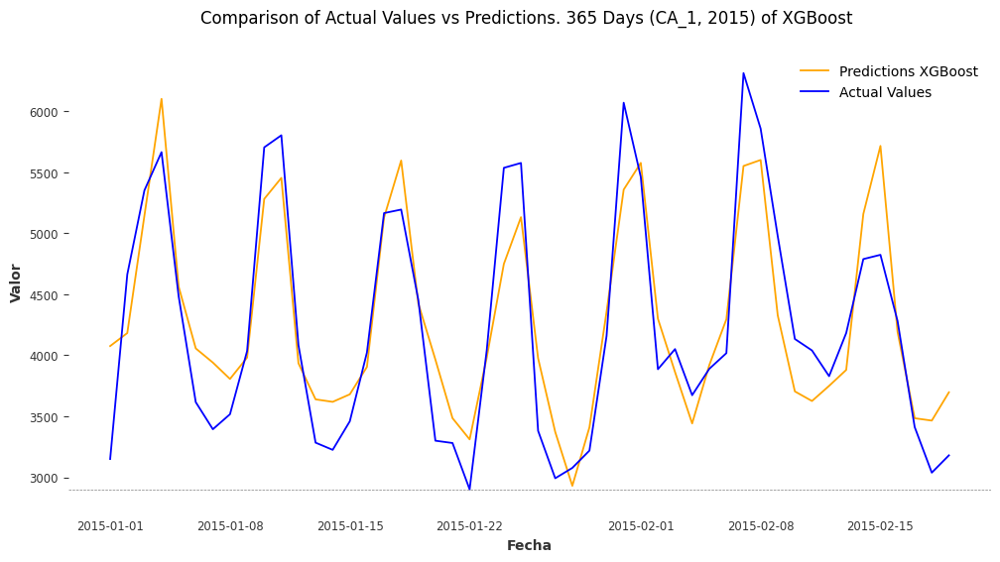

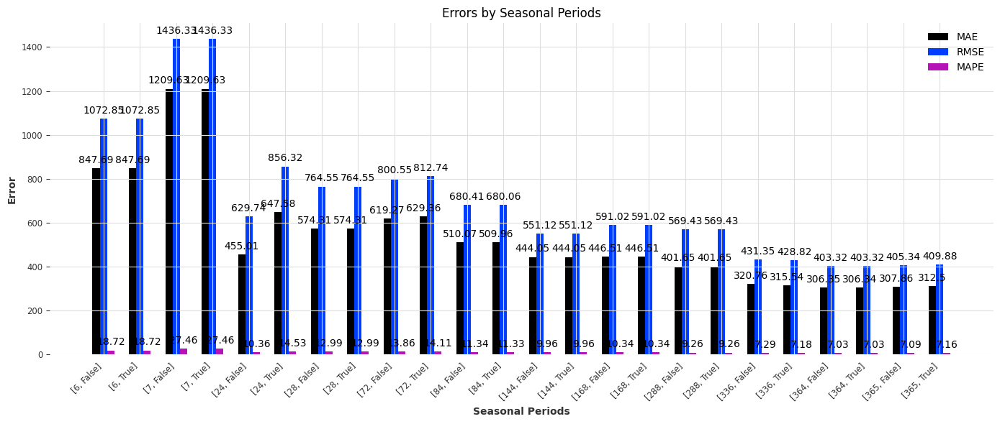

In [ ]:
# Define the different values for lagged_features, lags_model, and scaling
lags_model_values = [6, 7, 24, 28, 72, 84, 144, 168, 288, 336, 364, 365]
scaling_values = [False, True]

# Initialize an empty list to store the results
errors = []

# Loop through all combinations of lags_model, and scaling
for lags_model in lags_model_values:
    for scaling in scaling_values:
        print(f"Testing with lags_model={lags_model}, scaling={scaling}")

        # Run the cross-validation function for each combination of parameters
        extra_dates, true_values, predicted_values, end_of_training = cross_validation_XGBoost(
            stores_train, stores_test, lags_model, scaling=scaling
        )


        # Store the results and plot the predictions
        store = 'CA_1'
        days_to_plot = 50
        plot_predictions_zoom(
            store, extra_dates, true_values, predicted_values,
            "XGBoost", days_to_plot, lags_model, one_plot=True
        )

        # Compute the errors for the current combination of parameters
        mae_lgbm, rmse_lgbm, mape_lgbm = compute_errors(true_values, predicted_values)
        errors.append(([lags_model, scaling], mae_lgbm, rmse_lgbm, mape_lgbm))

# Plot all the errors
plot_errors(errors)
